<a href="https://colab.research.google.com/github/ccc-frankfurt/Practical_ML_WS19/blob/master/week14/Metalearning_reinforce_solution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Reinforce applied to recognition of hand-written digits (MNIST)

In this session we will use the reinforce algorithm as a meta-learning algorithm to find suitable fully connected neural network architectures for the task of hand-written digit recognition (MNIST dataset). The notebook is based on the code of Sina Ditzel (for her master thesis).

Thus, our environment will be neural networks, learning to perform the MNIST task, while the reinforcement meta-learning reward is given by each network's accuracy. To simplify, we will fix the neural network depth and the environmental state will encode the amount of units in a layer and an action will be to choose this amount.

Our agent will be modelled with another neural network (an LSTM). So, we will basically train a neural network to train other neural networks.

![drawing](https://dvl.in.tum.de/img/lectures/automl.png)
The figure is from https://arxiv.org/pdf/1611.01578.pdf

Let us first define a network skeleton which we will use for MNIST (Net) and a class which will evaluate the accuracy of our individual networks (EvalNetwork).

In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.autograd import Variable
from torch.distributions import Categorical

import torchvision
import torchvision.transforms as transforms

import pickle
import numpy as np
import copy
import os

from itertools import count
import random
import math

import matplotlib
import matplotlib.pyplot as plt

plt.ion()

manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.cuda.manual_seed(manualSeed)

Random Seed:  999


In [0]:
# Net: 28*28 input, 2 fully connected hidden layer, 10 output/classes
class Net(nn.Module):

    def __init__(self, x1, x2):
        super(Net, self).__init__()
        # create a 3-Layer neural network. 
        # Your input dimension for MNIST is 28*28 
        # and your final output dimension is 10 (classes)
        # This is because the task is to classify digits.
        self.fc1 = nn.Linear(28*28 ,x1)
        self.fc2 = nn.Linear(x1, x2)
        self.fc3 = nn.Linear(x2, 10)

    def forward(self, x):
        # reshape your input appropriately (for a fully connected NN-layer)
        x = x.view(-1, self.num_flat_features(x))
        # transform your input: ReLU(fc1) -> ReLU(fc2) -> fc3
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        # we don't need the nonlinearity after fc3, 
        # because the CrossEntropyLoss already includes it
        x = self.fc3(x)
        return x

    # this method calculates the dimensionality of the flattened input
    # useful for image-input to be propagated through a fully connected NN
    def num_flat_features(self, x):
        size = x.size()[1:]  # all dimensions except the batch dimension
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

# This class evaluates the network on MNIST for given choises of units. 
# The result (number of units and accuracy) is saved in a dictionary.
# Thus, if a network has already been trained for that unit pair, 
# it does not need to be trained again.
class EvalNetwork():

    def __init__(self):
        self.epochs = 5
        self.dict = {}
        self.load_dict()
        self.criterion = nn.CrossEntropyLoss()
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        print(self.device)

        transform = transforms.Compose(
            [transforms.ToTensor(),
             transforms.Normalize((0.5,), (0.5,))])

        # load your data
        # Hint: use torchvision
        self.trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                                download=True, transform=transform)
        self.testset = torchvision.datasets.MNIST(root='./data', train=False,
                                               download=True, transform=transform)
        
        self.trainloader = torch.utils.data.DataLoader(self.trainset, batch_size=128,
                                          shuffle=True)
        self.testloader = torch.utils.data.DataLoader(self.testset, batch_size=128,
                                         shuffle=False)
        
        # create a directory where the accuracies for trained nets will be saved
        if not os.path.exists('obj'):
            os.mkdir('obj')

    def save_dict(self):
        with open('obj/'+ "netaccuracys_MNIST" + '.pkl', 'wb') as f:
            pickle.dump(self.dict, f, pickle.HIGHEST_PROTOCOL)

    def load_dict(self):
        try:
            with open('obj/' + "netaccuracys_MNIST" + '.pkl', 'rb') as f:
                self.dict = pickle.load(f)
            print("load dict with already %i trained nets"%(len(self.dict)))

        except:
            print("could not load dict with saved network accuracys, dict empty")

    def trainNet(self):
        # train your net
        for epoch in range(self.epochs):  # loop over the dataset multiple times
            running_loss = 0.0
            for i, data in enumerate(self.trainloader, 0):
                # get the inputs
                inputs, labels = data
                inputs, labels = inputs.to(self.device), labels.to(self.device)

                # zero the parameter gradients
                self.optimizer.zero_grad()

                # forward + backward + optimize
                outputs = self.net(inputs)
                loss = self.criterion(outputs, labels)
                loss.backward()
                self.optimizer.step()

                # print statistics
                running_loss += loss.item()

    def accuracy(self,dataloader):
        correct_sum = 0
        total = 0
        for i, data in enumerate(dataloader, 0):
            inputs,labels = data
            inputs, labels = inputs.to(self.device), labels.to(self.device)
            outputs = self.net(inputs)

            # calculate the number of correctly classified instances
            correct = np.sum(outputs.data.cpu().numpy().argmax(axis=1) == labels.data.cpu().numpy().astype(int))
            correct_sum += correct
            total += inputs.shape[0]
        
        # return the ratio of correctly classified examples to the total ones
        return (correct_sum/float(total))

    def run(self,layer1,layer2):
        # if a network has already been trained - get it's accuracy
        if (layer1, layer2) in self.dict:
            accuracy = self.dict[(layer1, layer2)]
        else: # else train a network from scratch
            self.net = Net(layer1,layer2)
            self.optimizer = optim.SGD(self.net.parameters(), lr=0.001, momentum=0.9)
            self.net.to(self.device)
            # train your net and calculate your accuracy on the test(!) set
            self.trainNet()
            accuracy = self.accuracy(self.testloader)

            self.dict.update({(layer1, layer2): accuracy})
            self.save_dict()

        print("Network (%i, %i) accuracy:%.3f, "%(layer1,layer2, accuracy), end='')
        return accuracy

Let us now define the state which will encode our unit choices for the above net skeleton, as well as our environment.

The state will be a binary vector of size num_actions + 1. The first number will encode which layer we are currently concerned about. The rest will be zeros, apart from the 1 for the chosen action (number of units).

To give a concrete example: if we had 3 action choices, we would start with [0,1,0,0] (initial state), we take an action, e.g. 2 and the next state would be [1,0,0,1]. This means that we are about to set the number of units for the second layer and that the number of units for the first layer is action_space[action]. 

Note that the action_space stores the actual unit numbers, while action is an index for that array. In our case action_space=[2,4,8,16,32,64,128,256], meaning that the first or the second layer of the NN architecture could have 2, 4 or 256 units.

In [0]:
class State():
    def __init__(self, layer, action, statesize):
        self.statesize = statesize
        self.layer = layer
        self.action = action
        self.data = (layer,action)
        binary = [0]*self.statesize
        binary[0] = layer
        binary[action+1] = 1
        self.tensor = torch.FloatTensor(binary).unsqueeze(0)  

    # print method
    def __repr__(self):
        return np.array2string(self.tensor.data.cpu().numpy())


class MnistEnvironment():

    def __init__(self):
        self.action_space = [2,4,8,16,32,64,128,256]
        ''' state-representation
            first position definies if first(0) or second(1) hidden layer
            then a one-hot-vector defining thhe number of units previously choosen'''
        self.statesize = (len(self.action_space)+1)
        self.state = State(0,0,self.statesize)
        self.network = EvalNetwork()
        self.layer1 = 0
        self.layer2 = 0
       
    def step(self, action):
        
        # check that the action is valid
        if action >= len(self.action_space):
            action = len(self.action_space) - 1
        if action < 0:
            action = 0

        if (self.state.layer == 0):# initial state
            # store the number of chosen units for layer 1
            # Hint: use action to index action_space
            self.layer1 = self.action_space[action]
            # define next state: layer number to train next 
            # and number of chosen units for the actual one
            next_state = State(1,action,self.statesize)
            # reward is 0, 
            # since we need the number of units for the second layer to train
            reward = 0
            state_terminal = False
            self.state = next_state
            return next_state, reward, state_terminal   
        else:
            self.layer2 = self.action_space[action]
            reward = self.network.run(self.layer1,self.layer2)
            state_terminal = True
            return None, reward, state_terminal   
             
    # we reset the environment after a task has been accomplished 
    # and we successfully trained one neural net for digit recognition
    def reset(self):
        # reset state and layers
        self.state = State(0,0,self.statesize)
        self.layer1 = 0
        self.layer2 = 0
        return self.state

Create your environment and check that it trains a network

In [0]:
env = MnistEnvironment()

print(env.reset())
print(env.step(3))
print(env.step(2))

  0%|          | 0/9912422 [00:00<?, ?it/s]

could not load dict with saved network accuracys, dict empty
cuda:0


9920512it [00:00, 21716649.40it/s]                            


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


32768it [00:00, 330057.60it/s]
0it [00:00, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw


1654784it [00:00, 5387829.91it/s]                           
8192it [00:00, 130099.27it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw
Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw
Processing...
Done!
[[0. 1. 0. 0. 0. 0. 0. 0. 0.]]
([[1. 0. 0. 0. 1. 0. 0. 0. 0.]], 0, False)
Network (16, 8) accuracy:0.876, (None, 0.8762, True)


The next cell trains architecture with growing but equal number of units in the first and second layer, e.g. (2,2), (4,4), (256, 256). While you run this cell, think about the following:
* Compare the accuracies for networks with different amount of units. 
* How do you expect your action probabilities to change during training? 
* Which actions do you expect your agent to favor? 

Remember that the accuracy of your environment network is the reward for the agent.

In [0]:
for i in range(len(env.action_space)):
    env.reset()
    print(env.step(i))
    print(env.step(i))

([[1. 1. 0. 0. 0. 0. 0. 0. 0.]], 0, False)
Network (2, 2) accuracy:0.210, (None, 0.2103, True)
([[1. 0. 1. 0. 0. 0. 0. 0. 0.]], 0, False)
Network (4, 4) accuracy:0.649, (None, 0.6486, True)
([[1. 0. 0. 1. 0. 0. 0. 0. 0.]], 0, False)
Network (8, 8) accuracy:0.826, (None, 0.8257, True)
([[1. 0. 0. 0. 1. 0. 0. 0. 0.]], 0, False)
Network (16, 16) accuracy:0.891, (None, 0.8911, True)
([[1. 0. 0. 0. 0. 1. 0. 0. 0.]], 0, False)
Network (32, 32) accuracy:0.909, (None, 0.9086, True)
([[1. 0. 0. 0. 0. 0. 1. 0. 0.]], 0, False)
Network (64, 64) accuracy:0.909, (None, 0.9088, True)
([[1. 0. 0. 0. 0. 0. 0. 1. 0.]], 0, False)
Network (128, 128) accuracy:0.914, (None, 0.9143, True)
([[1. 0. 0. 0. 0. 0. 0. 0. 1.]], 0, False)
Network (256, 256) accuracy:0.913, (None, 0.9127, True)


We use an LSTM due to the sequential nature of our problem: the choice of the parameters for the first layer may determine how we set those for the second one.

Let us define the LSTM we will use, as well as the Reinforce agent. Reinforce is a policy gradient algorithm. It learns the policy directly instead of first computing q-values. Thus, the input for the LSTMCell will be the state of the environment and it will output the action probabilities (for the layers).

In [0]:
class LSTMnet(nn.Module):
    # Here we define our model as a class
    def __init__(self, env, hidden_dim):
        super(LSTMnet, self).__init__()
        self.hidden_dim = hidden_dim
        self.batch_size = 1

        # Define the LSTMCell with given hidden_dim
        self.lstm = nn.LSTMCell(env.statesize, self.hidden_dim)

        # Define the linear output layer
        # the output dimensionality is defined by the action_space
        self.fc1 = nn.Linear(self.hidden_dim,len(env.action_space))
        print("action_space:", len(env.action_space)) 

    def init_hidden(self, device):
        # This is what we'll initialise our hidden state as
        self.hidden = (torch.zeros(self.batch_size, self.hidden_dim).to(device),
                torch.zeros(self.batch_size, self.hidden_dim).to(device))

    def forward(self, inputs):
        # apply the lstmcell and then fc1 and softmax
        # Hint: think about which part of the hidden to give fc1 as input
        # and how to transform it. Input to the (linear) layer is a batch of data.
        self.hidden = self.lstm(inputs, self.hidden)
        x = self.hidden[0]
        x = F.softmax(self.fc1(x), dim=1)
        return x


class Reinforce_agent():

    def __init__(self, env):
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

        # define the LSTMnet, put it to device and initialize hidden
        self.net = LSTMnet(env, 100).to(self.device)
        self.net.init_hidden(self.device)

        self.gamma = 0.99
        self.log_probs = []
        self.rewards =[]

        # optimize the parameters of your net with Adam with learning rate 0.01
        self.optimizer = torch.optim.Adam(self.net.parameters(),lr=0.01) 

    def step(self,state):
        # forward propagate the state tensor through the net
        # to get action probabilities for the given layer
        self.probs = self.net.forward(state.tensor.to(self.device))
        # create a categorical distribution of your action probabilities
        dist = Categorical(self.probs)
        # sample an action
        action = dist.sample()
        # calculate the log probability for your action
        # Hint: use a function of the Categorical you created
        self.log_probs.append(dist.log_prob(action))
        return action.item()

    def update(self, state, action, reward, next_state):
        self.rewards.append(reward)
        if next_state is None:
            # optimize if net fully defined (all number of units chosen)
            self.optimize(self.gamma, self.rewards, self.log_probs)

            self.log_probs = []
            self.rewards = []
            self.net.init_hidden(self.device)

    def optimize(self, gamma, rewards, log_probs):
        # calculate cumulative rewards
        cumm_rewards = []
        cumm_reward = 0
        for i in reversed(range(len(rewards))):
            cumm_reward = gamma * cumm_reward + rewards[i]
            cumm_rewards.insert(0,cumm_reward)

        cumm_rewards = torch.FloatTensor(cumm_rewards).to(self.device)

        # concatenate log_probs you saved after each step in a tensor
        # Hint: look at the cat method
        log_probs_tensor = torch.cat(log_probs).to(self.device)

        # elementwise multiply the log_probs with the cumulative rewards
        loss = torch.mul(log_probs_tensor,cumm_rewards)
        # calculate the mean and put the negative sign
        policy_loss = -torch.mean(loss)

        # optimize given loss (zero-grad, backward, step)
        self.optimizer.zero_grad()
        policy_loss.backward()
        self.optimizer.step()


Plotting method for the rewards, averaged rewards and running averages of rewards (only for the last 50 architectures)

In [0]:
def plot(rewards,sum_rewards, probs):
    fig = plt.figure(figsize=(12,5))
    ax1 = fig.add_subplot(1, 2, 1)
    
    # first part of the plot - plot rewards, mean rewards and running reward averages
    ax1.set_title('Training...')
    ax1.set_xlabel('Episode')
    ax1.set_ylabel('reward')

    ax1.plot(rewards,label='rewards')

    mean = [sum_rewards[i]/(i+1) for i in range(len(sum_rewards))]
    
    ax1.plot(mean, label='mean of rewards', lw=5)    
    # running mean
    if len(rewards) >= 50:
        # take mean of slices of size 50
        rewards = torch.FloatTensor(rewards)
        # calculate the means for every 50 rewards
        run_means = rewards.unfold(dimension=0, size=50, step=1).mean(dim=1).view(-1)
        # concatenate it with the first 50 means
        run_means = torch.cat((torch.FloatTensor(mean[0:50]), run_means))
        ax1.plot(run_means.numpy(), label='mean of last 50 rewards', lw = 5)

    ax1.legend(loc='lower left', shadow=True)

    # second part of the plot - plot the changing probabilities for actions (num of layers)
    ax2 = fig.add_subplot(1, 2, 2)
    N = len(env.action_space)

    ind = np.arange(N)    # the x locations for the groups
    width = 0.35         # the width of the bars
    p1 = ax2.bar(ind, probs[0], width)
    p2 = ax2.bar(ind + width, probs[1], width)

    ax2.set_title('Probabilities for actions')
    ax2.set_xticks(ind + width / 2)
    ax2.set_xticklabels([str(i) for i in env.action_space])

    ax2.set_xlabel('Number of units in layer')
    ax2.set_ylabel('Probability')
    ax2.legend((p1[0], p2[0]), ('NNLayer1', 'NNLayer2'))
    ax2.autoscale_view()
    plt.show()

    plt.pause(0.001)  # pause a bit so that plots are update
    plt.savefig('rewards_.png')


Create an instance of the environment and of the reinforce agent

In [0]:
env = MnistEnvironment()
agent = Reinforce_agent(env)

steps = 0
rewards =  []
sum_rewards = []

load dict with already 51 trained nets
cuda:0
action_space: 8


Let us now train for 500 iterations (at each iteration an architecture is sampled)  
Note: number of networks < steps 

Think about how many there could be (hint: think about the action space)

Trained networks are stored. Thus, initial iterations are slow, but speed up significantly later. 

epoch 0 
Network (32, 64) accuracy:0.913, average rewards: 0.913


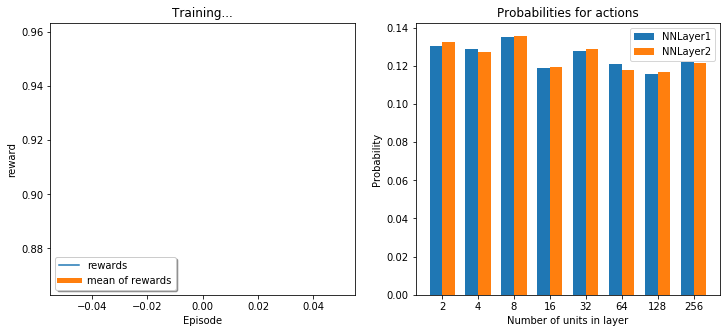

epoch 1 
Network (16, 128) accuracy:0.914, average rewards: 0.913


<Figure size 432x288 with 0 Axes>

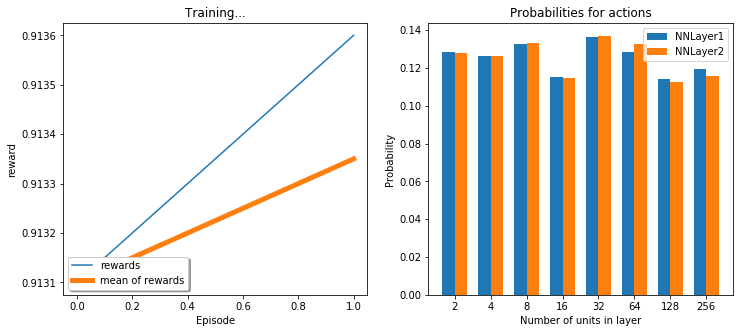

epoch 2 
Network (2, 8) accuracy:0.484, average rewards: 0.770


<Figure size 432x288 with 0 Axes>

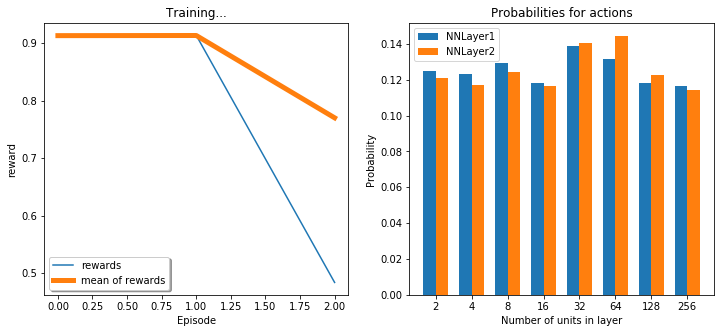

epoch 3 
Network (32, 16) accuracy:0.905, average rewards: 0.804


<Figure size 432x288 with 0 Axes>

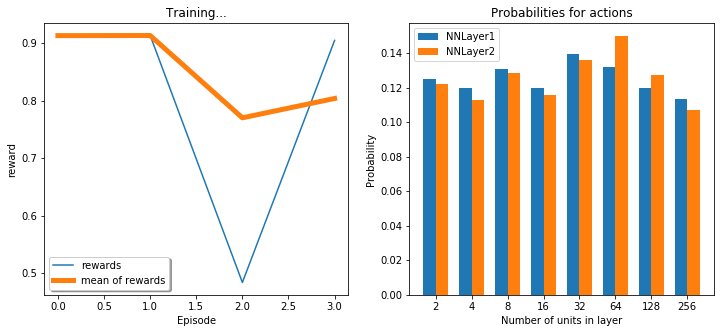

epoch 4 
Network (2, 64) accuracy:0.330, average rewards: 0.709


<Figure size 432x288 with 0 Axes>

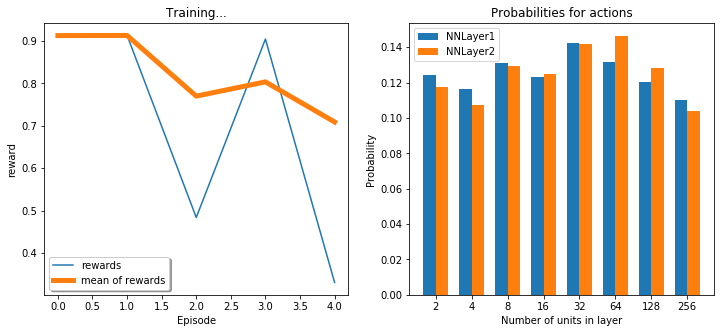

epoch 5 
Network (2, 64) accuracy:0.330, average rewards: 0.646


<Figure size 432x288 with 0 Axes>

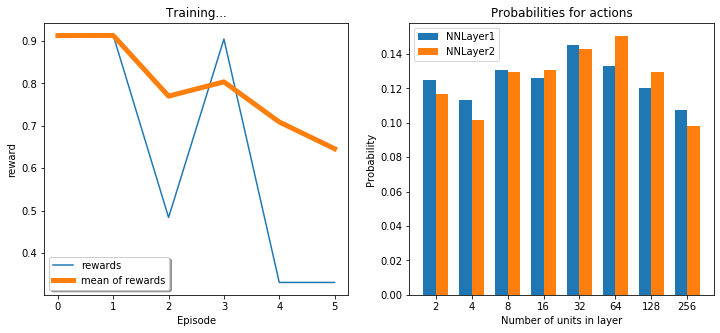

epoch 6 
Network (2, 32) accuracy:0.641, average rewards: 0.645


<Figure size 432x288 with 0 Axes>

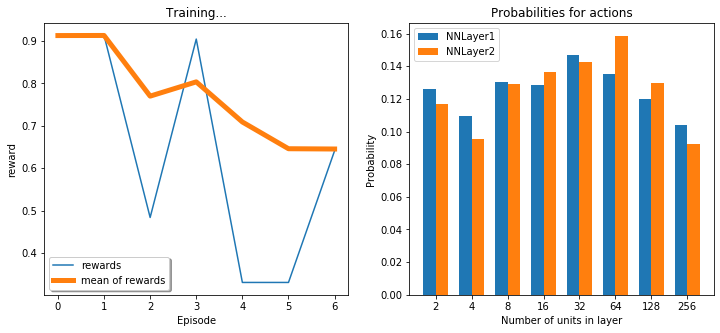

epoch 7 
Network (16, 128) accuracy:0.914, average rewards: 0.679


<Figure size 432x288 with 0 Axes>

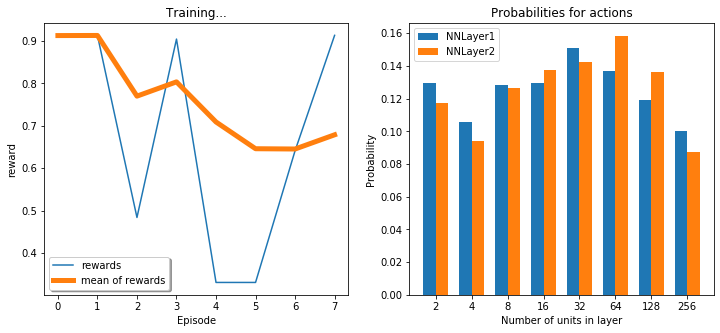

epoch 8 
Network (16, 16) accuracy:0.891, average rewards: 0.702


<Figure size 432x288 with 0 Axes>

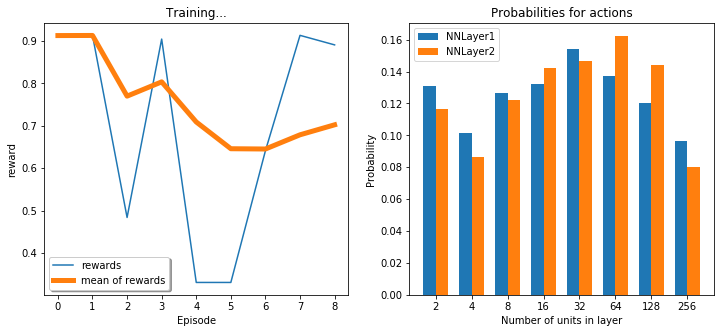

epoch 9 
Network (256, 128) accuracy:0.915, average rewards: 0.724


<Figure size 432x288 with 0 Axes>

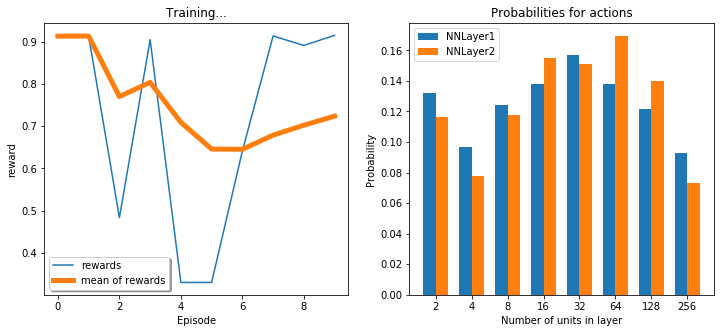

epoch 10 
Network (2, 2) accuracy:0.210, average rewards: 0.677


<Figure size 432x288 with 0 Axes>

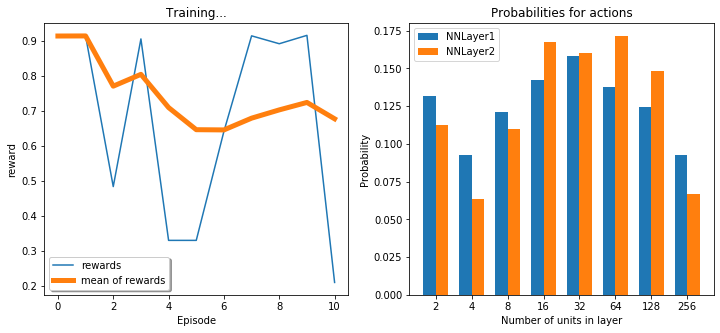

epoch 11 
Network (128, 64) accuracy:0.910, average rewards: 0.696


<Figure size 432x288 with 0 Axes>

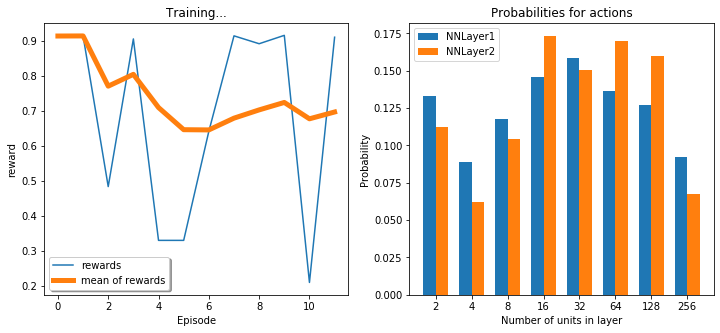

epoch 12 
Network (32, 32) accuracy:0.909, average rewards: 0.713


<Figure size 432x288 with 0 Axes>

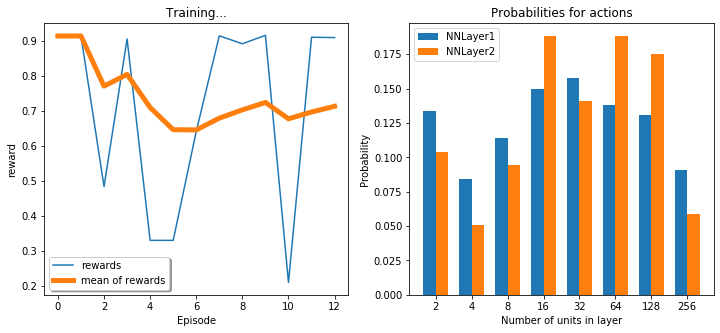

epoch 13 
Network (128, 64) accuracy:0.910, average rewards: 0.727


<Figure size 432x288 with 0 Axes>

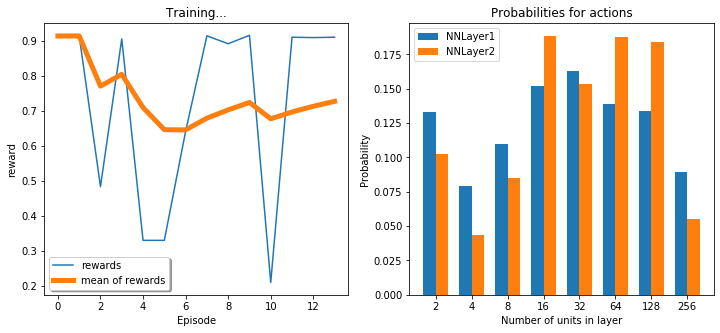

epoch 14 
Network (64, 32) accuracy:0.906, average rewards: 0.739


<Figure size 432x288 with 0 Axes>

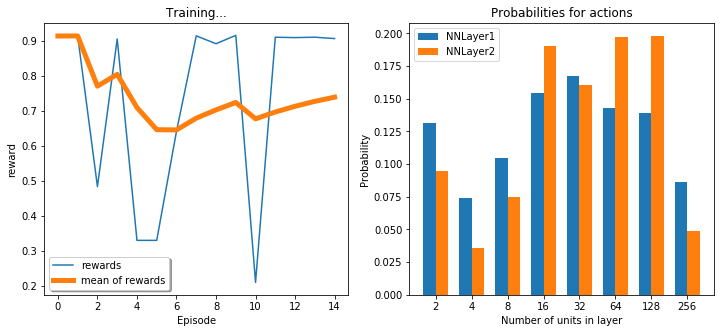

epoch 15 
Network (32, 2) accuracy:0.460, average rewards: 0.721


<Figure size 432x288 with 0 Axes>

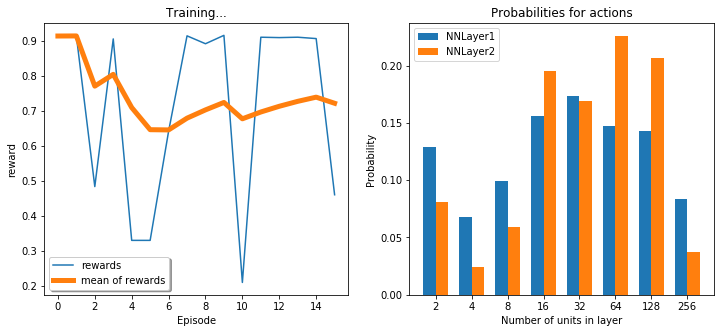

epoch 16 
Network (64, 32) accuracy:0.906, average rewards: 0.732


<Figure size 432x288 with 0 Axes>

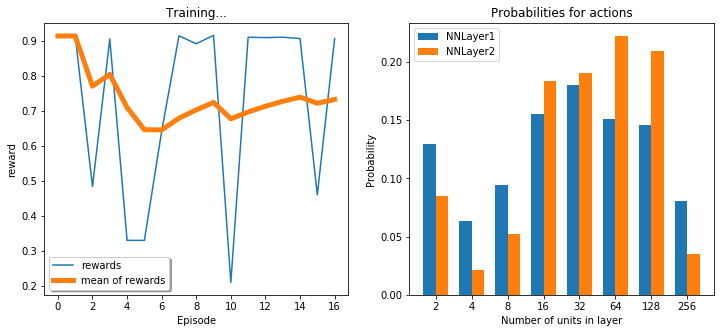

epoch 17 
Network (128, 64) accuracy:0.910, average rewards: 0.742


<Figure size 432x288 with 0 Axes>

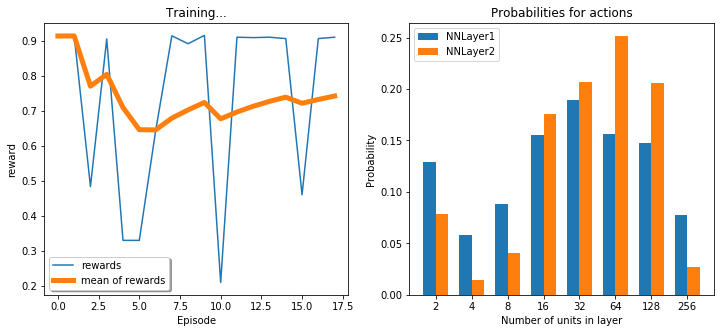

epoch 18 
Network (64, 64) accuracy:0.909, average rewards: 0.751


<Figure size 432x288 with 0 Axes>

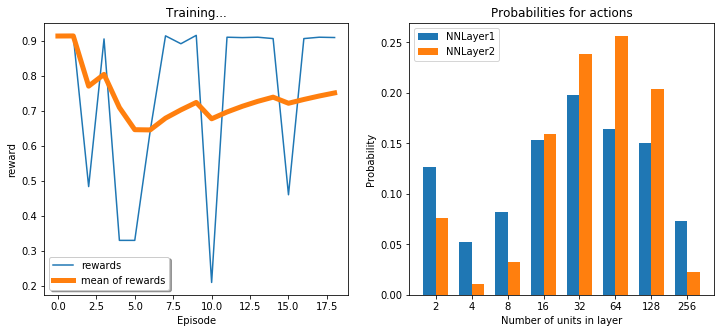

epoch 19 
Network (128, 16) accuracy:0.903, average rewards: 0.758


<Figure size 432x288 with 0 Axes>

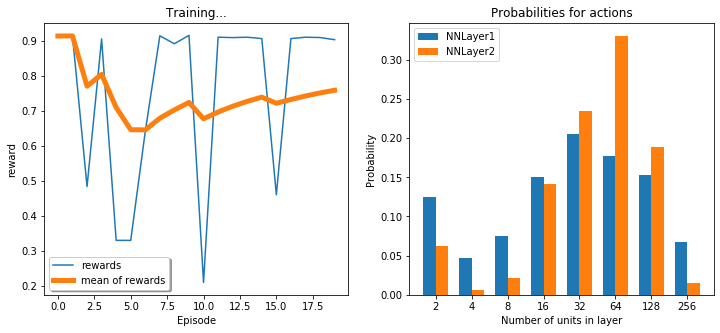

epoch 20 
Network (256, 64) accuracy:0.913, average rewards: 0.766


<Figure size 432x288 with 0 Axes>

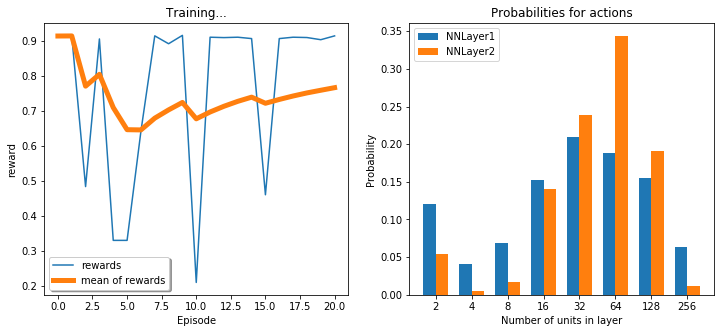

epoch 21 
Network (32, 64) accuracy:0.913, average rewards: 0.772


<Figure size 432x288 with 0 Axes>

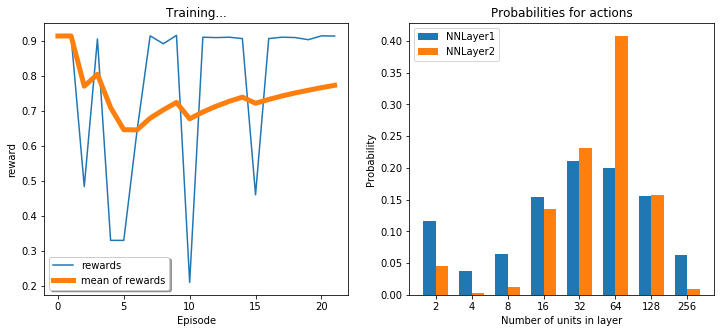

epoch 22 
Network (8, 16) accuracy:0.889, average rewards: 0.778


<Figure size 432x288 with 0 Axes>

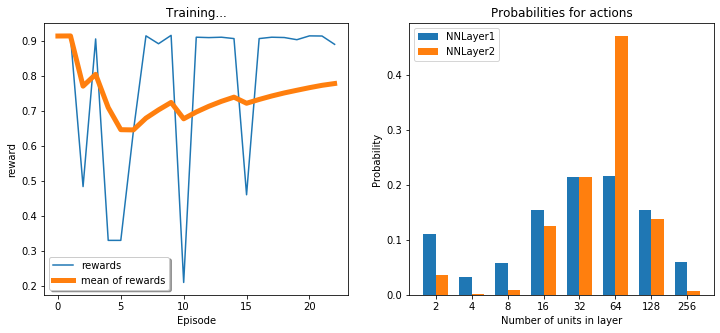

epoch 23 
Network (64, 64) accuracy:0.909, average rewards: 0.783


<Figure size 432x288 with 0 Axes>

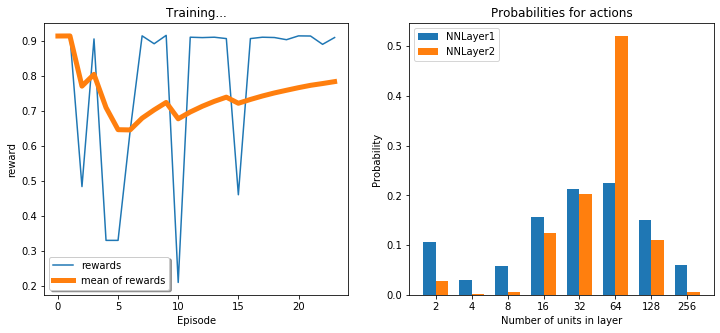

epoch 24 
Network (32, 64) accuracy:0.913, average rewards: 0.788


<Figure size 432x288 with 0 Axes>

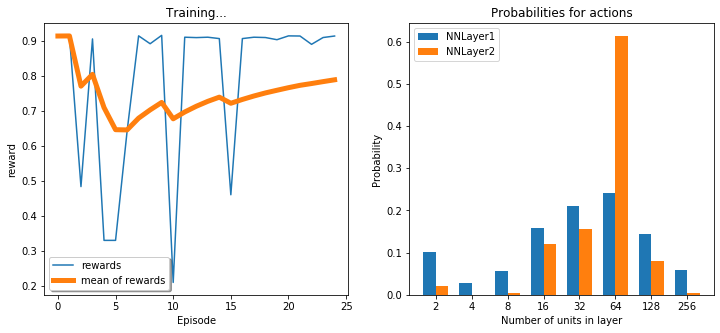

epoch 25 
Network (32, 64) accuracy:0.913, average rewards: 0.793


<Figure size 432x288 with 0 Axes>

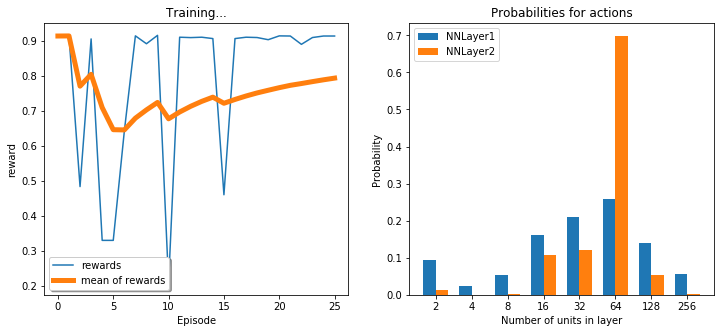

epoch 26 
Network (32, 64) accuracy:0.913, average rewards: 0.797


<Figure size 432x288 with 0 Axes>

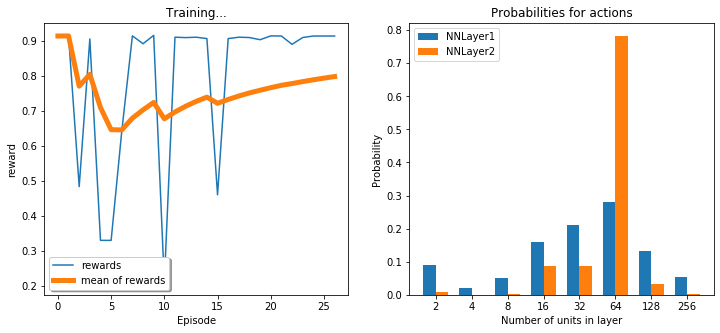

epoch 27 
Network (32, 64) accuracy:0.913, average rewards: 0.802


<Figure size 432x288 with 0 Axes>

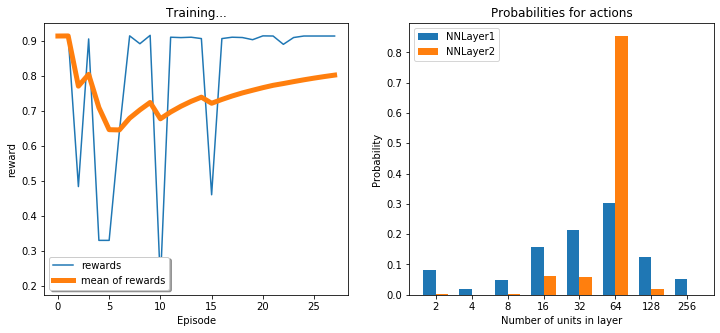

epoch 28 
Network (16, 64) accuracy:0.908, average rewards: 0.805


<Figure size 432x288 with 0 Axes>

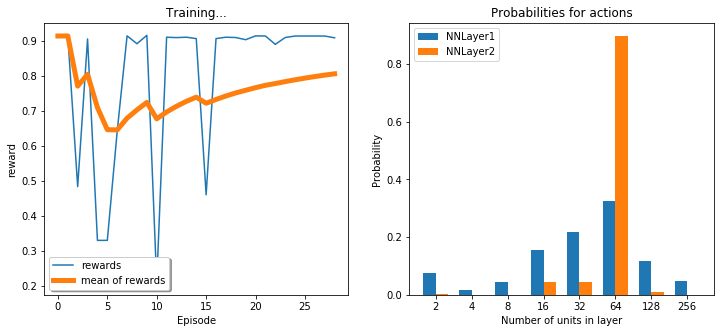

epoch 29 
Network (4, 64) accuracy:0.851, average rewards: 0.807


<Figure size 432x288 with 0 Axes>

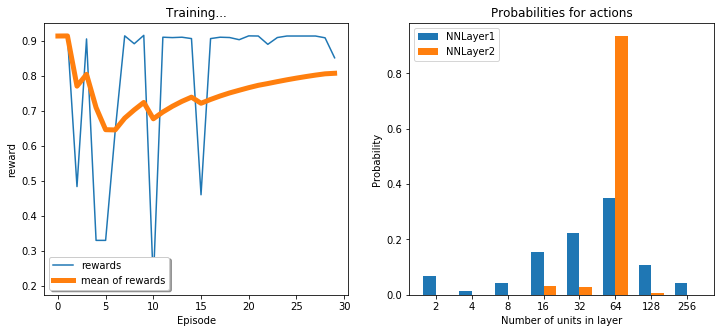

epoch 30 
Network (64, 64) accuracy:0.909, average rewards: 0.810


<Figure size 432x288 with 0 Axes>

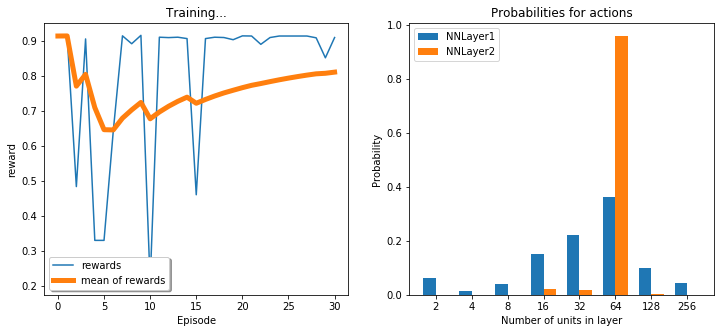

epoch 31 
Network (32, 64) accuracy:0.913, average rewards: 0.813


<Figure size 432x288 with 0 Axes>

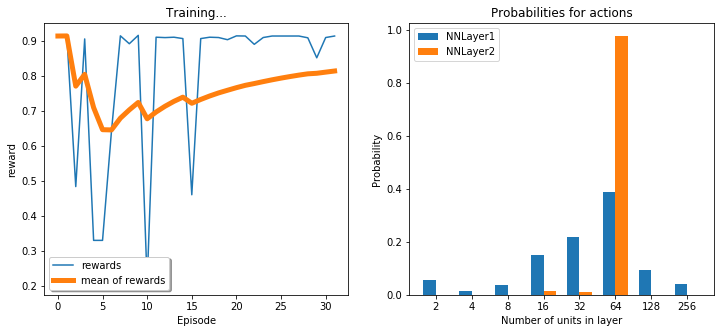

epoch 32 
Network (64, 64) accuracy:0.909, average rewards: 0.816


<Figure size 432x288 with 0 Axes>

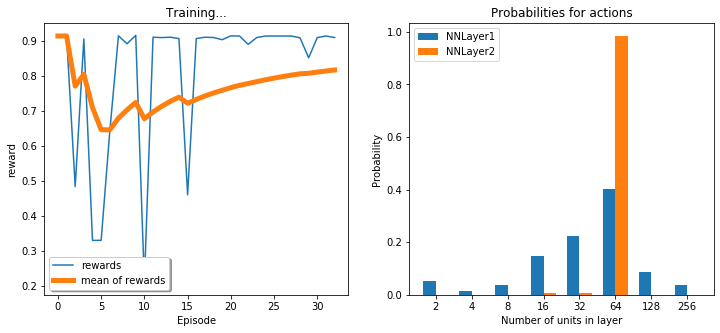

epoch 33 
Network (32, 64) accuracy:0.913, average rewards: 0.819


<Figure size 432x288 with 0 Axes>

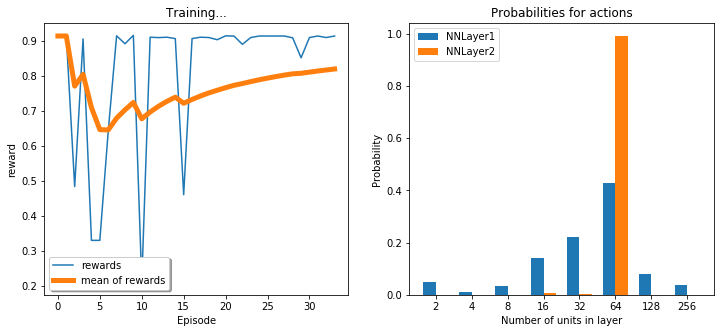

epoch 34 
Network (64, 64) accuracy:0.909, average rewards: 0.822


<Figure size 432x288 with 0 Axes>

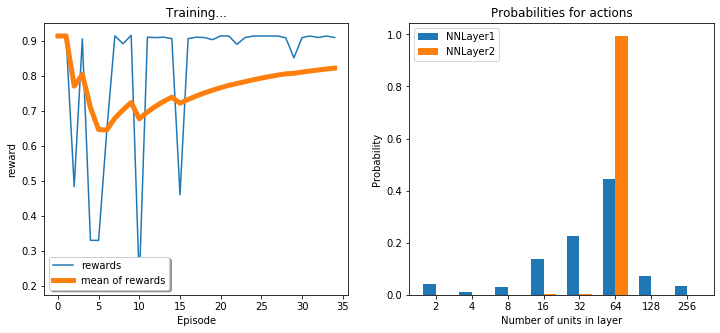

epoch 35 
Network (16, 64) accuracy:0.908, average rewards: 0.824


<Figure size 432x288 with 0 Axes>

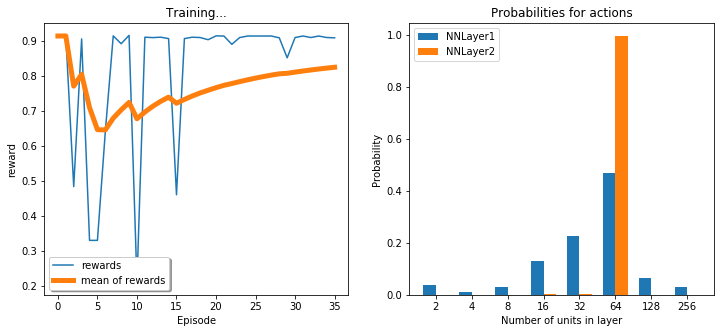

epoch 36 
Network (64, 64) accuracy:0.909, average rewards: 0.826


<Figure size 432x288 with 0 Axes>

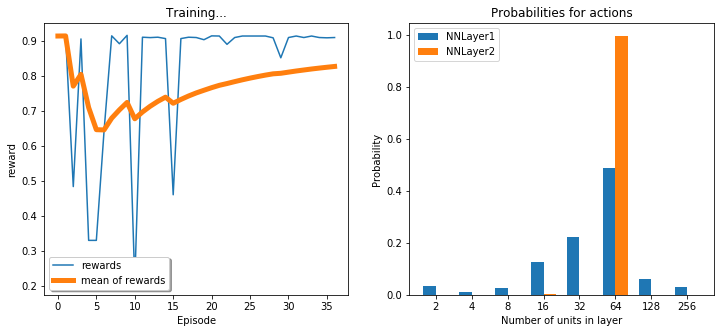

epoch 37 
Network (32, 64) accuracy:0.913, average rewards: 0.829


<Figure size 432x288 with 0 Axes>

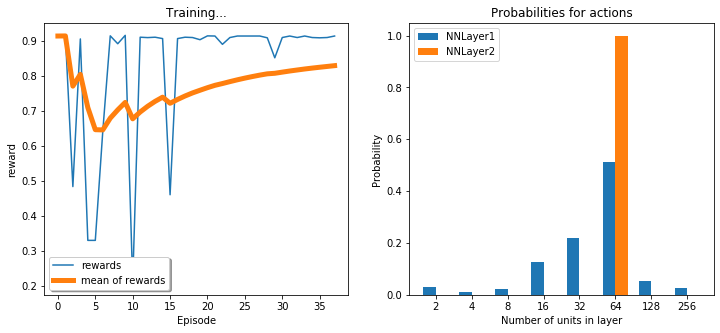

epoch 38 
Network (32, 64) accuracy:0.913, average rewards: 0.831


<Figure size 432x288 with 0 Axes>

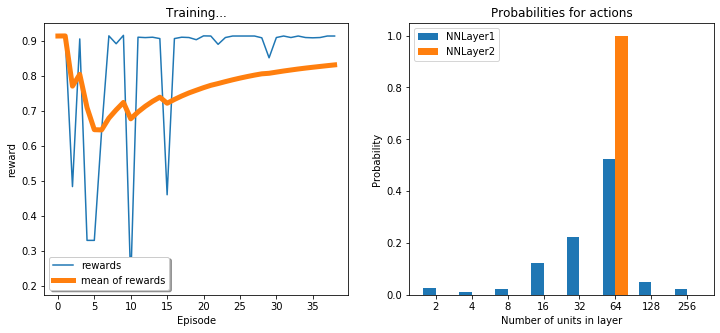

epoch 39 
Network (64, 64) accuracy:0.909, average rewards: 0.833


<Figure size 432x288 with 0 Axes>

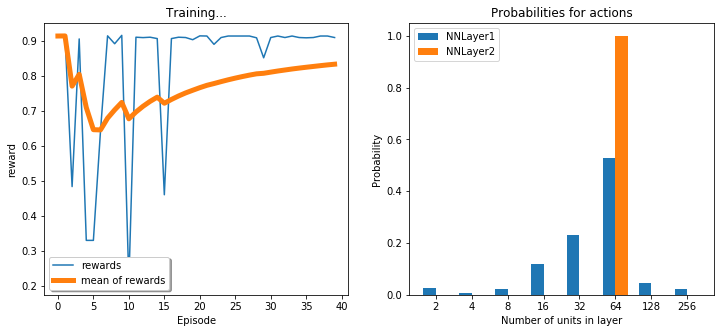

epoch 40 
Network (16, 64) accuracy:0.908, average rewards: 0.835


<Figure size 432x288 with 0 Axes>

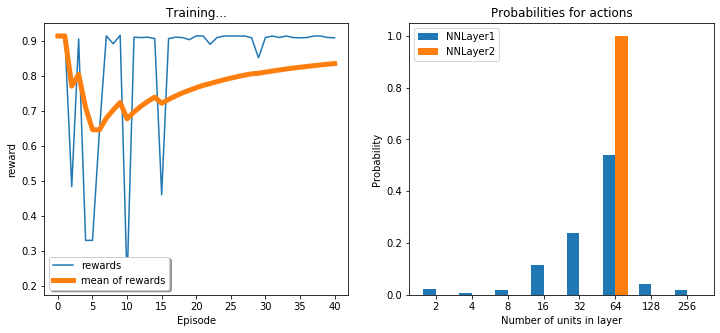

epoch 41 
Network (64, 64) accuracy:0.909, average rewards: 0.836


<Figure size 432x288 with 0 Axes>

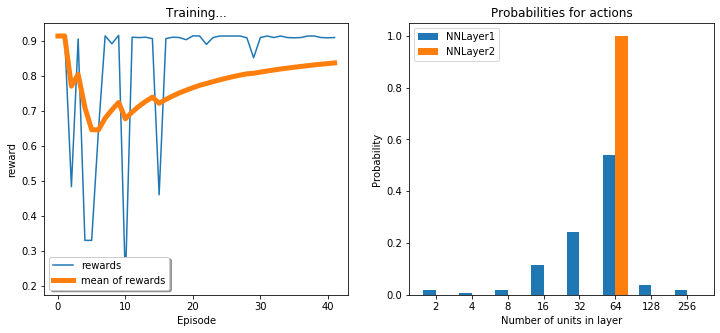

epoch 42 
Network (64, 64) accuracy:0.909, average rewards: 0.838


<Figure size 432x288 with 0 Axes>

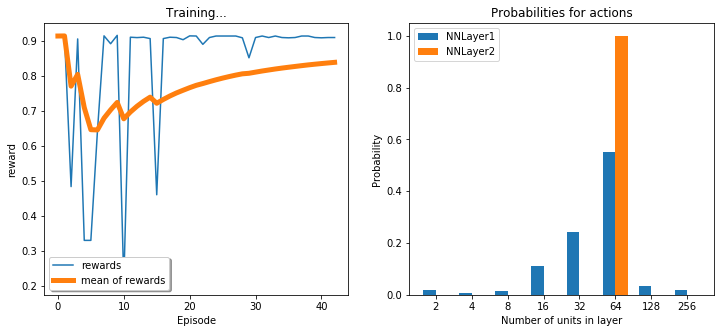

epoch 43 
Network (32, 64) accuracy:0.913, average rewards: 0.840


<Figure size 432x288 with 0 Axes>

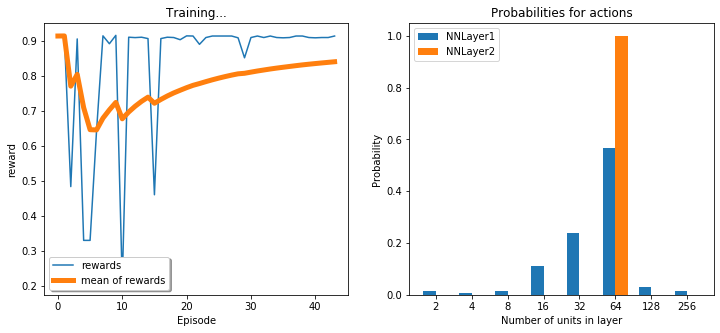

epoch 44 
Network (64, 64) accuracy:0.909, average rewards: 0.841


<Figure size 432x288 with 0 Axes>

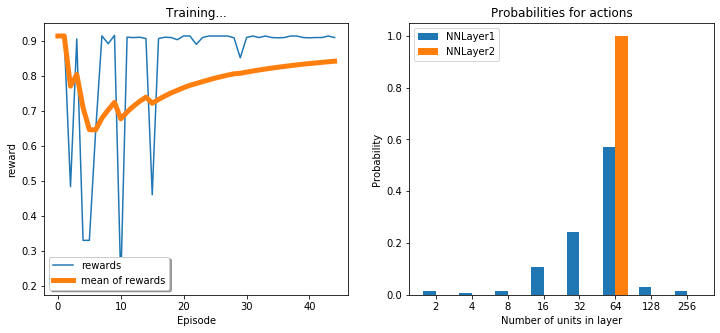

epoch 45 
Network (64, 64) accuracy:0.909, average rewards: 0.843


<Figure size 432x288 with 0 Axes>

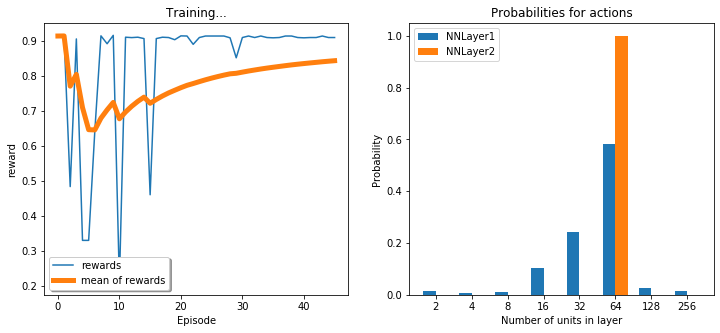

epoch 46 
Network (2, 64) accuracy:0.330, average rewards: 0.832


<Figure size 432x288 with 0 Axes>

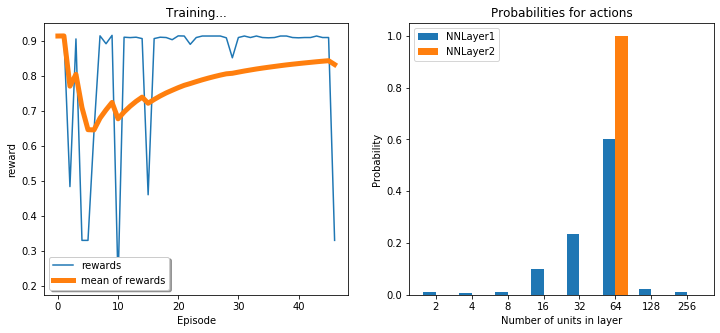

epoch 47 
Network (64, 64) accuracy:0.909, average rewards: 0.833


<Figure size 432x288 with 0 Axes>

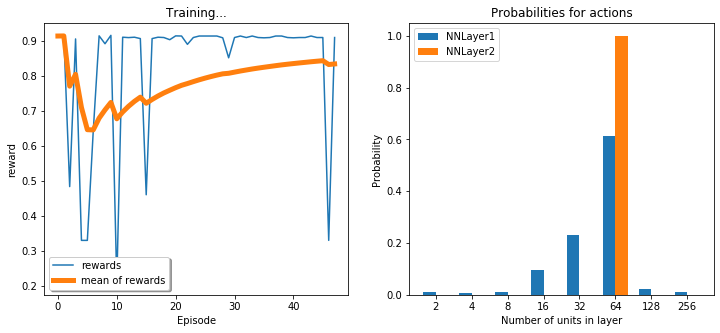

epoch 48 
Network (16, 64) accuracy:0.908, average rewards: 0.835


<Figure size 432x288 with 0 Axes>

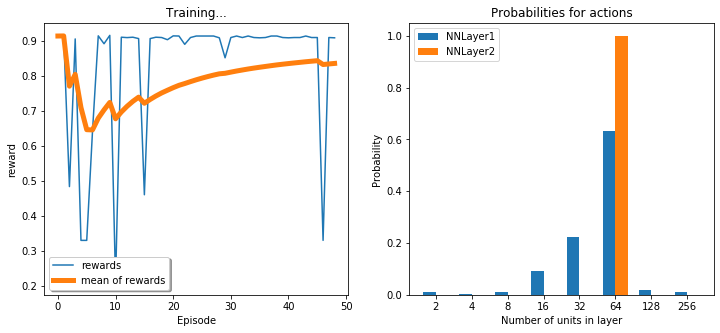

epoch 49 
Network (32, 64) accuracy:0.913, average rewards: 0.837


<Figure size 432x288 with 0 Axes>

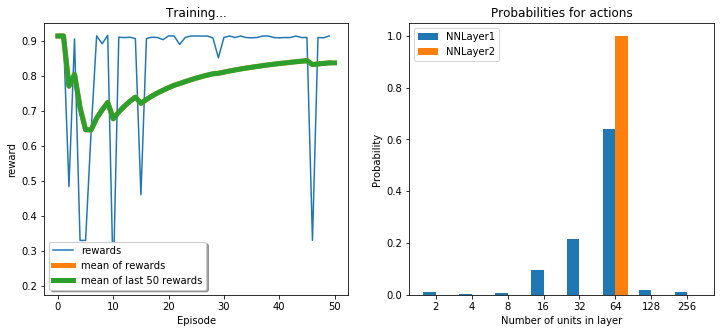

epoch 50 
Network (16, 64) accuracy:0.908, average rewards: 0.838


<Figure size 432x288 with 0 Axes>

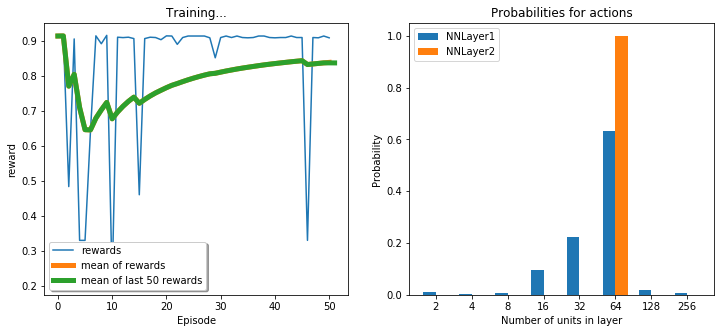

epoch 51 
Network (64, 64) accuracy:0.909, average rewards: 0.839


<Figure size 432x288 with 0 Axes>

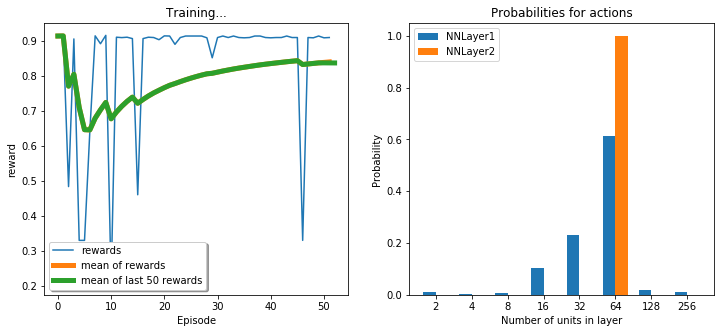

epoch 52 
Network (64, 64) accuracy:0.909, average rewards: 0.841


<Figure size 432x288 with 0 Axes>

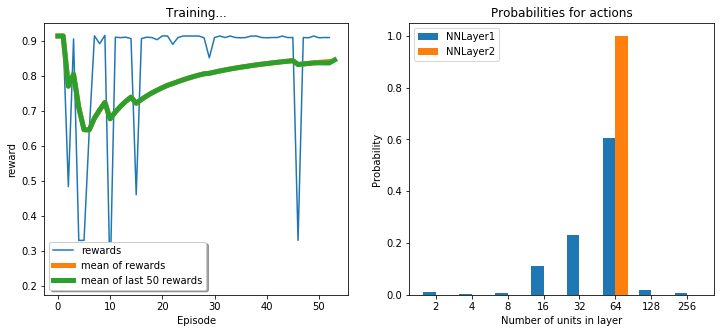

epoch 53 
Network (16, 64) accuracy:0.908, average rewards: 0.842


<Figure size 432x288 with 0 Axes>

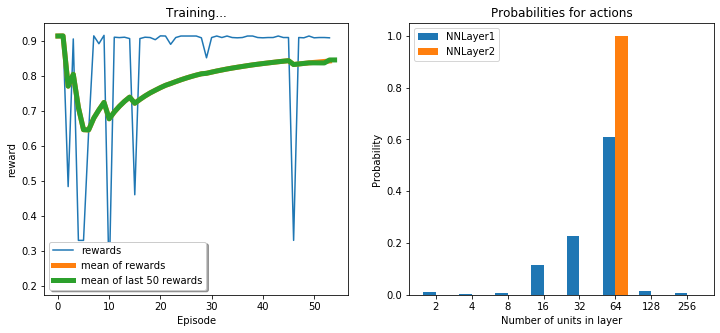

epoch 54 
Network (64, 64) accuracy:0.909, average rewards: 0.843


<Figure size 432x288 with 0 Axes>

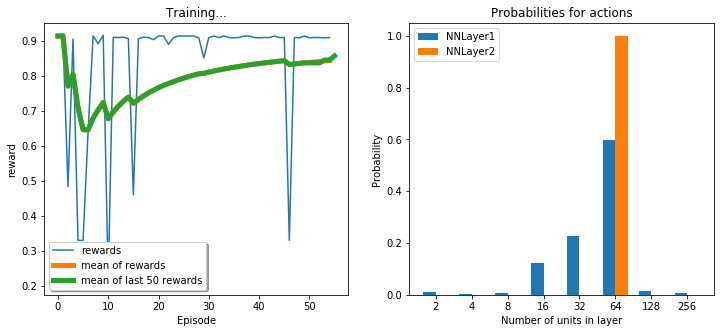

epoch 55 
Network (32, 64) accuracy:0.913, average rewards: 0.844


<Figure size 432x288 with 0 Axes>

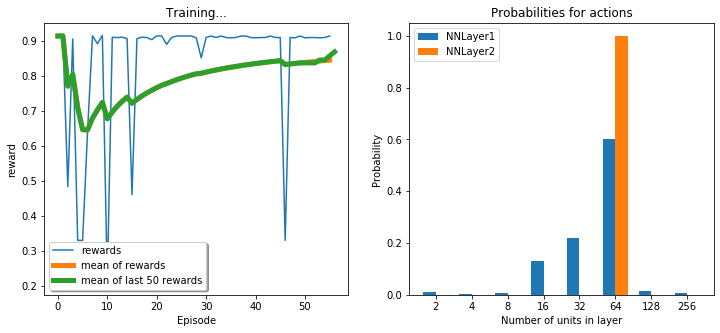

epoch 56 
Network (32, 64) accuracy:0.913, average rewards: 0.846


<Figure size 432x288 with 0 Axes>

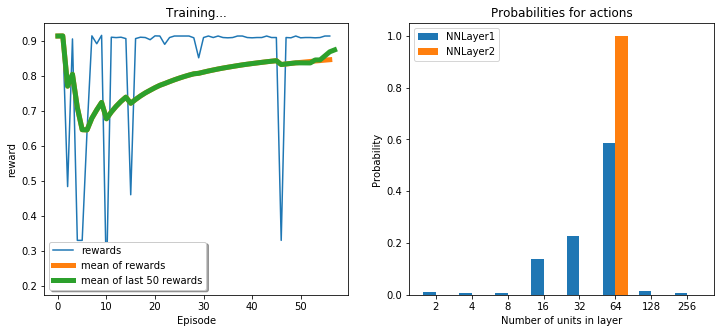

epoch 57 
Network (64, 64) accuracy:0.909, average rewards: 0.847


<Figure size 432x288 with 0 Axes>

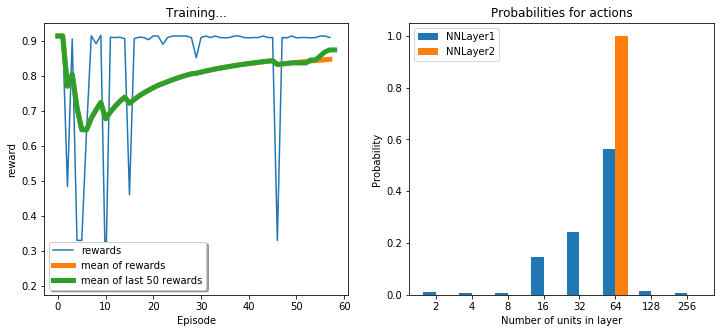

epoch 58 
Network (32, 64) accuracy:0.913, average rewards: 0.848


<Figure size 432x288 with 0 Axes>

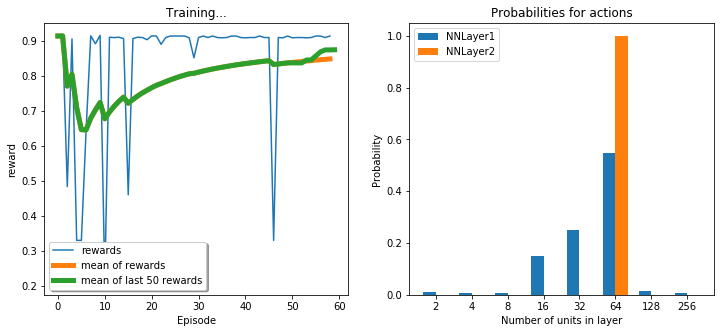

epoch 59 
Network (16, 64) accuracy:0.908, average rewards: 0.849


<Figure size 432x288 with 0 Axes>

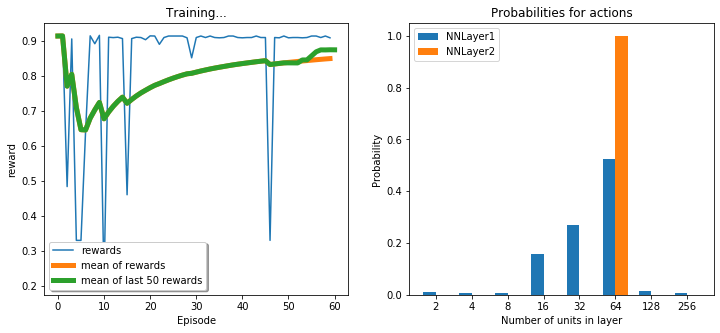

epoch 60 
Network (64, 64) accuracy:0.909, average rewards: 0.850


<Figure size 432x288 with 0 Axes>

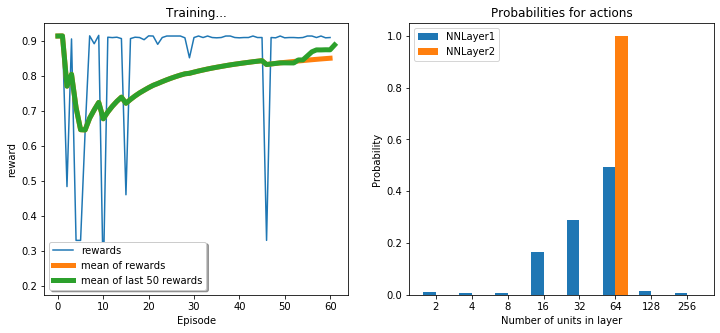

epoch 61 
Network (32, 64) accuracy:0.913, average rewards: 0.851


<Figure size 432x288 with 0 Axes>

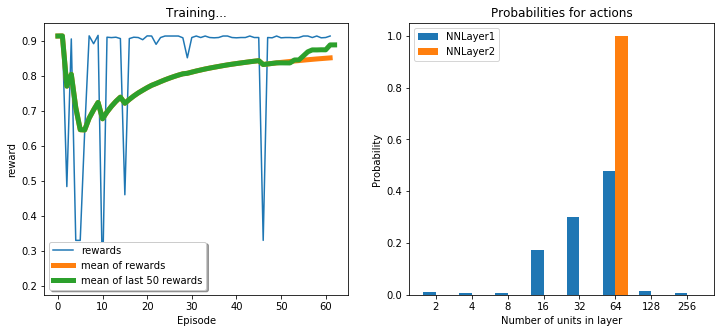

epoch 62 
Network (64, 64) accuracy:0.909, average rewards: 0.852


<Figure size 432x288 with 0 Axes>

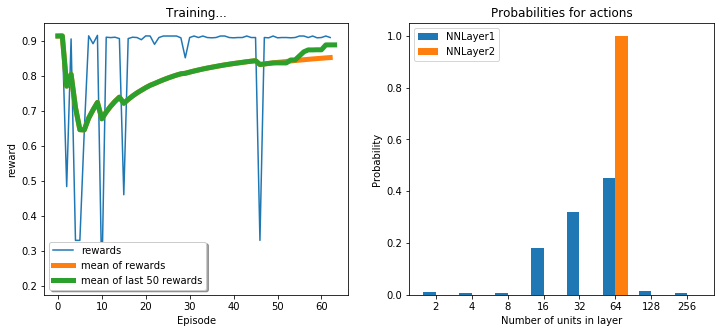

epoch 63 
Network (16, 64) accuracy:0.908, average rewards: 0.853


<Figure size 432x288 with 0 Axes>

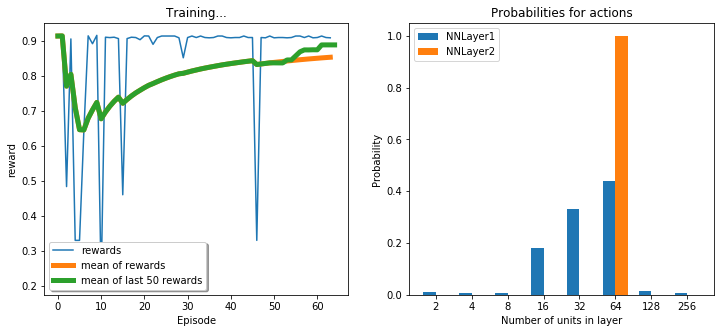

epoch 64 
Network (32, 64) accuracy:0.913, average rewards: 0.853


<Figure size 432x288 with 0 Axes>

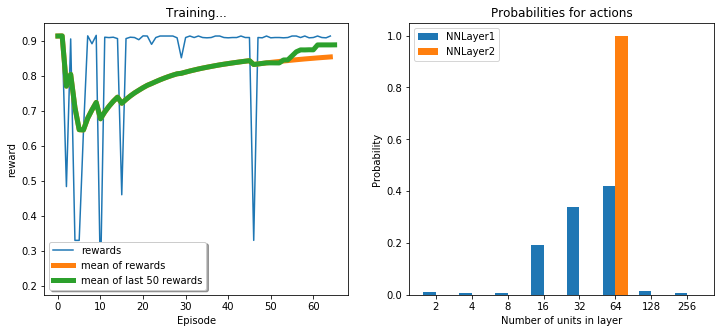

epoch 65 
Network (32, 64) accuracy:0.913, average rewards: 0.854


<Figure size 432x288 with 0 Axes>

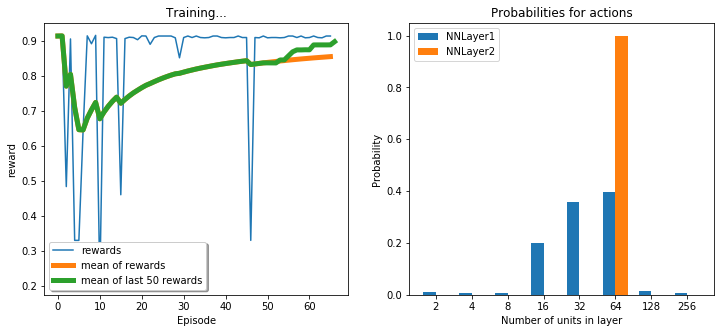

epoch 66 
Network (32, 64) accuracy:0.913, average rewards: 0.855


<Figure size 432x288 with 0 Axes>

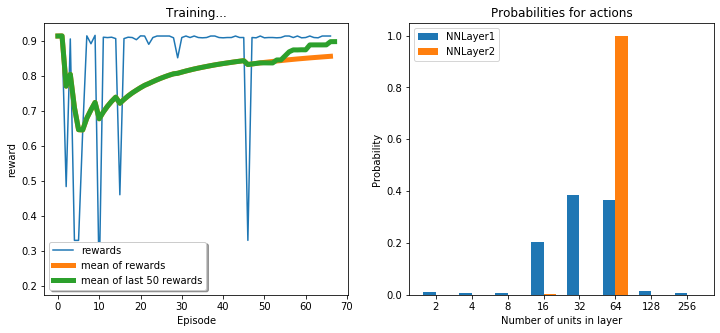

epoch 67 
Network (64, 64) accuracy:0.909, average rewards: 0.856


<Figure size 432x288 with 0 Axes>

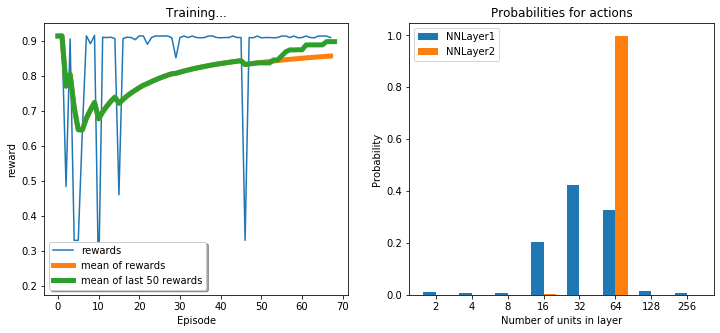

epoch 68 
Network (16, 64) accuracy:0.908, average rewards: 0.857


<Figure size 432x288 with 0 Axes>

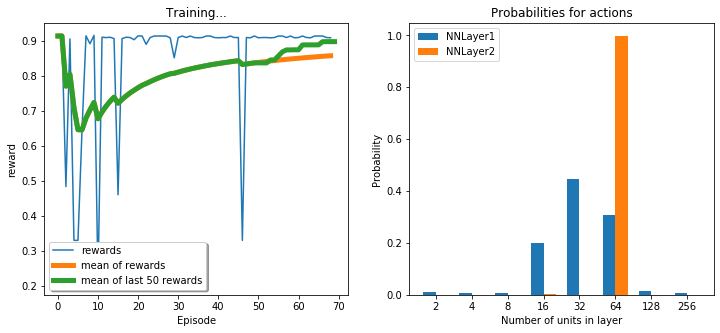

epoch 69 
Network (16, 64) accuracy:0.908, average rewards: 0.858


<Figure size 432x288 with 0 Axes>

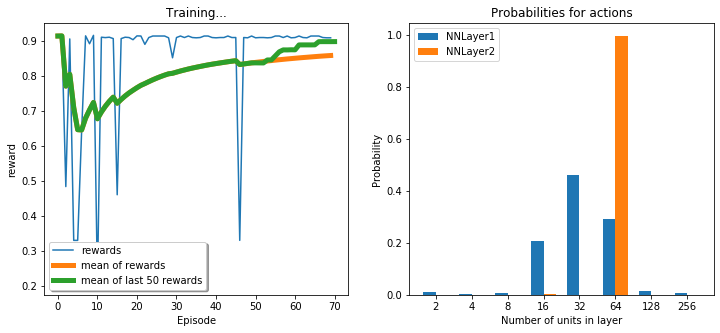

epoch 70 
Network (16, 32) accuracy:0.905, average rewards: 0.858


<Figure size 432x288 with 0 Axes>

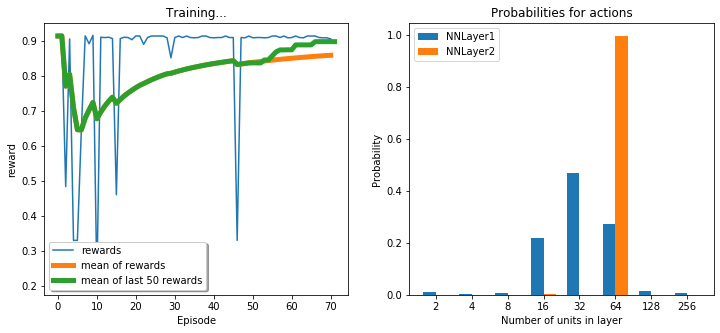

epoch 71 
Network (16, 64) accuracy:0.908, average rewards: 0.859


<Figure size 432x288 with 0 Axes>

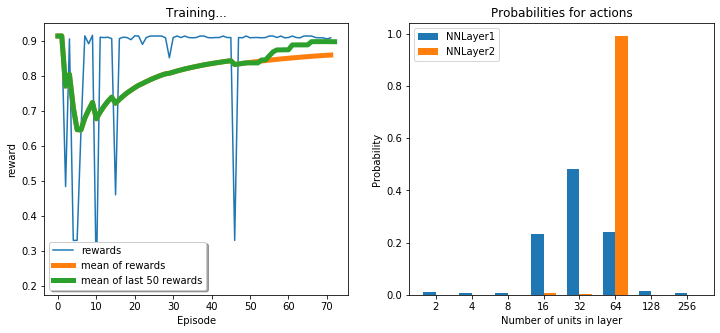

epoch 72 
Network (64, 64) accuracy:0.909, average rewards: 0.860


<Figure size 432x288 with 0 Axes>

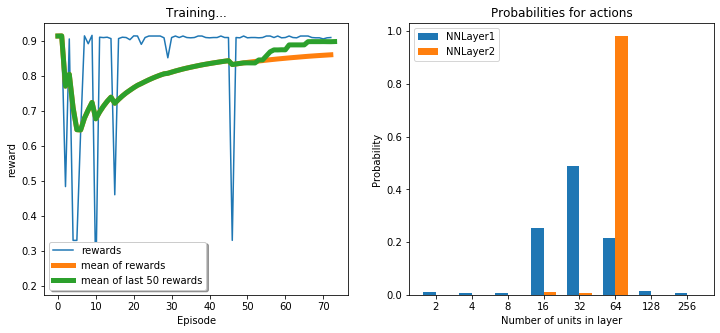

epoch 73 
Network (16, 64) accuracy:0.908, average rewards: 0.860


<Figure size 432x288 with 0 Axes>

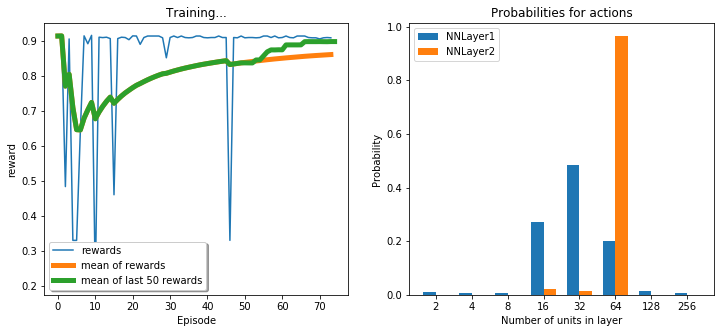

epoch 74 
Network (32, 64) accuracy:0.913, average rewards: 0.861


<Figure size 432x288 with 0 Axes>

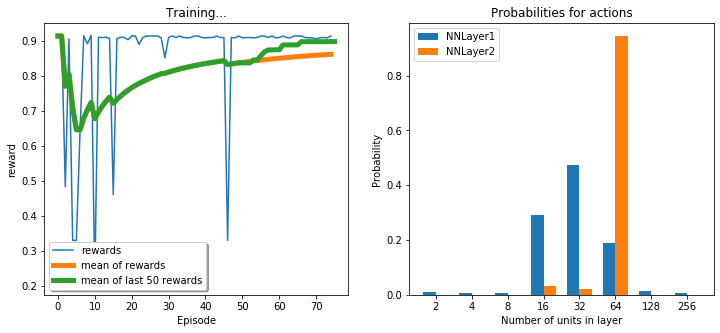

epoch 75 
Network (32, 64) accuracy:0.913, average rewards: 0.862


<Figure size 432x288 with 0 Axes>

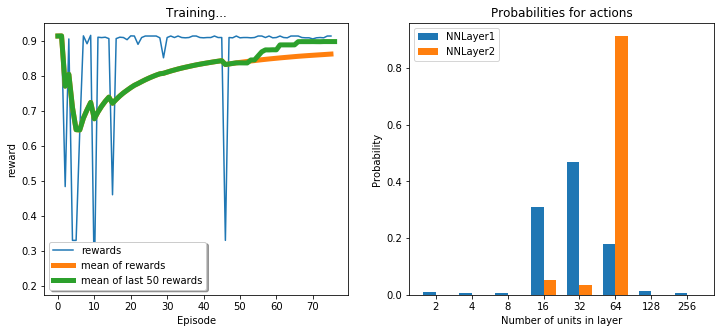

epoch 76 
Network (64, 64) accuracy:0.909, average rewards: 0.862


<Figure size 432x288 with 0 Axes>

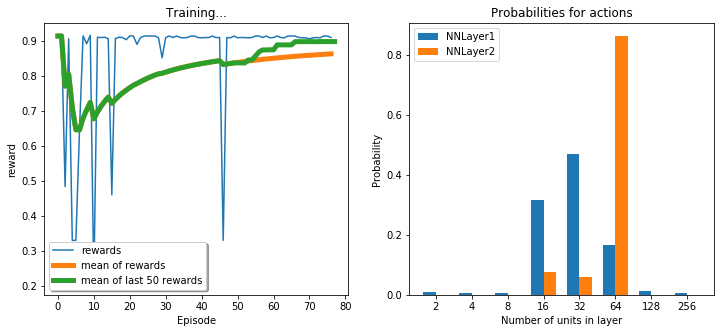

epoch 77 
Network (32, 16) accuracy:0.905, average rewards: 0.863


<Figure size 432x288 with 0 Axes>

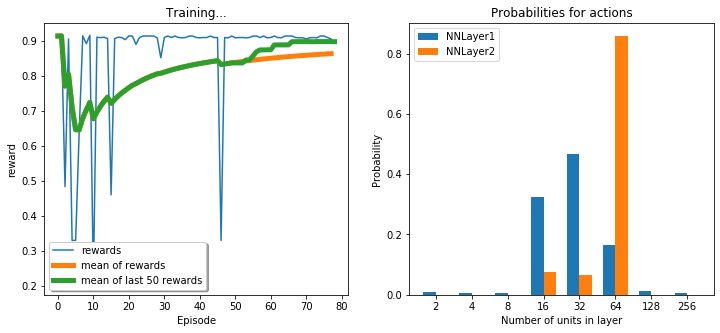

epoch 78 
Network (16, 64) accuracy:0.908, average rewards: 0.863


<Figure size 432x288 with 0 Axes>

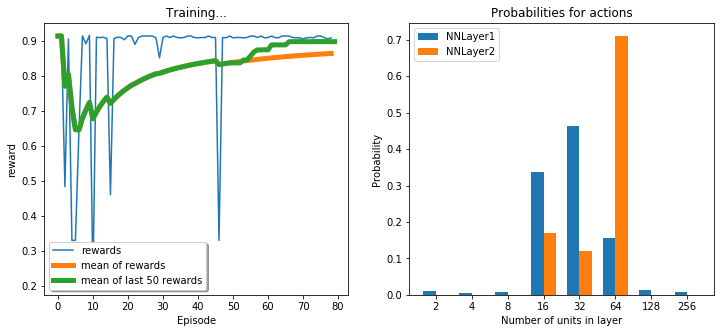

epoch 79 
Network (16, 64) accuracy:0.908, average rewards: 0.864


<Figure size 432x288 with 0 Axes>

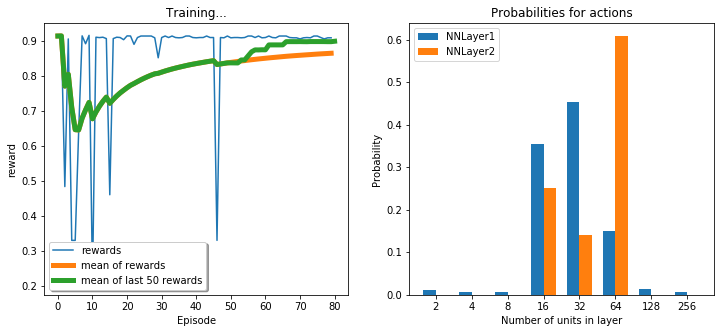

epoch 80 
Network (16, 64) accuracy:0.908, average rewards: 0.864


<Figure size 432x288 with 0 Axes>

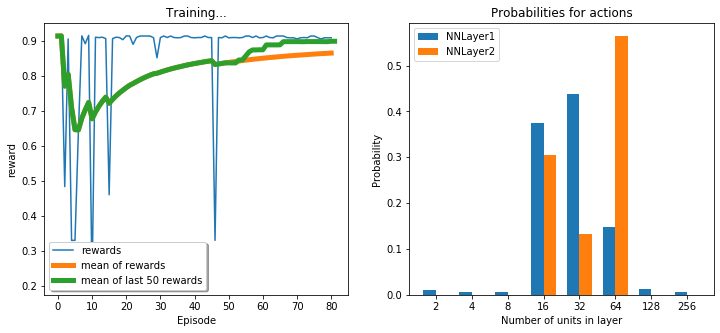

epoch 81 
Network (16, 64) accuracy:0.908, average rewards: 0.865


<Figure size 432x288 with 0 Axes>

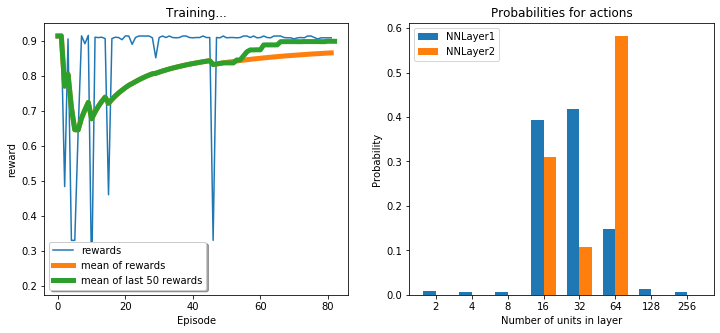

epoch 82 
Network (16, 32) accuracy:0.905, average rewards: 0.865


<Figure size 432x288 with 0 Axes>

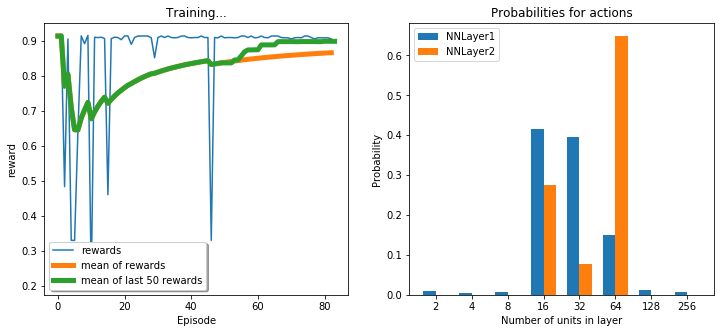

epoch 83 
Network (16, 64) accuracy:0.908, average rewards: 0.866


<Figure size 432x288 with 0 Axes>

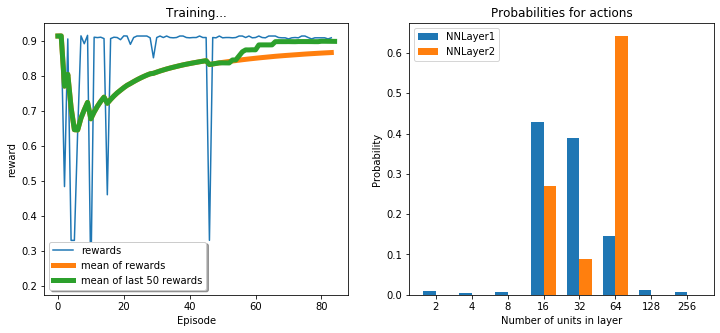

epoch 84 
Network (16, 16) accuracy:0.891, average rewards: 0.866


<Figure size 432x288 with 0 Axes>

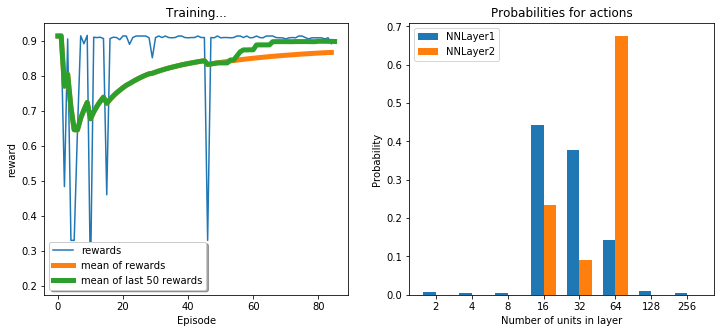

epoch 85 
Network (16, 64) accuracy:0.908, average rewards: 0.867


<Figure size 432x288 with 0 Axes>

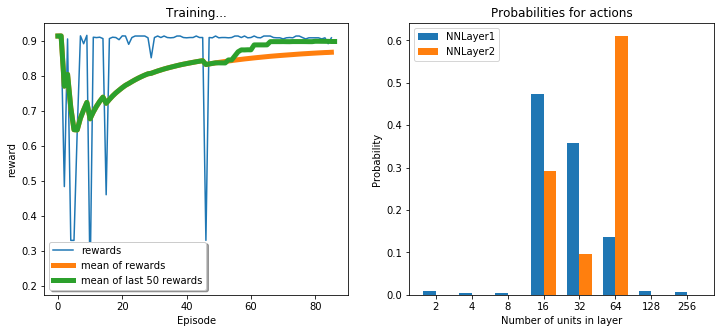

epoch 86 
Network (64, 64) accuracy:0.909, average rewards: 0.867


<Figure size 432x288 with 0 Axes>

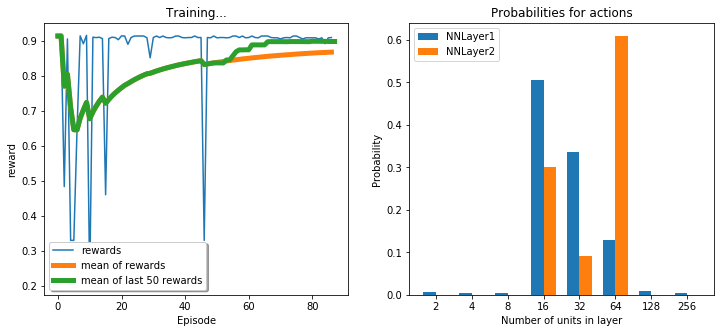

epoch 87 
Network (64, 64) accuracy:0.909, average rewards: 0.868


<Figure size 432x288 with 0 Axes>

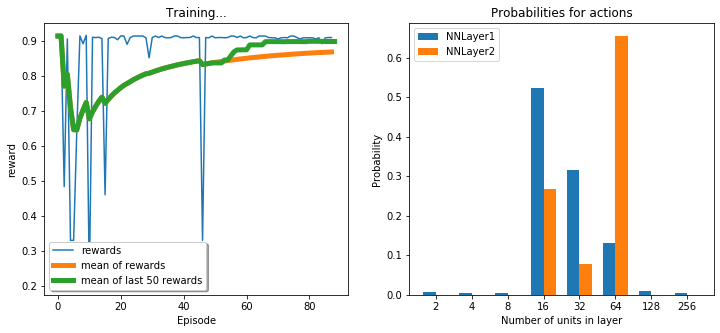

epoch 88 
Network (64, 64) accuracy:0.909, average rewards: 0.868


<Figure size 432x288 with 0 Axes>

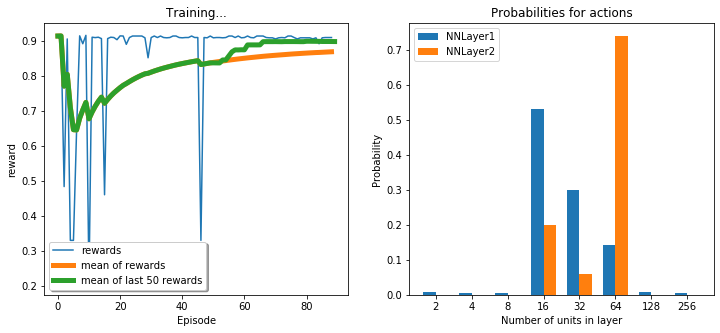

epoch 89 
Network (32, 64) accuracy:0.913, average rewards: 0.869


<Figure size 432x288 with 0 Axes>

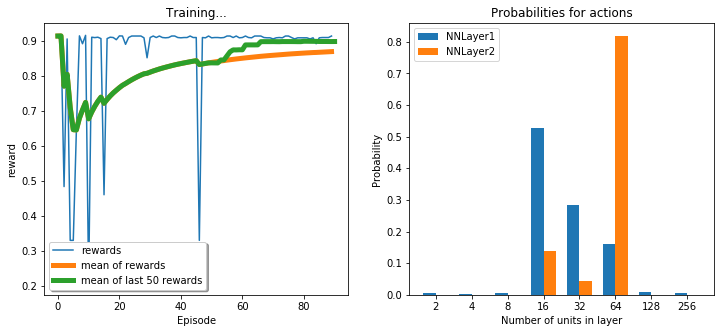

epoch 90 
Network (64, 64) accuracy:0.909, average rewards: 0.869


<Figure size 432x288 with 0 Axes>

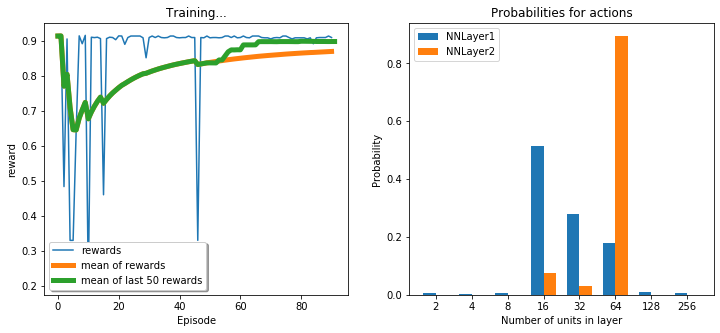

epoch 91 
Network (64, 64) accuracy:0.909, average rewards: 0.870


<Figure size 432x288 with 0 Axes>

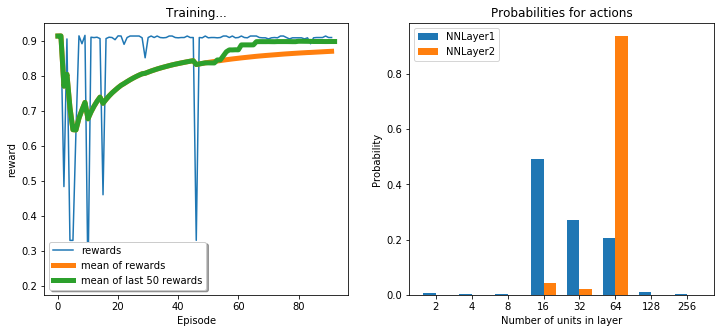

epoch 92 
Network (16, 64) accuracy:0.908, average rewards: 0.870


<Figure size 432x288 with 0 Axes>

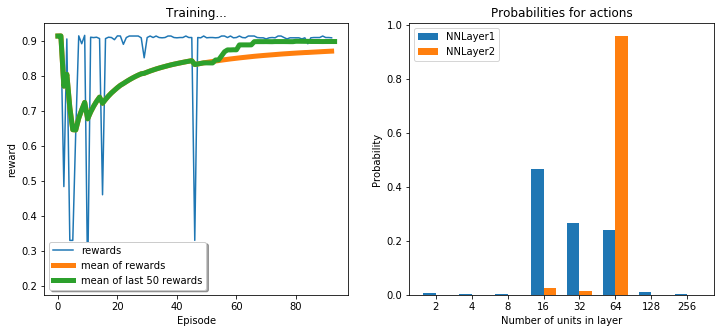

epoch 93 
Network (16, 64) accuracy:0.908, average rewards: 0.870


<Figure size 432x288 with 0 Axes>

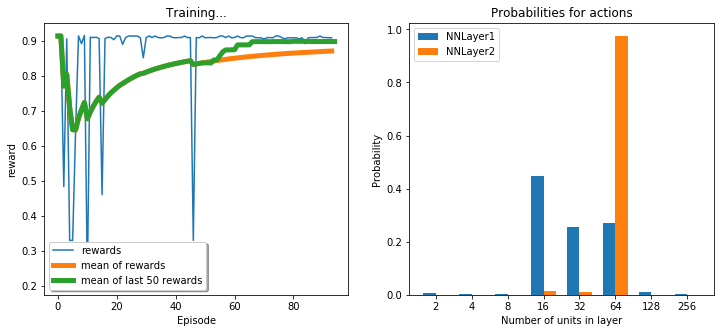

epoch 94 
Network (32, 64) accuracy:0.913, average rewards: 0.871


<Figure size 432x288 with 0 Axes>

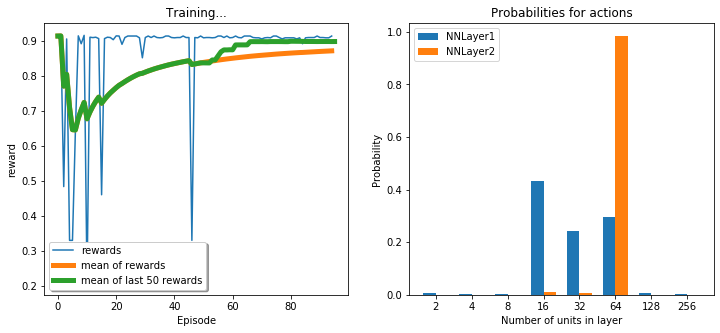

epoch 95 
Network (16, 64) accuracy:0.908, average rewards: 0.871


<Figure size 432x288 with 0 Axes>

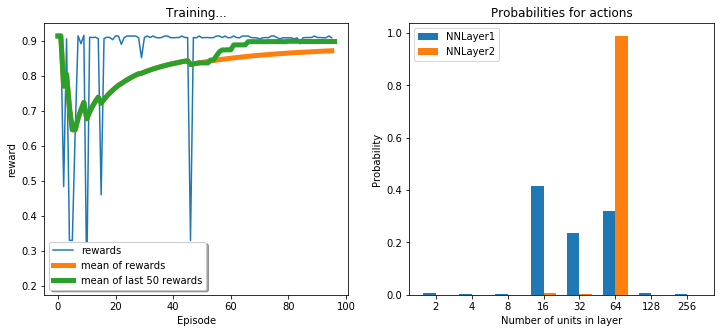

epoch 96 
Network (32, 64) accuracy:0.913, average rewards: 0.872


<Figure size 432x288 with 0 Axes>

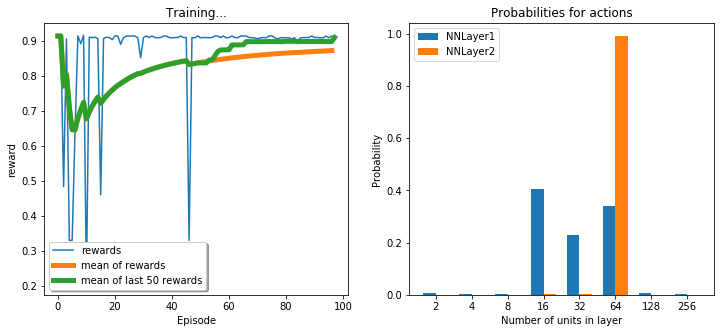

epoch 97 
Network (16, 64) accuracy:0.908, average rewards: 0.872


<Figure size 432x288 with 0 Axes>

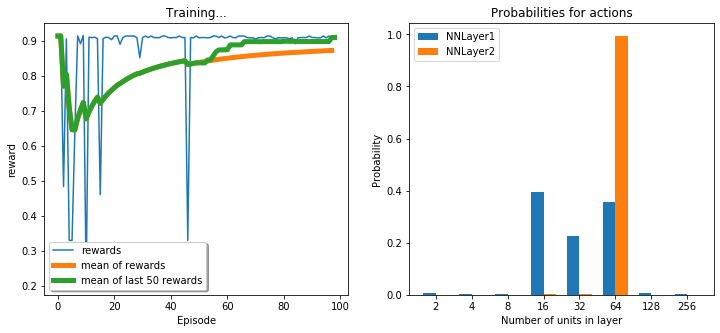

epoch 98 
Network (64, 64) accuracy:0.909, average rewards: 0.872


<Figure size 432x288 with 0 Axes>

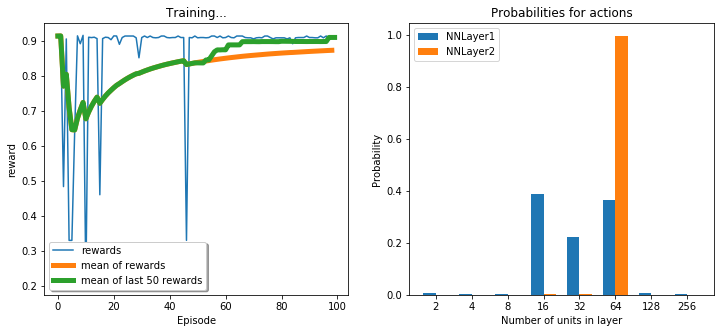

epoch 99 
Network (32, 64) accuracy:0.913, average rewards: 0.873


<Figure size 432x288 with 0 Axes>

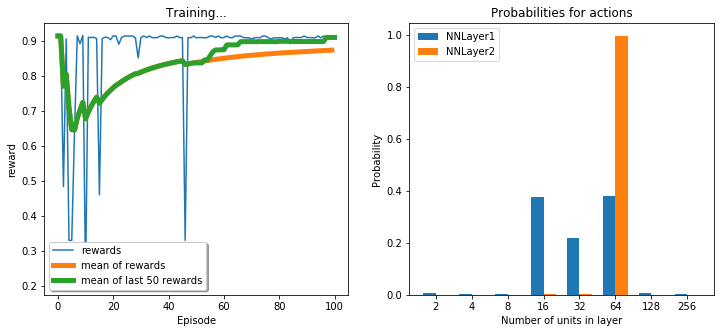

epoch 100 
Network (64, 64) accuracy:0.909, average rewards: 0.873


<Figure size 432x288 with 0 Axes>

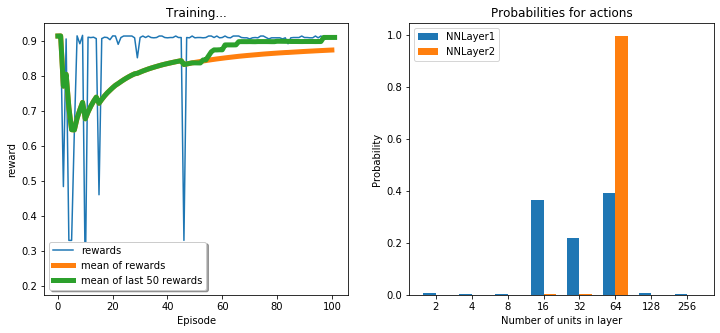

epoch 101 
Network (32, 64) accuracy:0.913, average rewards: 0.874


<Figure size 432x288 with 0 Axes>

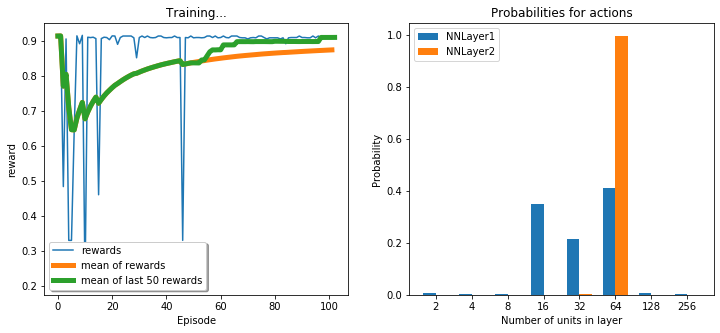

epoch 102 
Network (16, 64) accuracy:0.908, average rewards: 0.874


<Figure size 432x288 with 0 Axes>

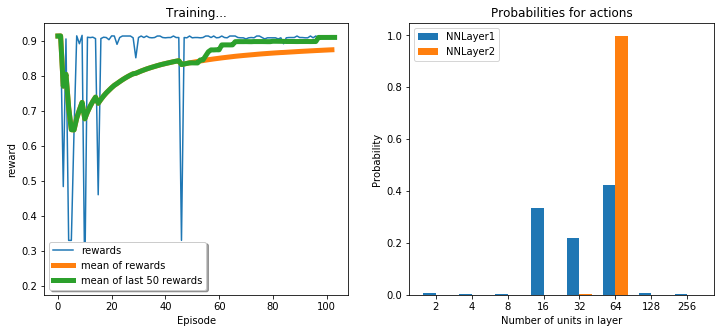

epoch 103 
Network (64, 64) accuracy:0.909, average rewards: 0.874


<Figure size 432x288 with 0 Axes>

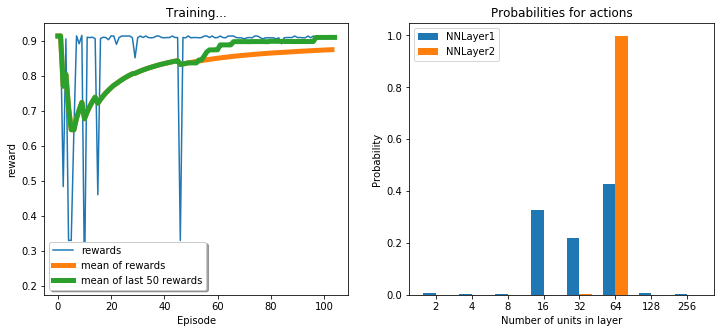

epoch 104 
Network (16, 64) accuracy:0.908, average rewards: 0.875


<Figure size 432x288 with 0 Axes>

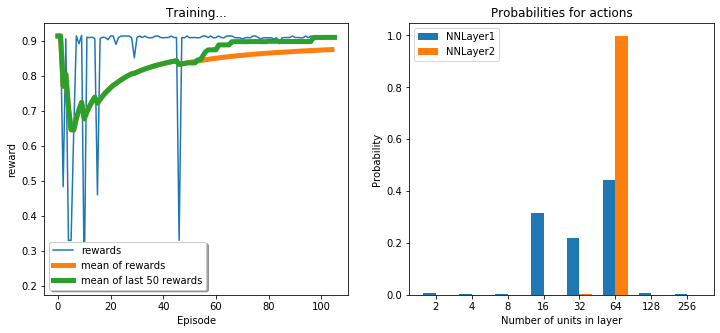

epoch 105 
Network (32, 64) accuracy:0.913, average rewards: 0.875


<Figure size 432x288 with 0 Axes>

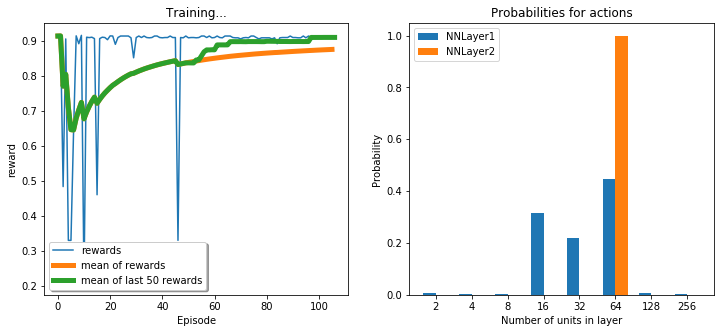

epoch 106 
Network (64, 64) accuracy:0.909, average rewards: 0.875


<Figure size 432x288 with 0 Axes>

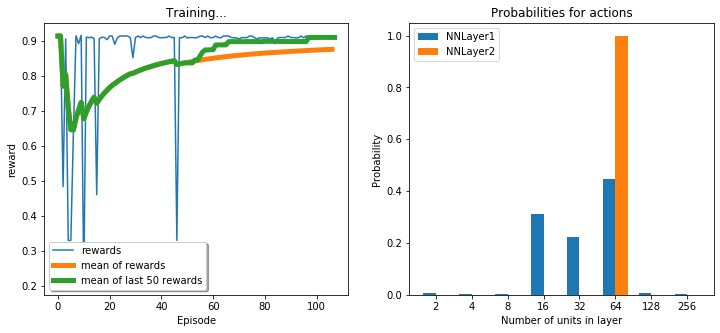

epoch 107 
Network (64, 64) accuracy:0.909, average rewards: 0.876


<Figure size 432x288 with 0 Axes>

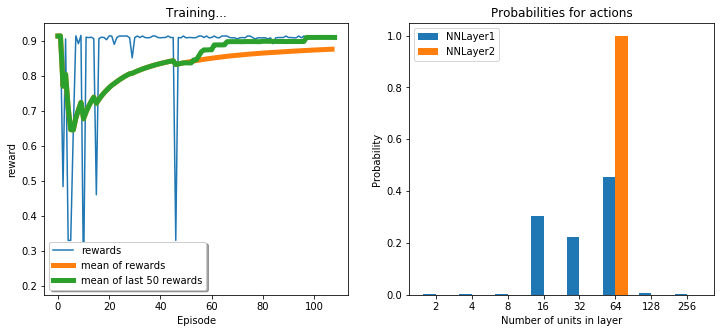

epoch 108 
Network (64, 64) accuracy:0.909, average rewards: 0.876


<Figure size 432x288 with 0 Axes>

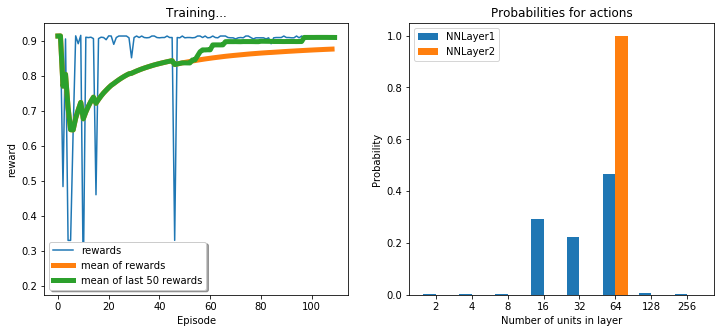

epoch 109 
Network (32, 64) accuracy:0.913, average rewards: 0.876


<Figure size 432x288 with 0 Axes>

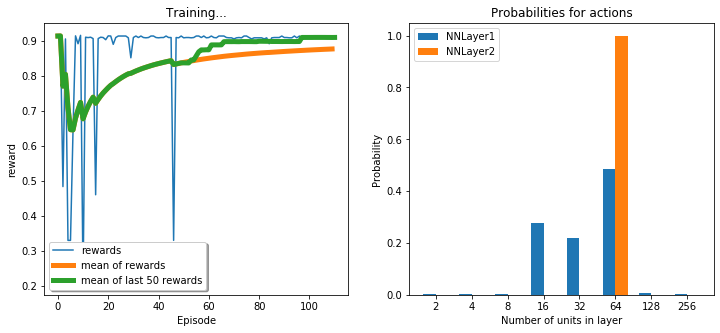

epoch 110 
Network (64, 64) accuracy:0.909, average rewards: 0.876


<Figure size 432x288 with 0 Axes>

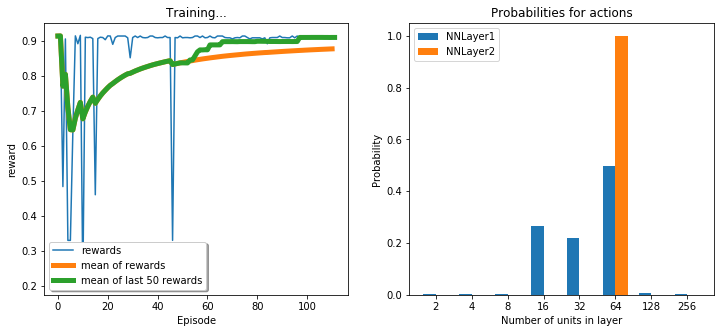

epoch 111 
Network (16, 64) accuracy:0.908, average rewards: 0.877


<Figure size 432x288 with 0 Axes>

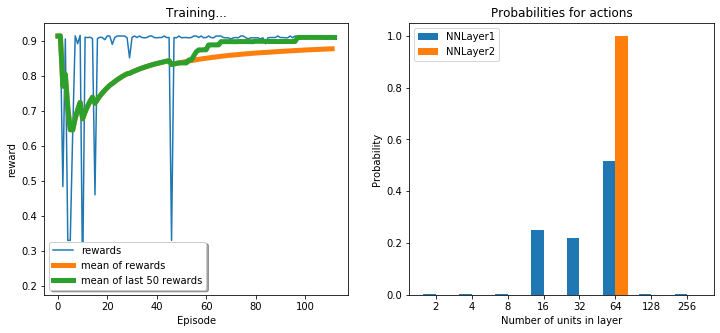

epoch 112 
Network (64, 64) accuracy:0.909, average rewards: 0.877


<Figure size 432x288 with 0 Axes>

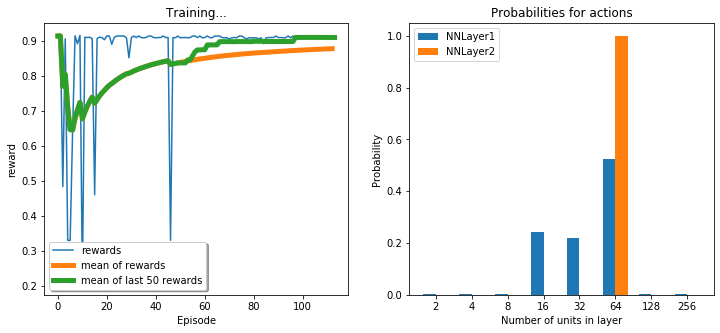

epoch 113 
Network (32, 64) accuracy:0.913, average rewards: 0.877


<Figure size 432x288 with 0 Axes>

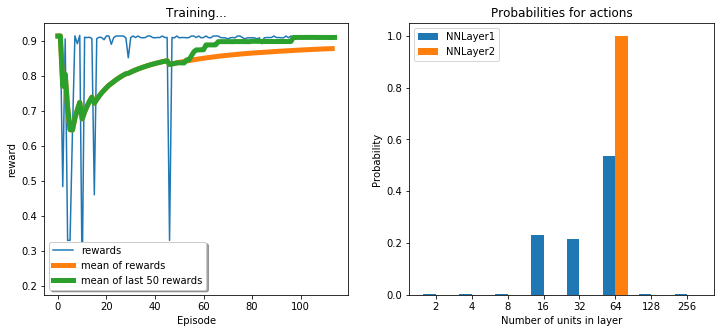

epoch 114 
Network (16, 64) accuracy:0.908, average rewards: 0.878


<Figure size 432x288 with 0 Axes>

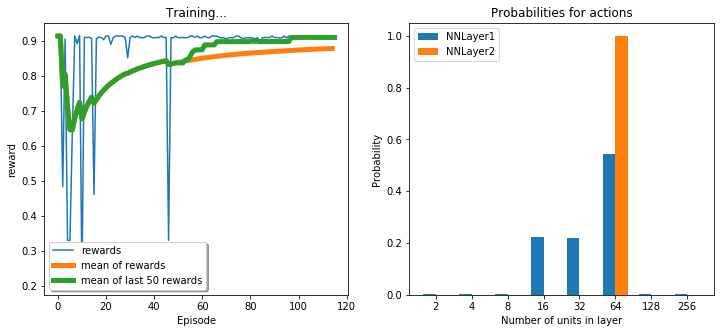

epoch 115 
Network (64, 64) accuracy:0.909, average rewards: 0.878


<Figure size 432x288 with 0 Axes>

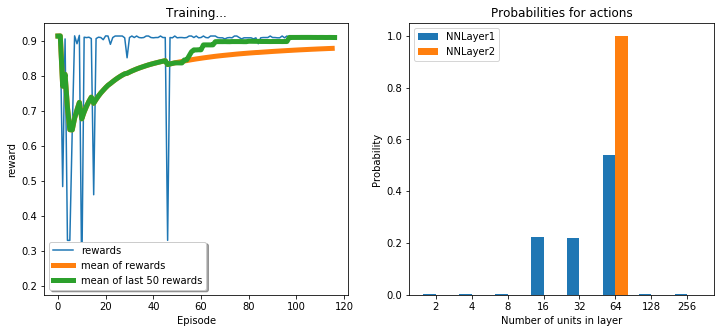

epoch 116 
Network (64, 64) accuracy:0.909, average rewards: 0.878


<Figure size 432x288 with 0 Axes>

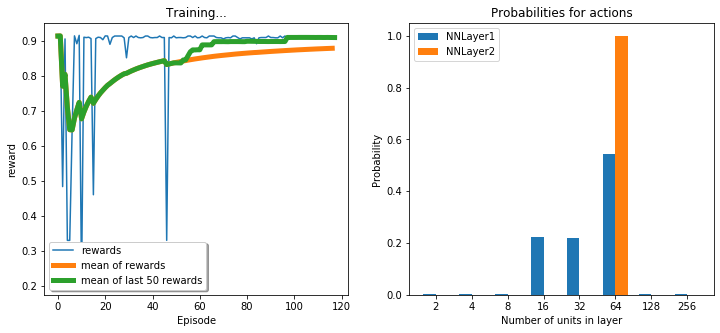

epoch 117 
Network (16, 64) accuracy:0.908, average rewards: 0.878


<Figure size 432x288 with 0 Axes>

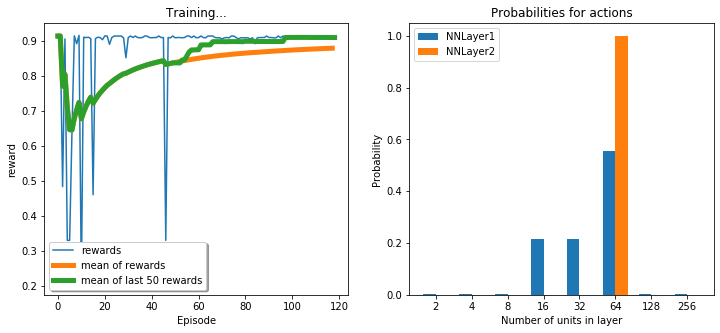

epoch 118 
Network (32, 64) accuracy:0.913, average rewards: 0.879


<Figure size 432x288 with 0 Axes>

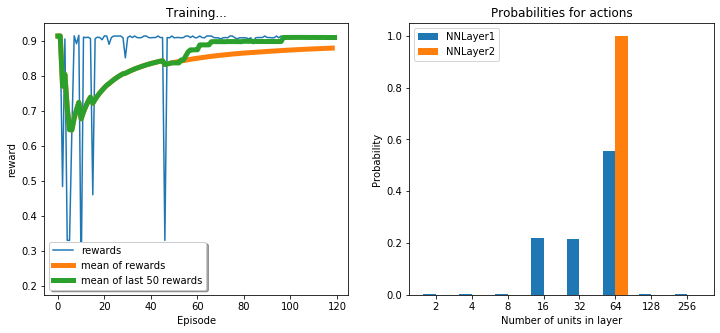

epoch 119 
Network (64, 64) accuracy:0.909, average rewards: 0.879


<Figure size 432x288 with 0 Axes>

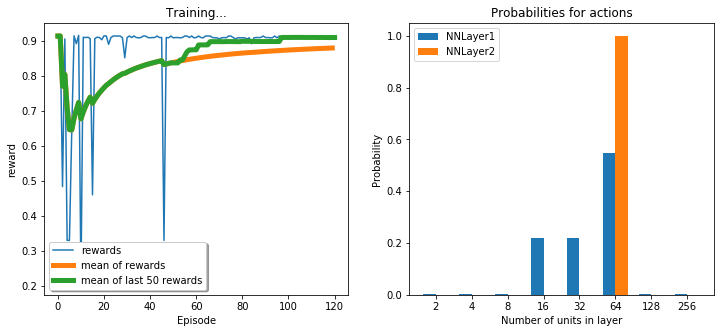

epoch 120 
Network (32, 64) accuracy:0.913, average rewards: 0.879


<Figure size 432x288 with 0 Axes>

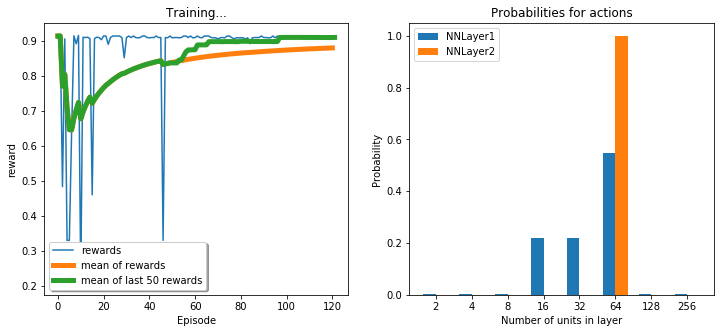

epoch 121 
Network (32, 64) accuracy:0.913, average rewards: 0.879


<Figure size 432x288 with 0 Axes>

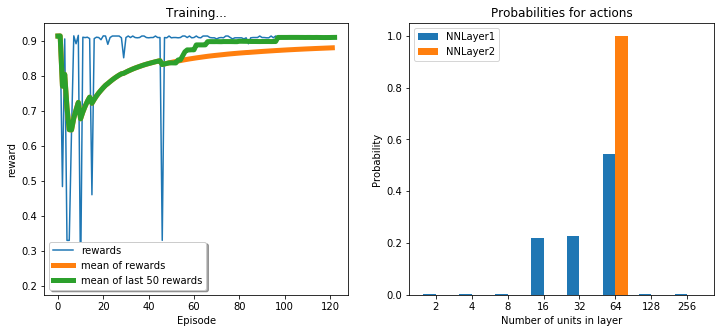

epoch 122 
Network (64, 64) accuracy:0.909, average rewards: 0.880


<Figure size 432x288 with 0 Axes>

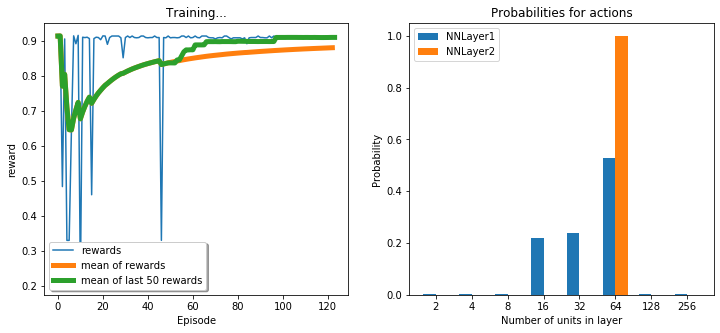

epoch 123 
Network (64, 64) accuracy:0.909, average rewards: 0.880


<Figure size 432x288 with 0 Axes>

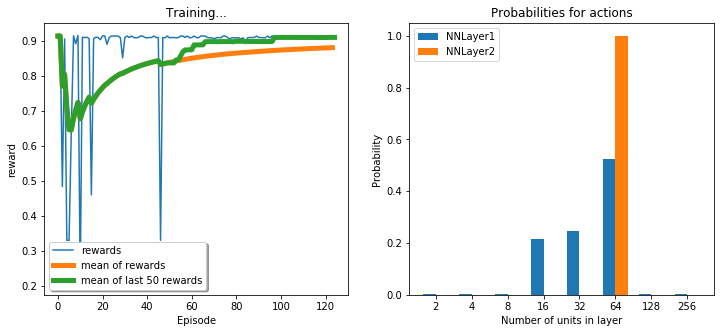

epoch 124 
Network (64, 64) accuracy:0.909, average rewards: 0.880


<Figure size 432x288 with 0 Axes>

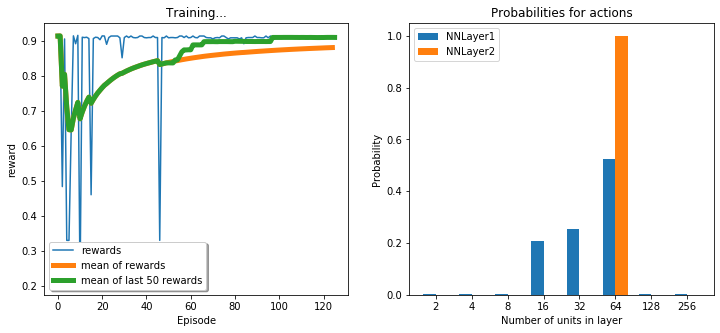

epoch 125 
Network (64, 64) accuracy:0.909, average rewards: 0.880


<Figure size 432x288 with 0 Axes>

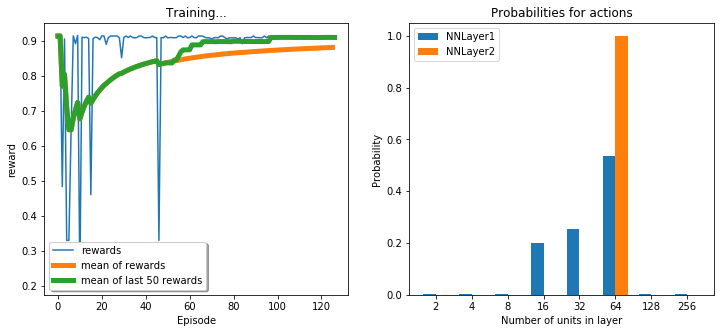

epoch 126 
Network (64, 64) accuracy:0.909, average rewards: 0.881


<Figure size 432x288 with 0 Axes>

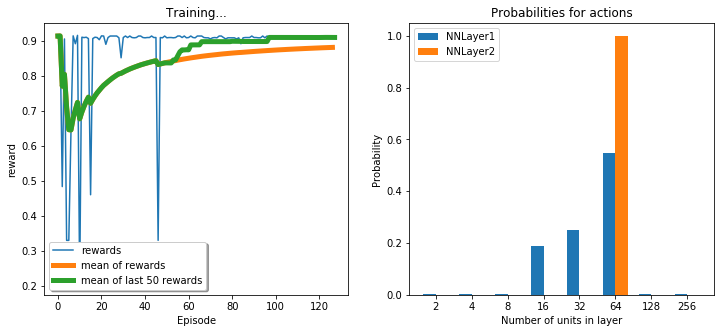

epoch 127 
Network (64, 64) accuracy:0.909, average rewards: 0.881


<Figure size 432x288 with 0 Axes>

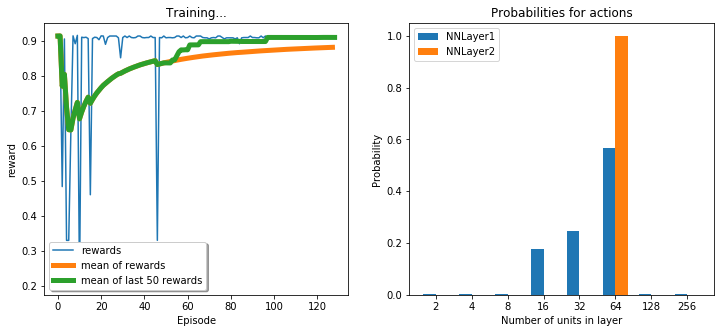

epoch 128 
Network (64, 64) accuracy:0.909, average rewards: 0.881


<Figure size 432x288 with 0 Axes>

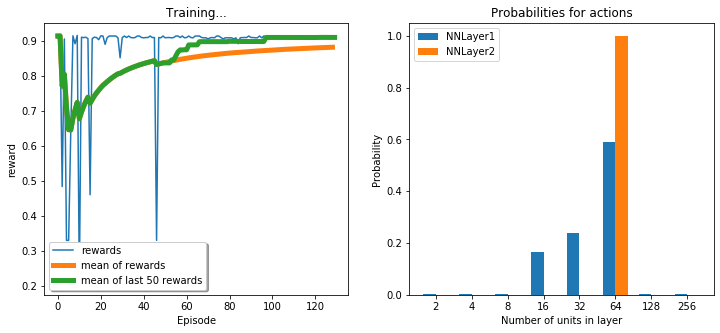

epoch 129 
Network (64, 64) accuracy:0.909, average rewards: 0.881


<Figure size 432x288 with 0 Axes>

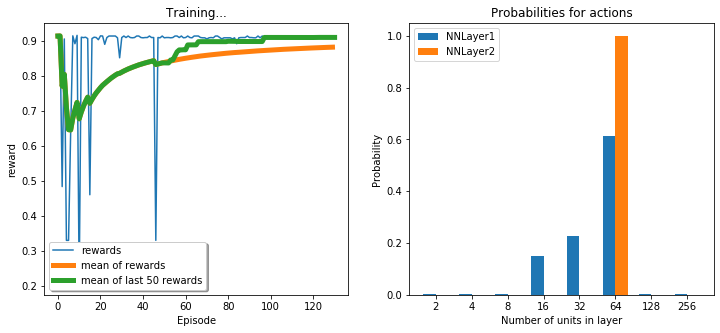

epoch 130 
Network (64, 64) accuracy:0.909, average rewards: 0.881


<Figure size 432x288 with 0 Axes>

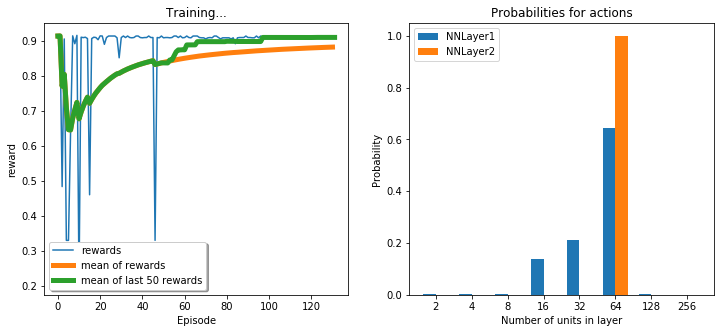

epoch 131 
Network (64, 64) accuracy:0.909, average rewards: 0.882


<Figure size 432x288 with 0 Axes>

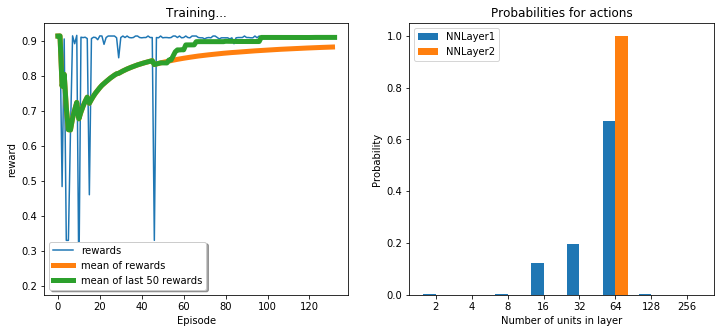

epoch 132 
Network (64, 64) accuracy:0.909, average rewards: 0.882


<Figure size 432x288 with 0 Axes>

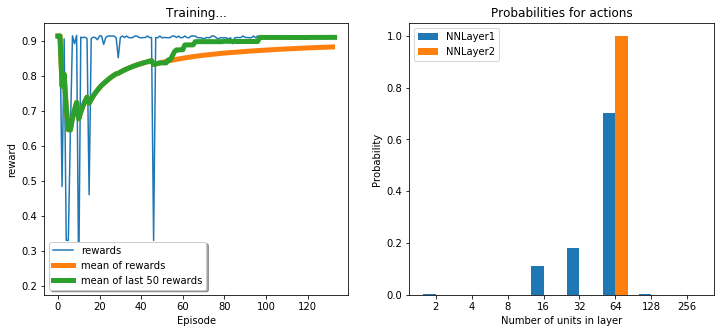

epoch 133 
Network (64, 64) accuracy:0.909, average rewards: 0.882


<Figure size 432x288 with 0 Axes>

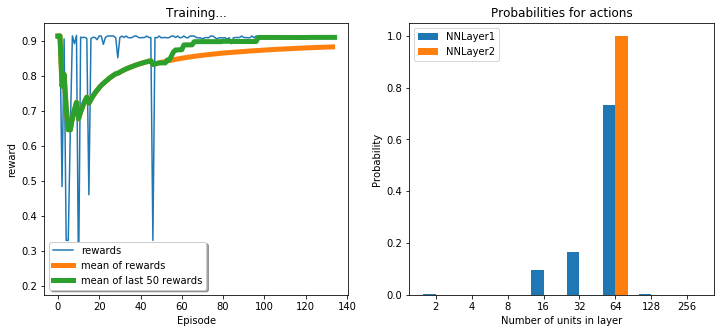

epoch 134 
Network (64, 64) accuracy:0.909, average rewards: 0.882


<Figure size 432x288 with 0 Axes>

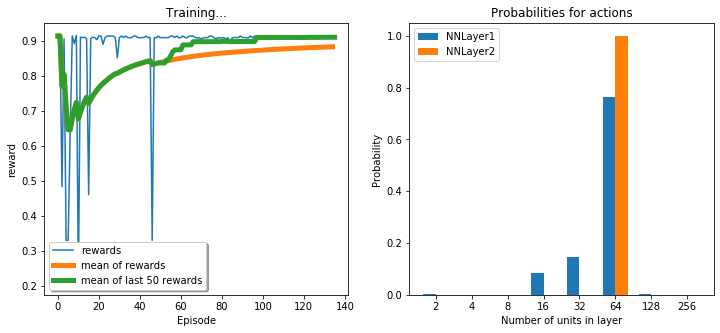

epoch 135 
Network (32, 64) accuracy:0.913, average rewards: 0.883


<Figure size 432x288 with 0 Axes>

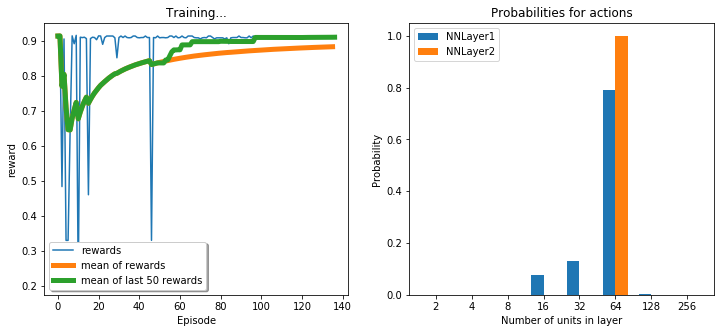

epoch 136 
Network (64, 64) accuracy:0.909, average rewards: 0.883


<Figure size 432x288 with 0 Axes>

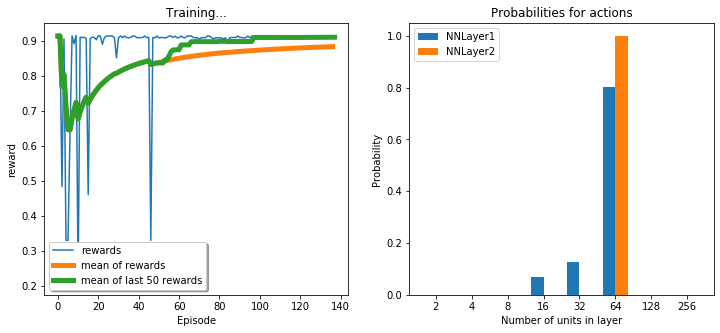

epoch 137 
Network (64, 64) accuracy:0.909, average rewards: 0.883


<Figure size 432x288 with 0 Axes>

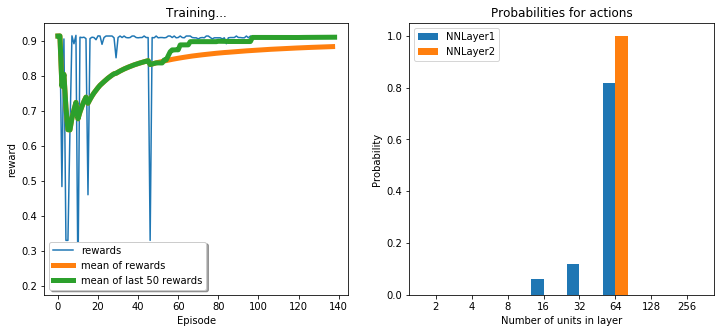

epoch 138 
Network (64, 64) accuracy:0.909, average rewards: 0.883


<Figure size 432x288 with 0 Axes>

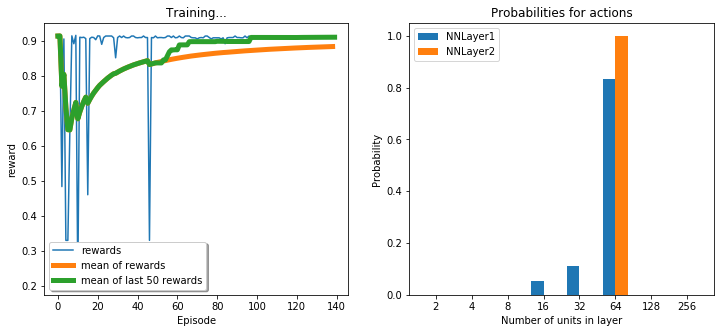

epoch 139 
Network (16, 64) accuracy:0.908, average rewards: 0.883


<Figure size 432x288 with 0 Axes>

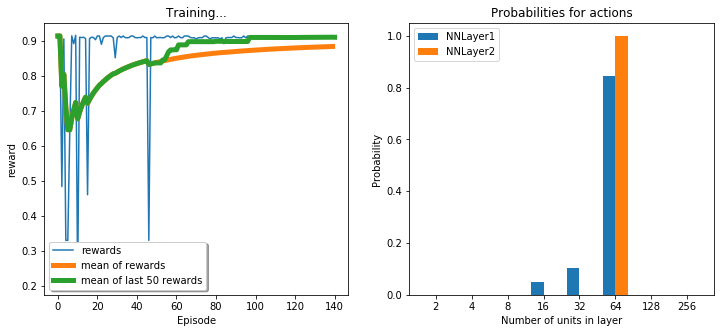

epoch 140 
Network (64, 64) accuracy:0.909, average rewards: 0.883


<Figure size 432x288 with 0 Axes>

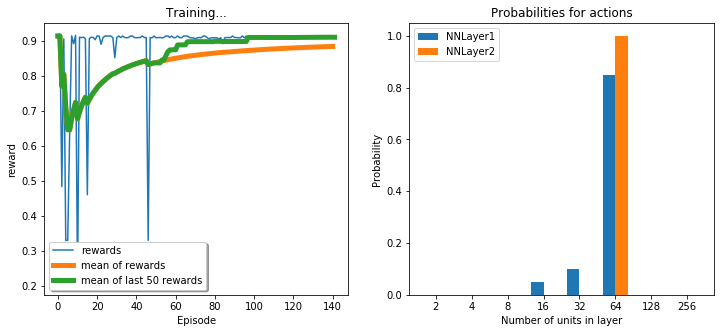

epoch 141 
Network (64, 64) accuracy:0.909, average rewards: 0.884


<Figure size 432x288 with 0 Axes>

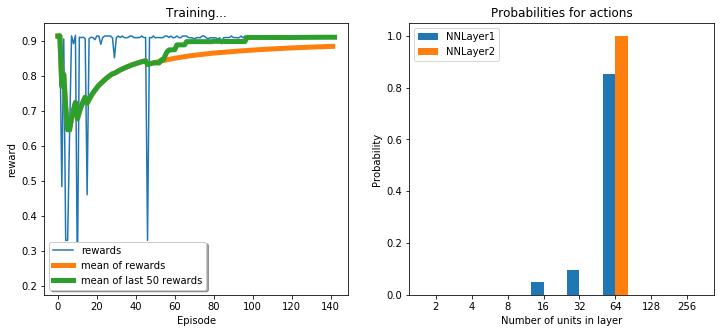

epoch 142 
Network (64, 64) accuracy:0.909, average rewards: 0.884


<Figure size 432x288 with 0 Axes>

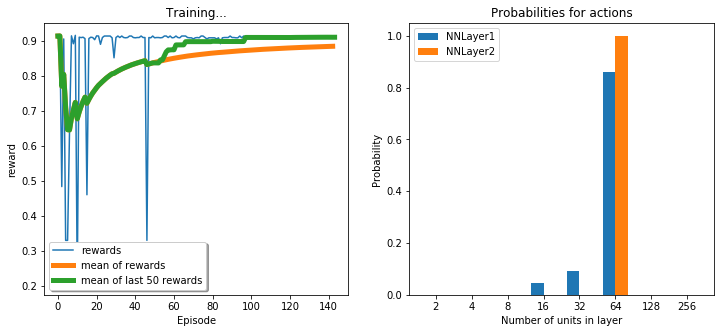

epoch 143 
Network (64, 64) accuracy:0.909, average rewards: 0.884


<Figure size 432x288 with 0 Axes>

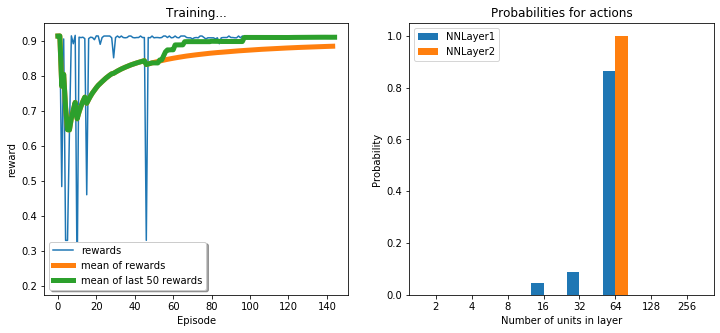

epoch 144 
Network (64, 64) accuracy:0.909, average rewards: 0.884


<Figure size 432x288 with 0 Axes>

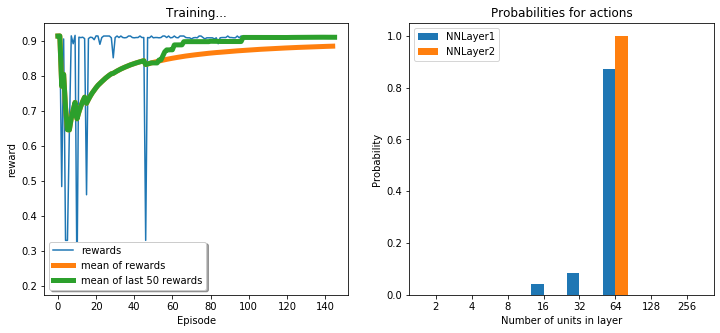

epoch 145 
Network (64, 64) accuracy:0.909, average rewards: 0.884


<Figure size 432x288 with 0 Axes>

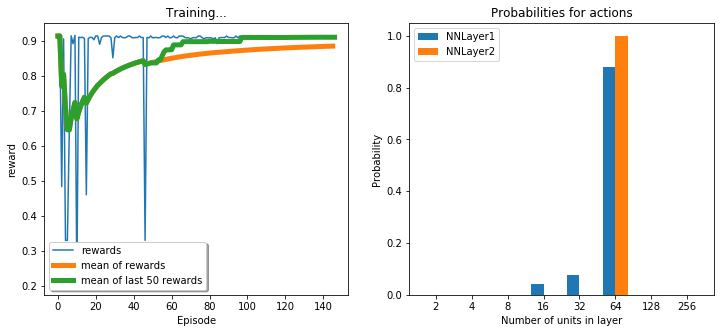

epoch 146 
Network (64, 64) accuracy:0.909, average rewards: 0.884


<Figure size 432x288 with 0 Axes>

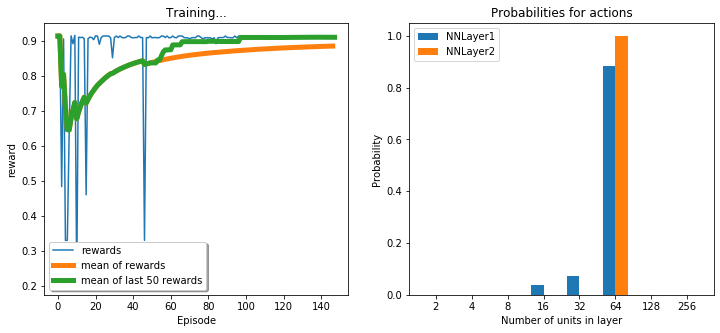

epoch 147 
Network (64, 64) accuracy:0.909, average rewards: 0.885


<Figure size 432x288 with 0 Axes>

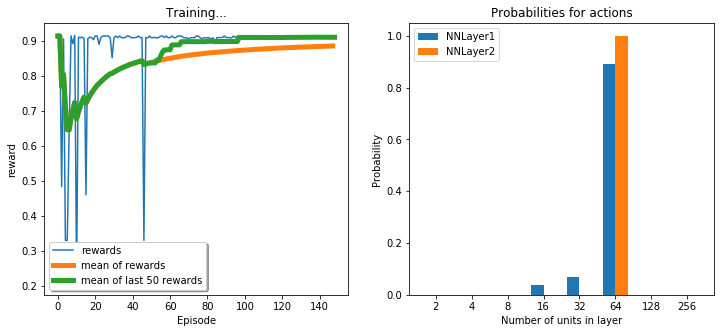

epoch 148 
Network (64, 64) accuracy:0.909, average rewards: 0.885


<Figure size 432x288 with 0 Axes>

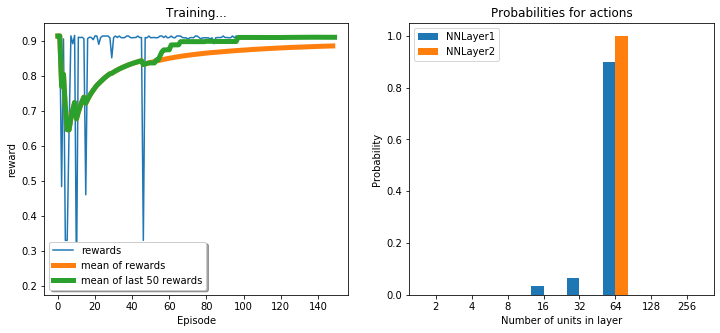

epoch 149 
Network (16, 64) accuracy:0.908, average rewards: 0.885


<Figure size 432x288 with 0 Axes>

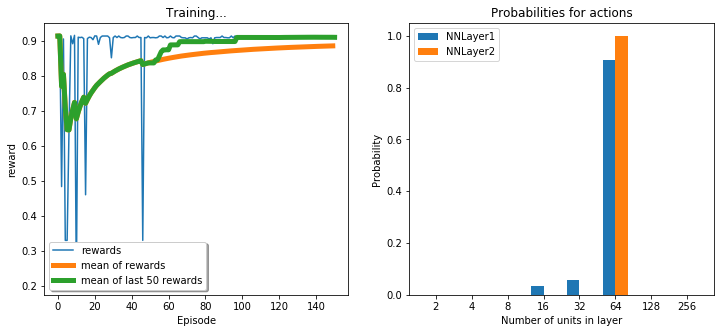

epoch 150 
Network (64, 64) accuracy:0.909, average rewards: 0.885


<Figure size 432x288 with 0 Axes>

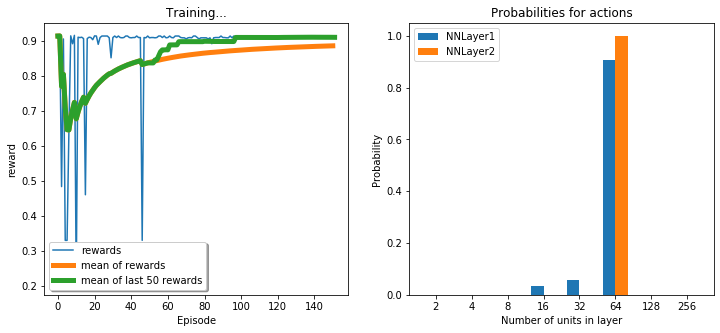

epoch 151 
Network (64, 64) accuracy:0.909, average rewards: 0.885


<Figure size 432x288 with 0 Axes>

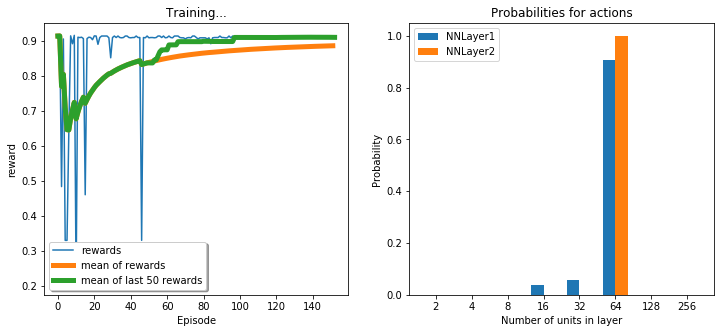

epoch 152 
Network (64, 64) accuracy:0.909, average rewards: 0.885


<Figure size 432x288 with 0 Axes>

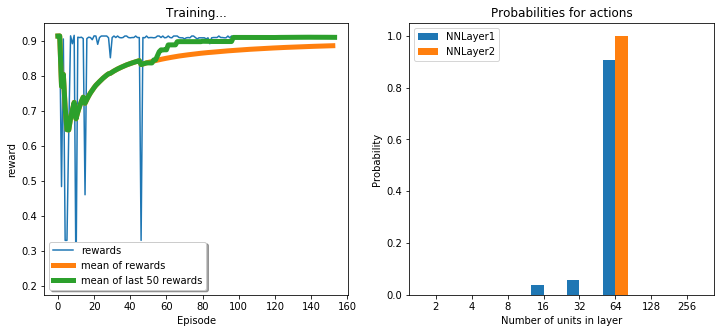

epoch 153 
Network (64, 64) accuracy:0.909, average rewards: 0.886


<Figure size 432x288 with 0 Axes>

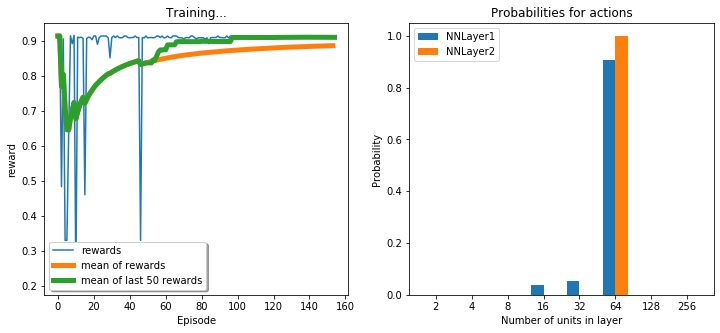

epoch 154 
Network (64, 64) accuracy:0.909, average rewards: 0.886


<Figure size 432x288 with 0 Axes>

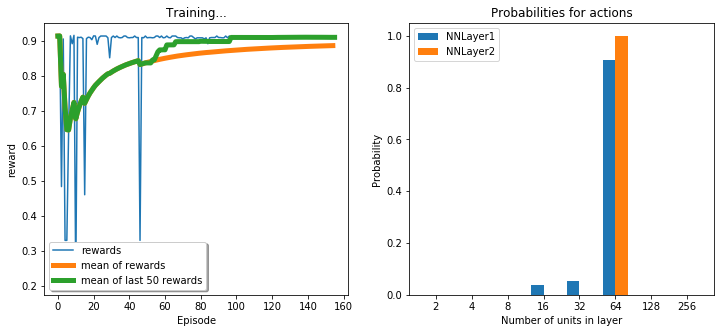

epoch 155 
Network (64, 64) accuracy:0.909, average rewards: 0.886


<Figure size 432x288 with 0 Axes>

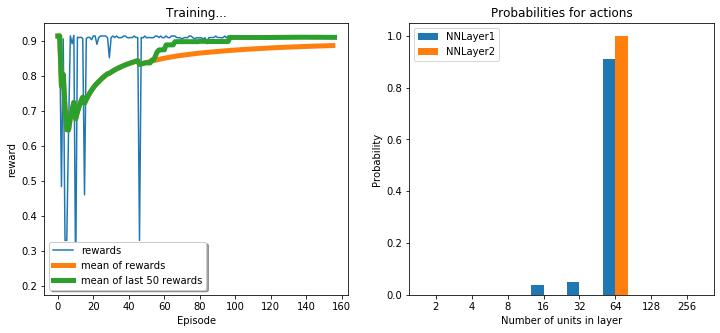

epoch 156 
Network (64, 64) accuracy:0.909, average rewards: 0.886


<Figure size 432x288 with 0 Axes>

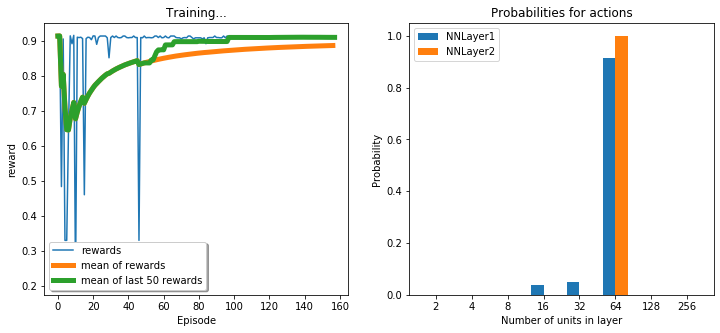

epoch 157 
Network (64, 64) accuracy:0.909, average rewards: 0.886


<Figure size 432x288 with 0 Axes>

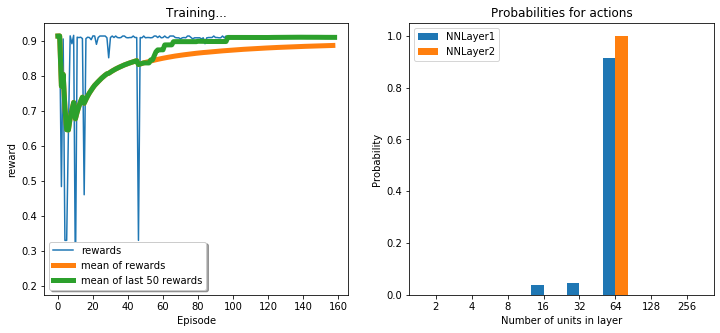

epoch 158 
Network (16, 64) accuracy:0.908, average rewards: 0.886


<Figure size 432x288 with 0 Axes>

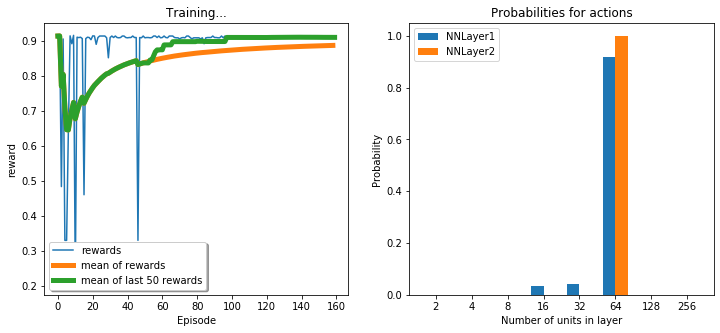

epoch 159 
Network (64, 64) accuracy:0.909, average rewards: 0.886


<Figure size 432x288 with 0 Axes>

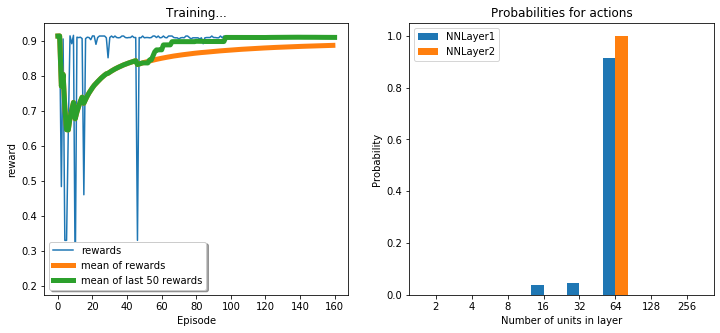

epoch 160 
Network (64, 64) accuracy:0.909, average rewards: 0.887


<Figure size 432x288 with 0 Axes>

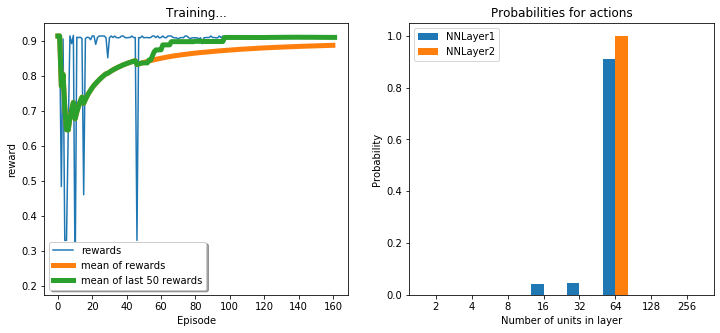

epoch 161 
Network (64, 64) accuracy:0.909, average rewards: 0.887


<Figure size 432x288 with 0 Axes>

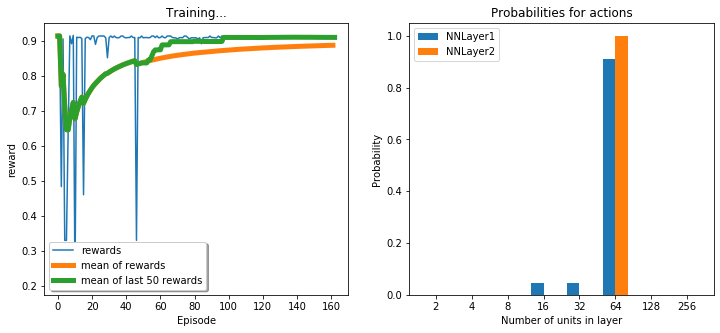

epoch 162 
Network (64, 64) accuracy:0.909, average rewards: 0.887


<Figure size 432x288 with 0 Axes>

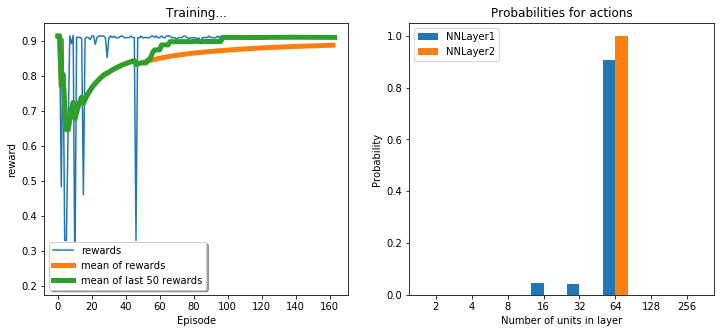

epoch 163 
Network (64, 64) accuracy:0.909, average rewards: 0.887


<Figure size 432x288 with 0 Axes>

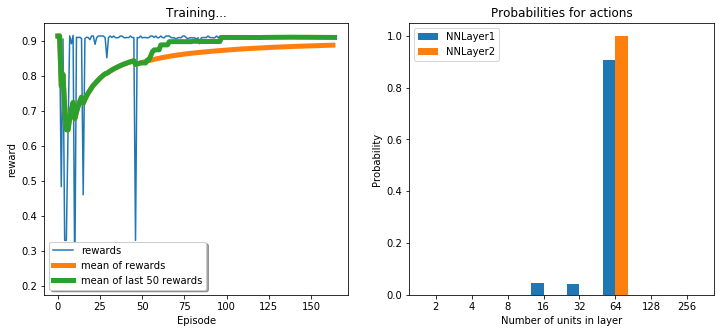

epoch 164 
Network (64, 64) accuracy:0.909, average rewards: 0.887


<Figure size 432x288 with 0 Axes>

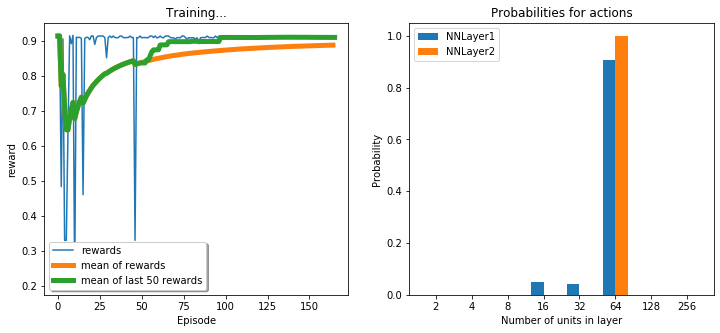

epoch 165 
Network (64, 64) accuracy:0.909, average rewards: 0.887


<Figure size 432x288 with 0 Axes>

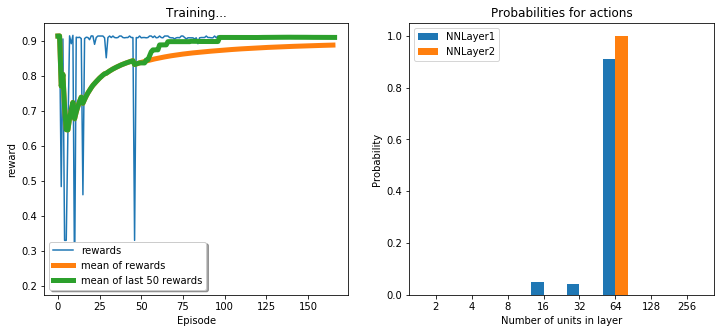

epoch 166 
Network (64, 64) accuracy:0.909, average rewards: 0.887


<Figure size 432x288 with 0 Axes>

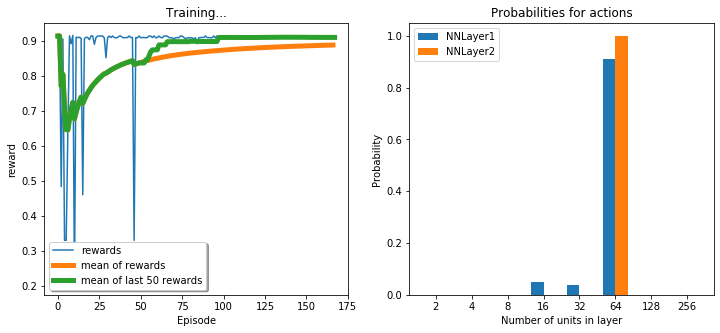

epoch 167 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

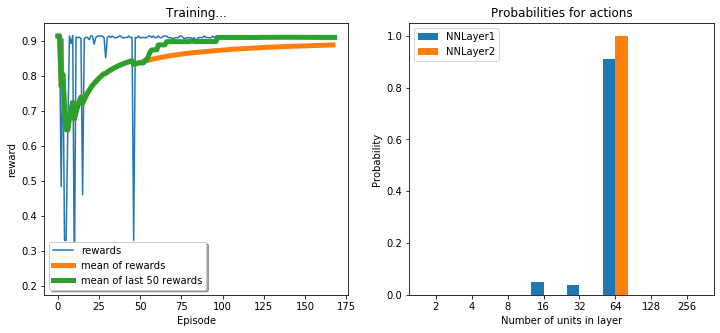

epoch 168 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

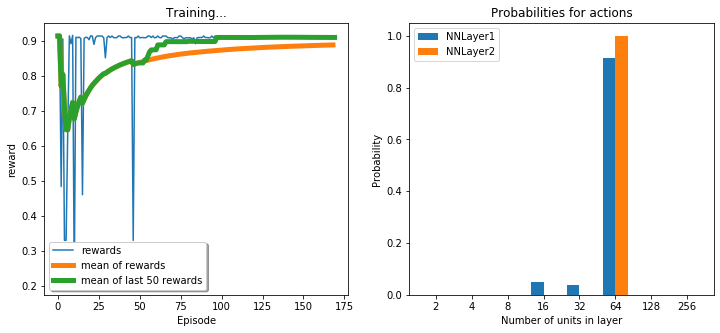

epoch 169 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

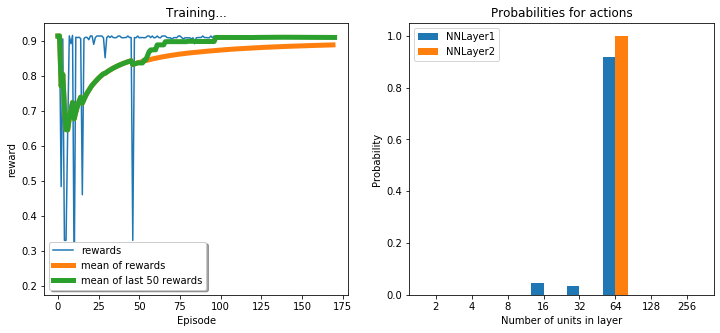

epoch 170 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

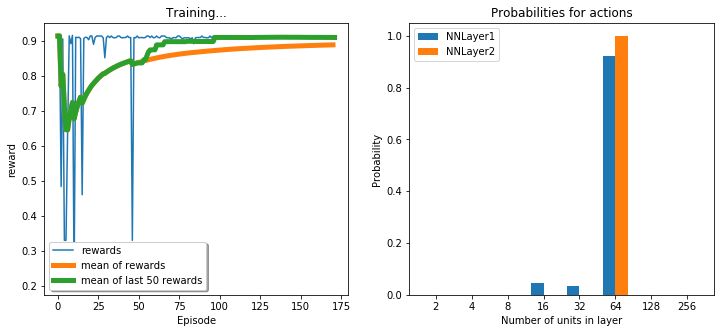

epoch 171 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

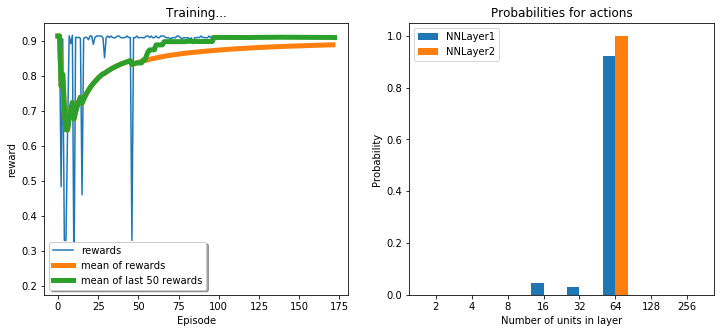

epoch 172 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

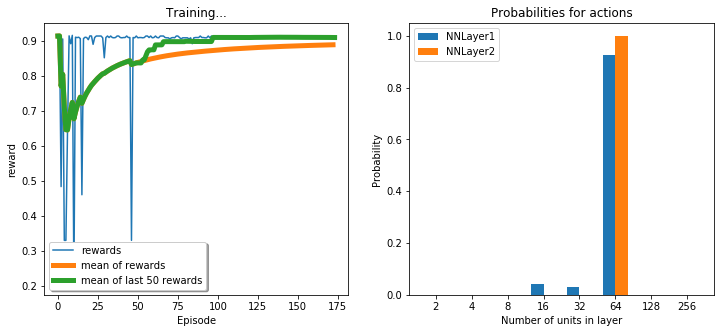

epoch 173 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

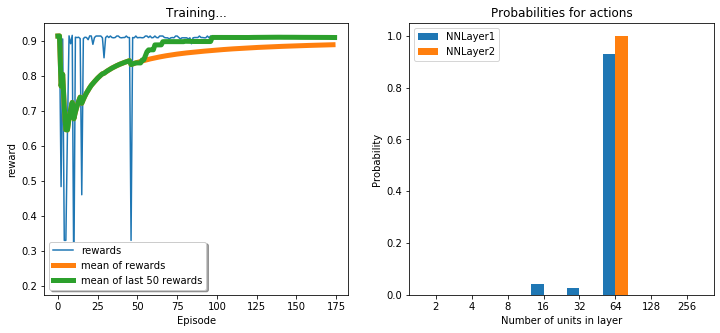

epoch 174 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

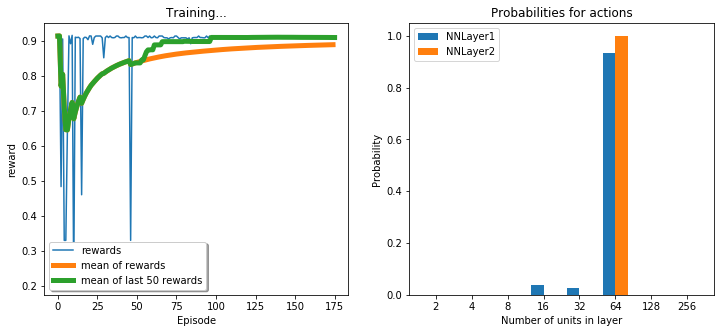

epoch 175 
Network (64, 64) accuracy:0.909, average rewards: 0.888


<Figure size 432x288 with 0 Axes>

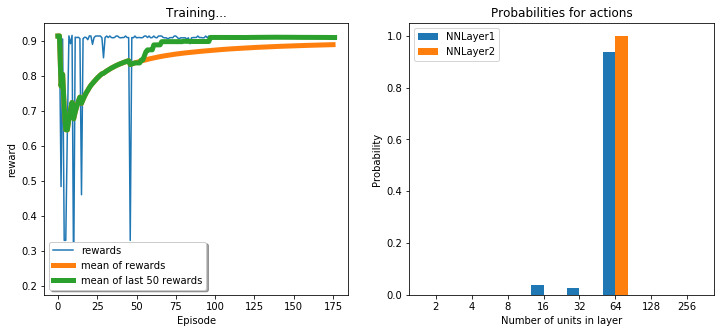

epoch 176 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

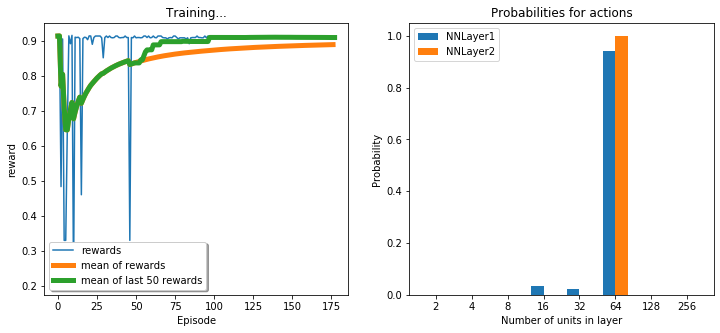

epoch 177 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

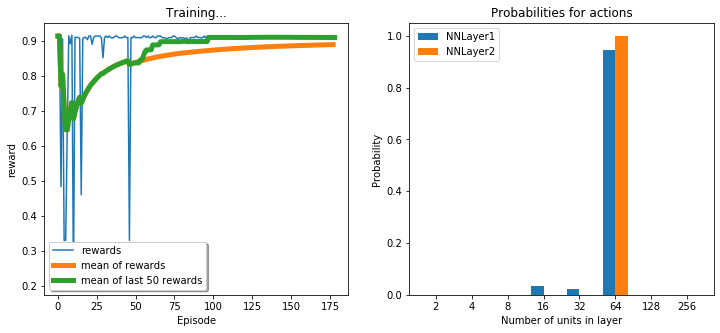

epoch 178 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

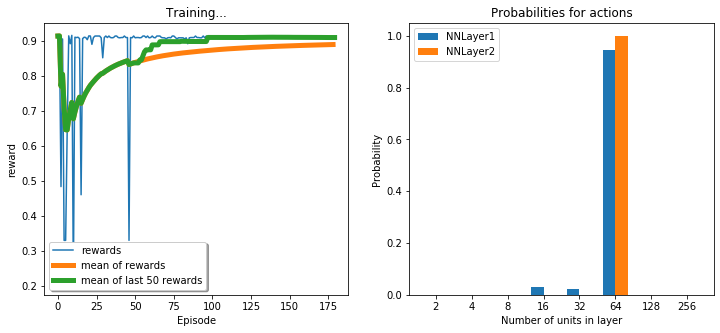

epoch 179 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

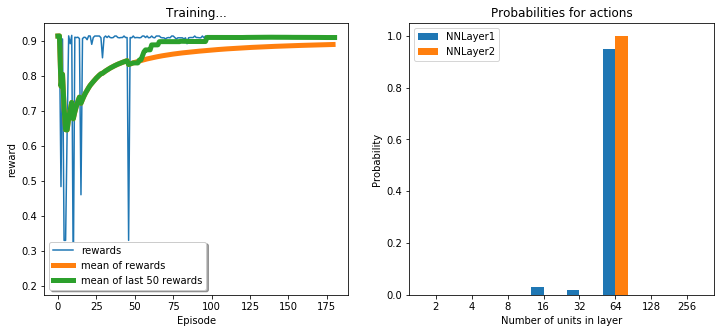

epoch 180 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

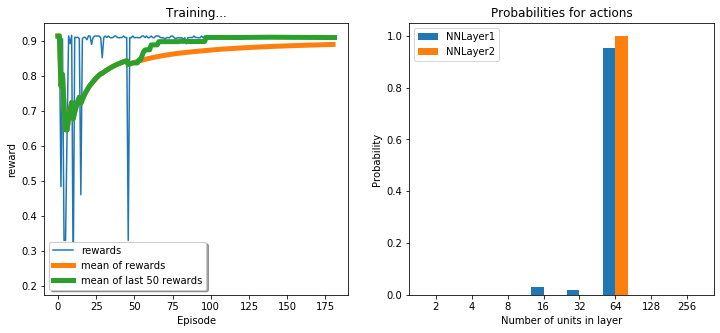

epoch 181 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

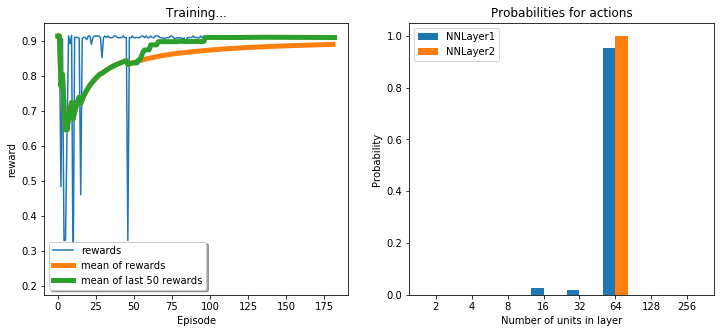

epoch 182 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

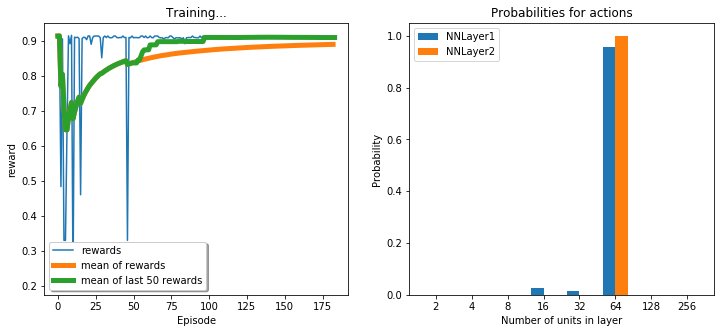

epoch 183 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

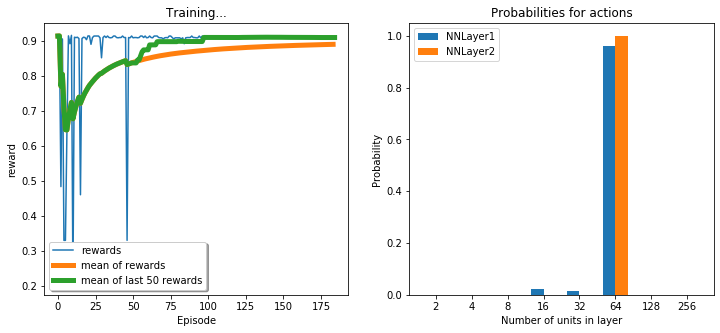

epoch 184 
Network (64, 64) accuracy:0.909, average rewards: 0.889


<Figure size 432x288 with 0 Axes>

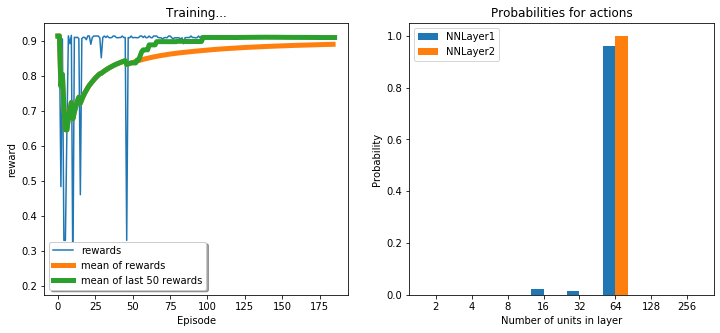

epoch 185 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

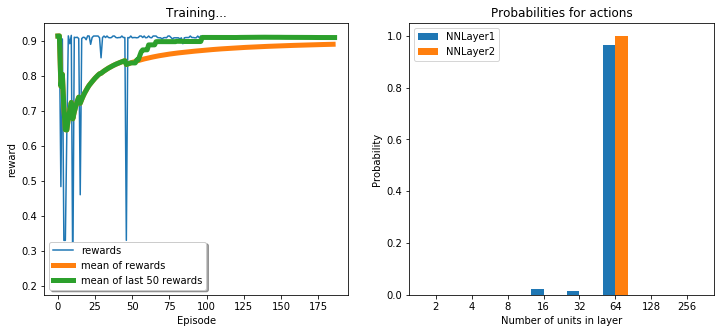

epoch 186 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

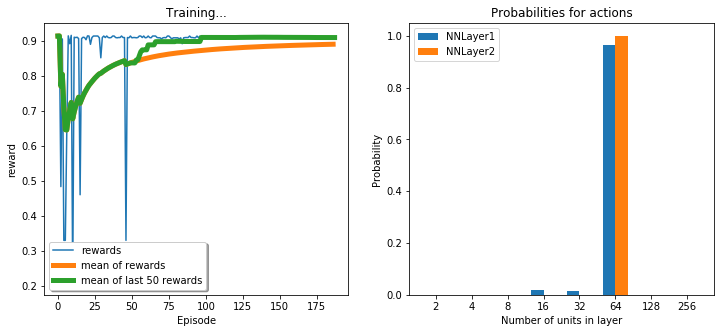

epoch 187 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

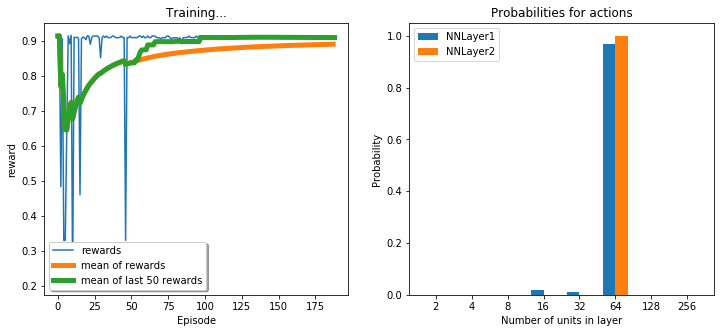

epoch 188 
Network (16, 64) accuracy:0.908, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

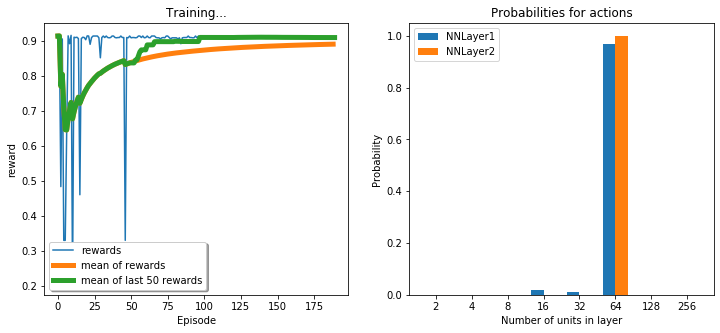

epoch 189 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

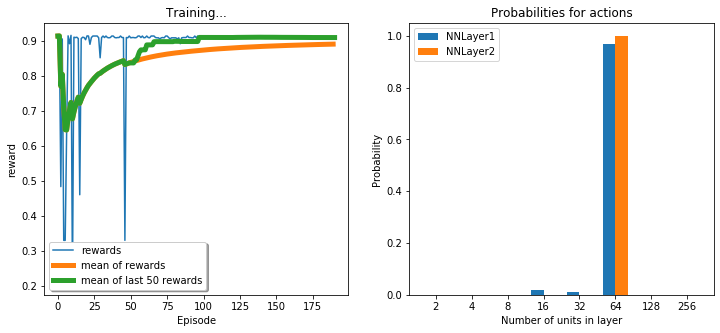

epoch 190 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

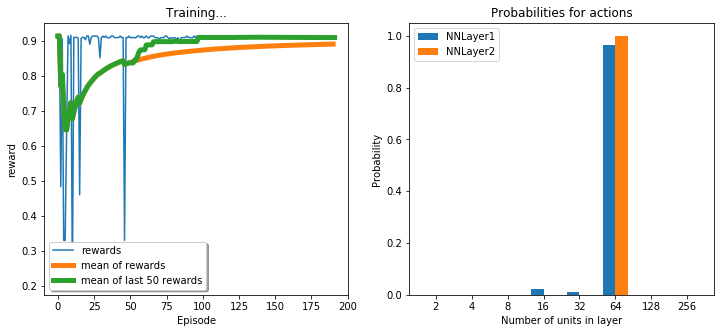

epoch 191 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

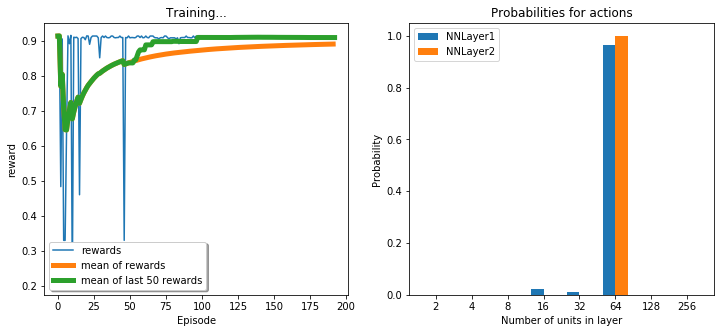

epoch 192 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

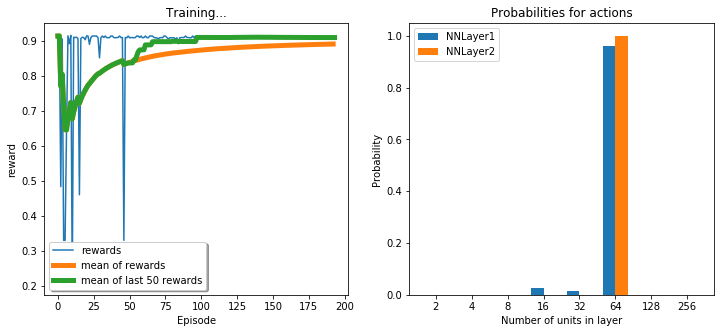

epoch 193 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

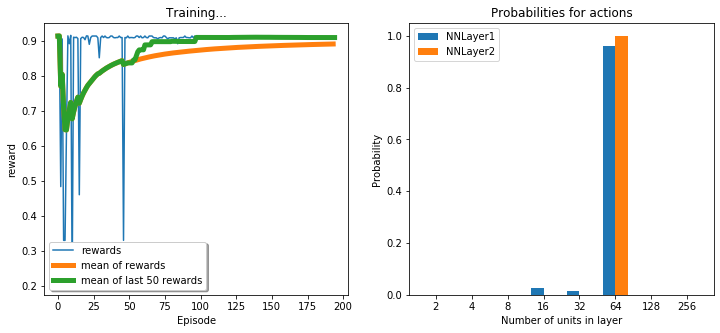

epoch 194 
Network (64, 64) accuracy:0.909, average rewards: 0.890


<Figure size 432x288 with 0 Axes>

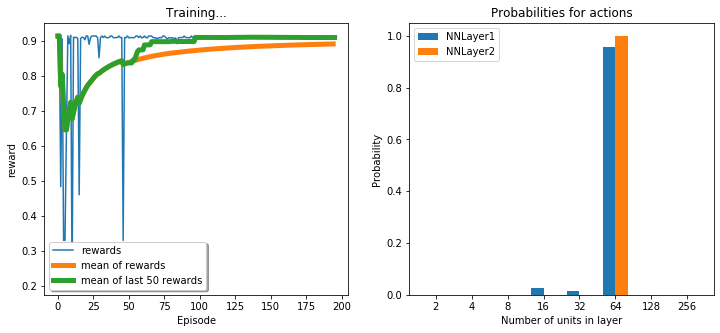

epoch 195 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

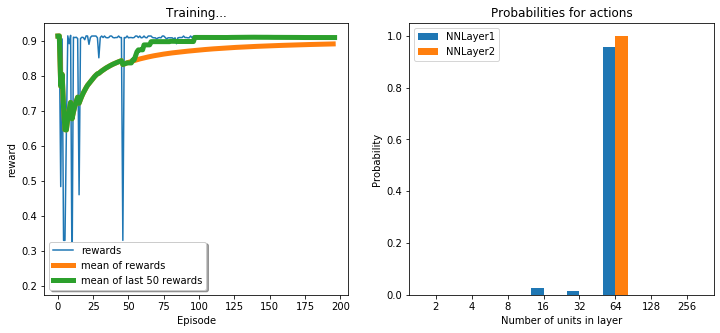

epoch 196 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

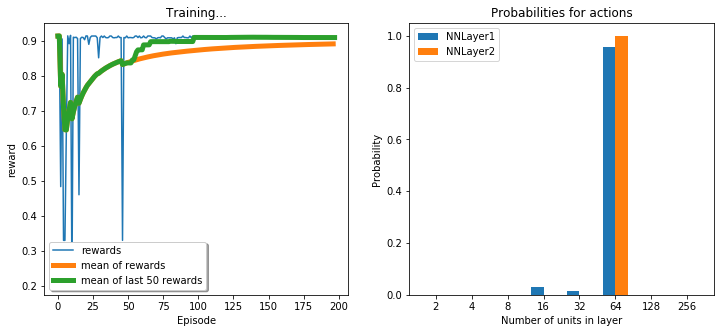

epoch 197 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

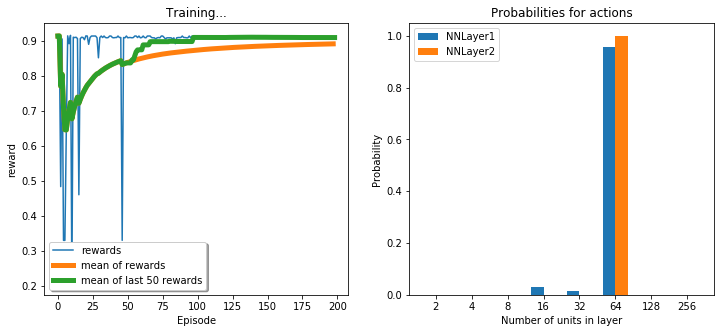

epoch 198 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

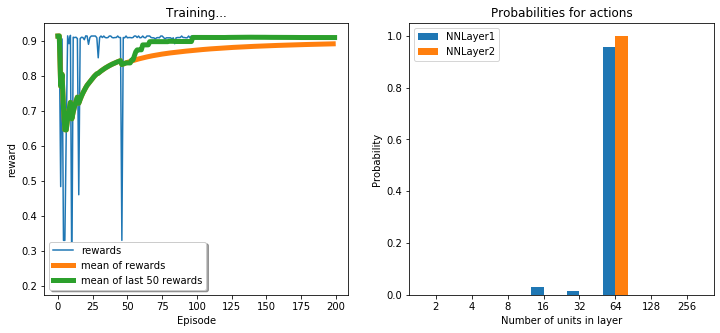

epoch 199 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

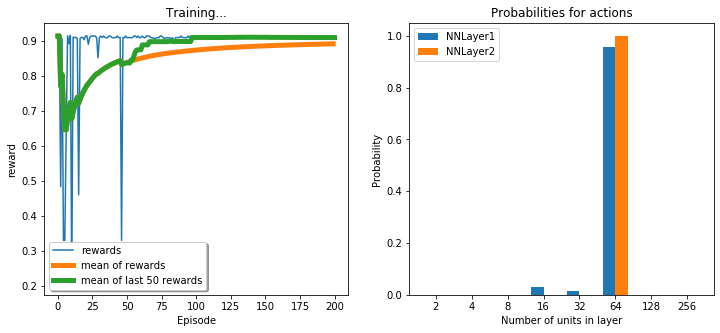

epoch 200 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

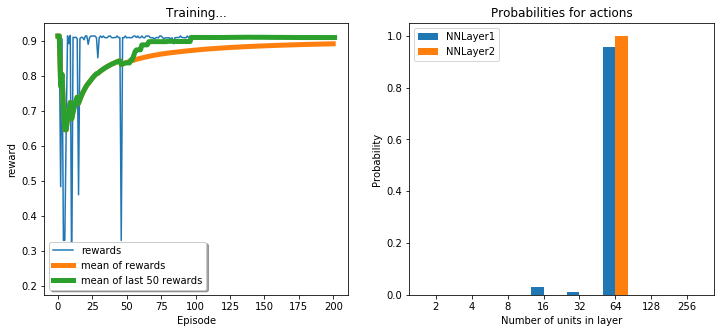

epoch 201 
Network (16, 64) accuracy:0.908, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

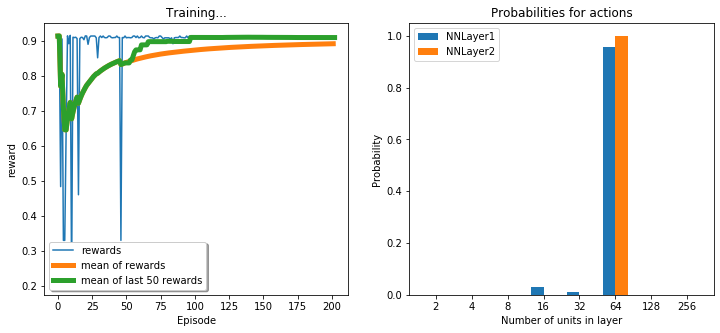

epoch 202 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

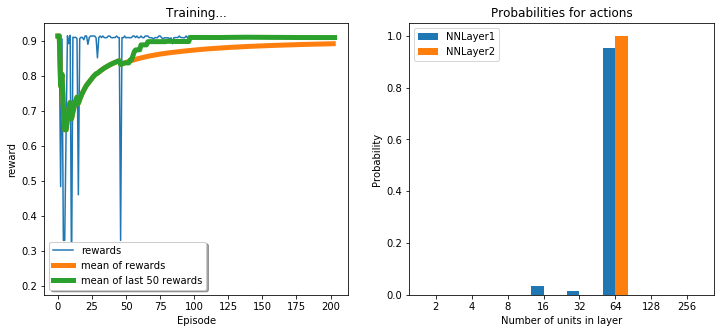

epoch 203 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

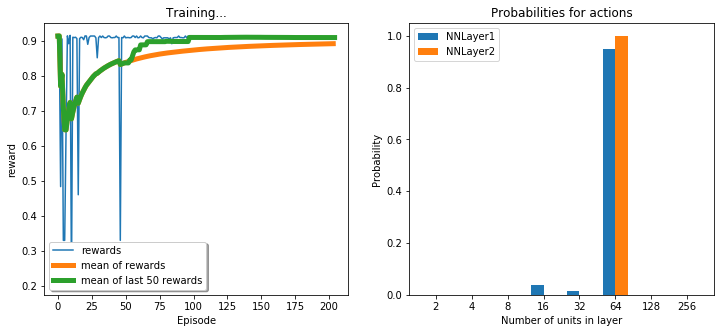

epoch 204 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

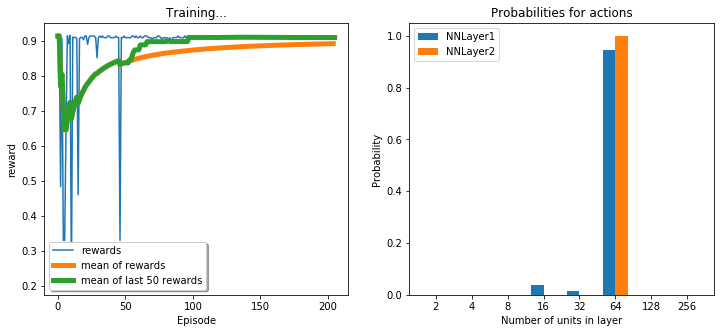

epoch 205 
Network (64, 64) accuracy:0.909, average rewards: 0.891


<Figure size 432x288 with 0 Axes>

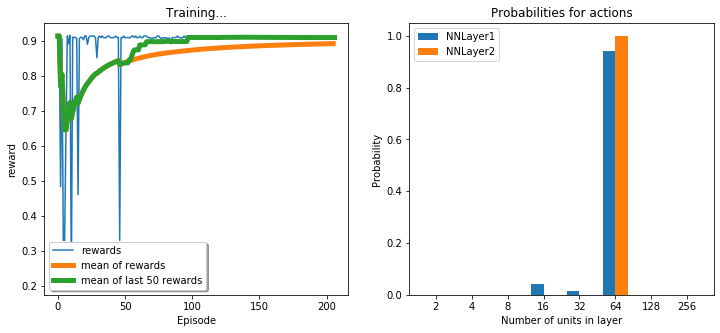

epoch 206 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

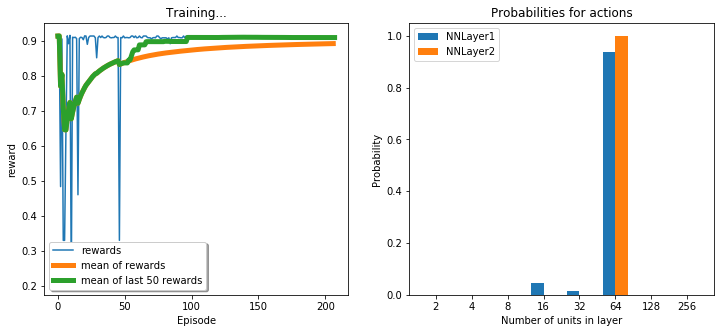

epoch 207 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

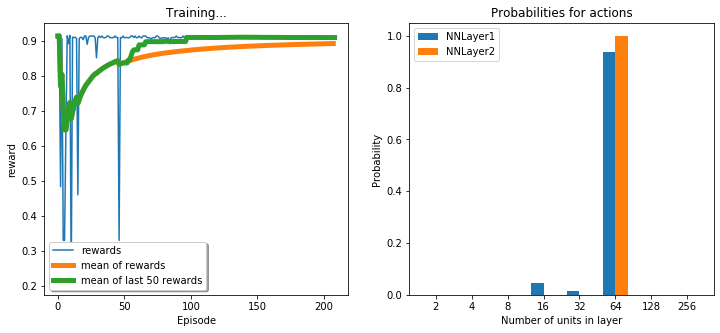

epoch 208 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

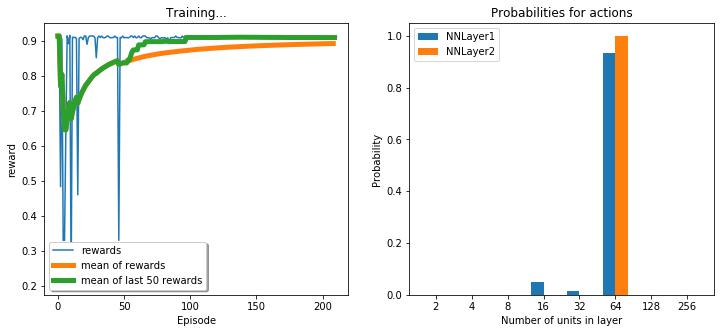

epoch 209 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

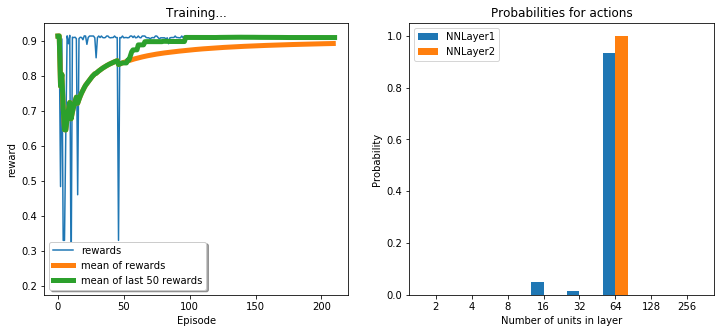

epoch 210 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

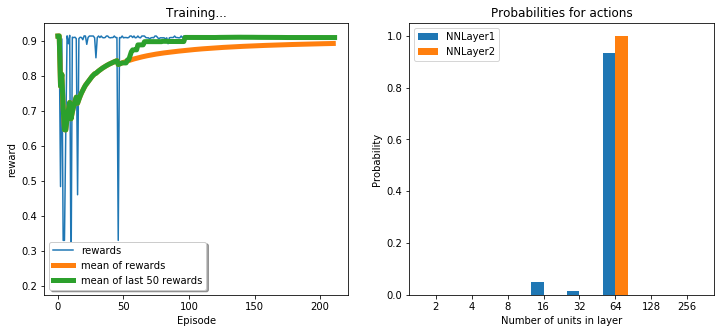

epoch 211 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

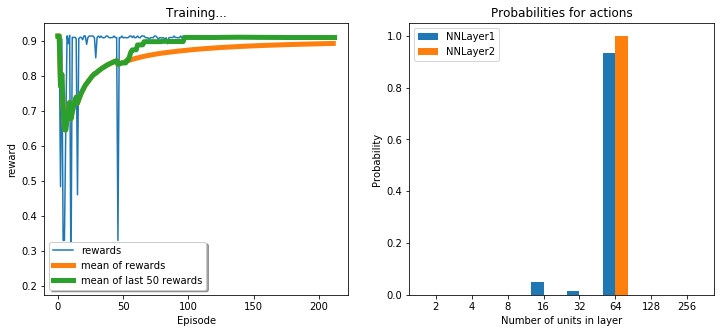

epoch 212 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

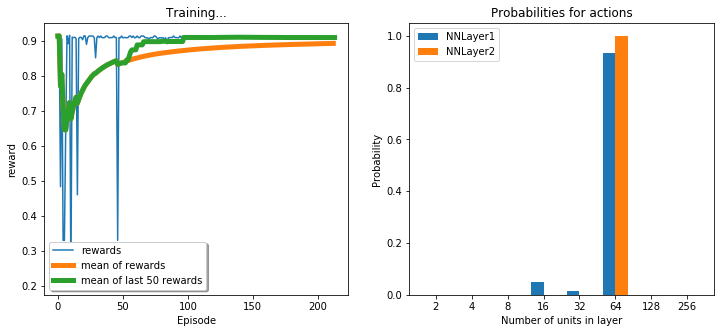

epoch 213 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

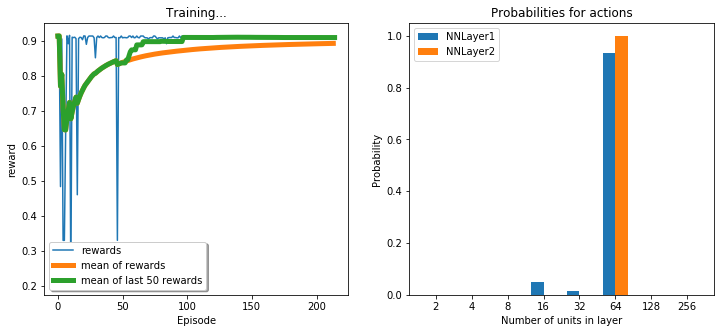

epoch 214 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

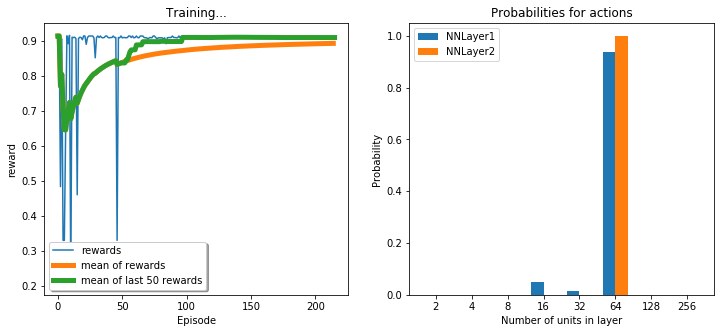

epoch 215 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

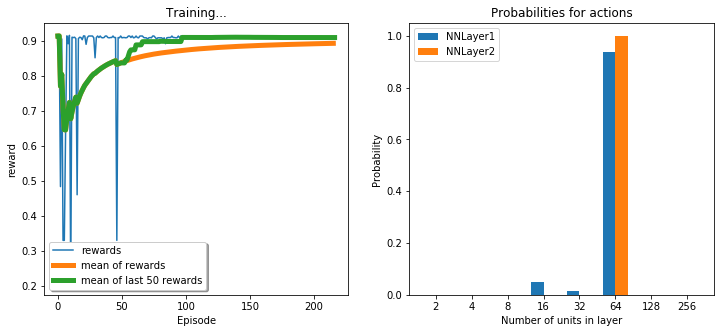

epoch 216 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

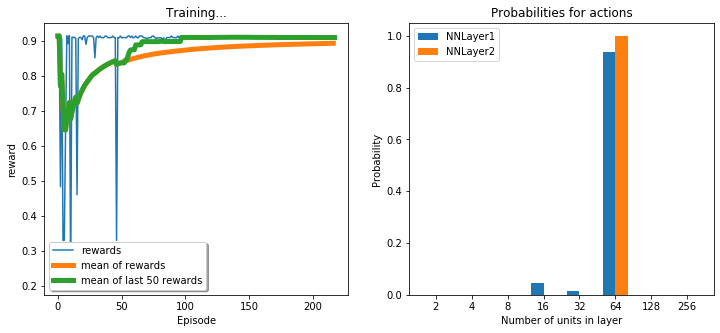

epoch 217 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

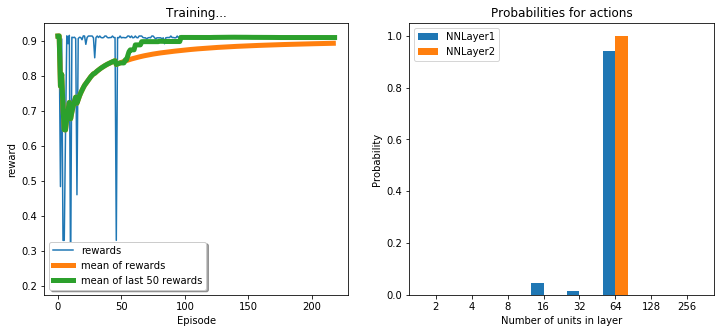

epoch 218 
Network (64, 64) accuracy:0.909, average rewards: 0.892


<Figure size 432x288 with 0 Axes>

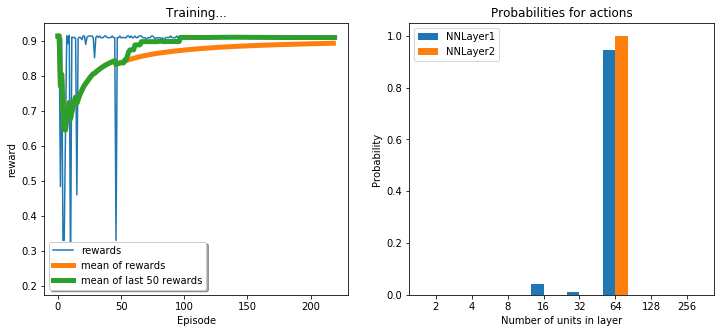

epoch 219 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

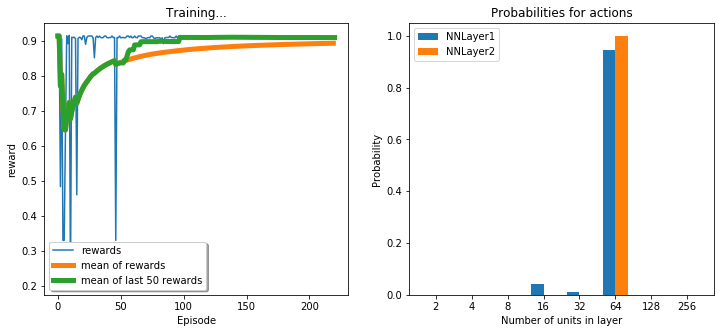

epoch 220 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

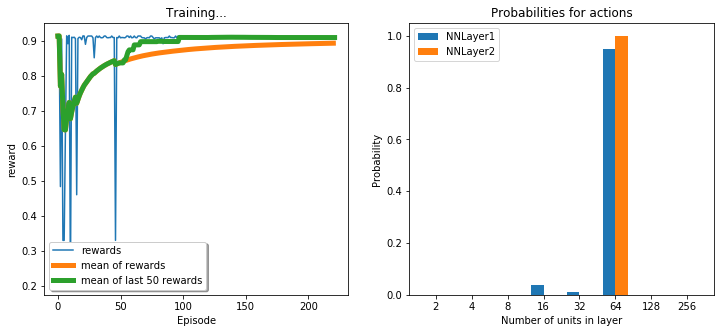

epoch 221 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

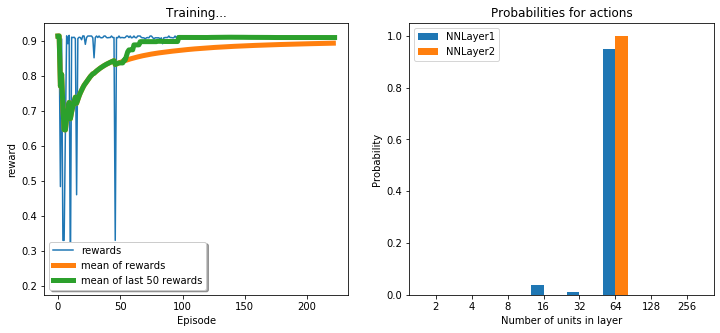

epoch 222 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

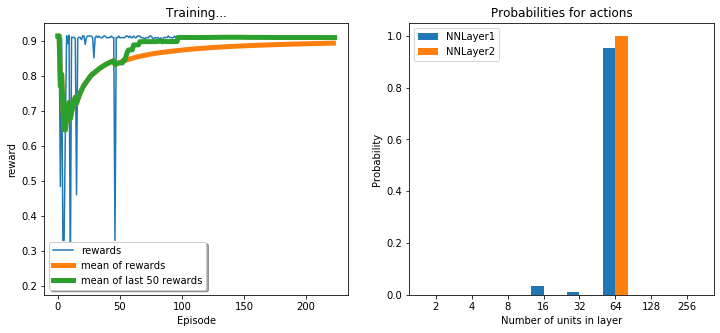

epoch 223 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

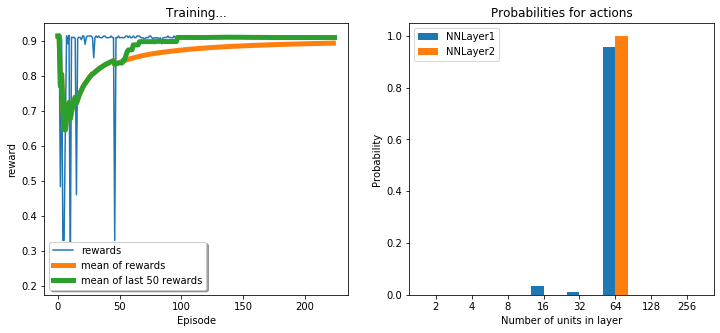

epoch 224 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

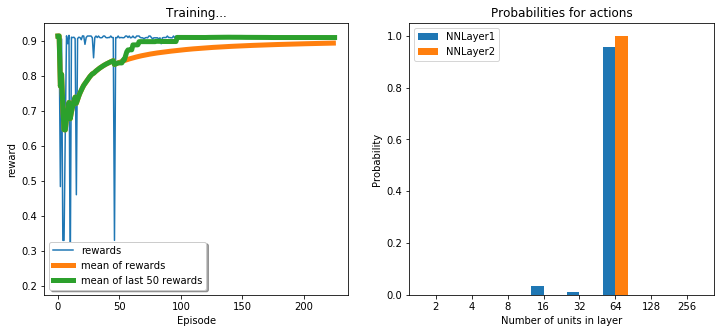

epoch 225 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

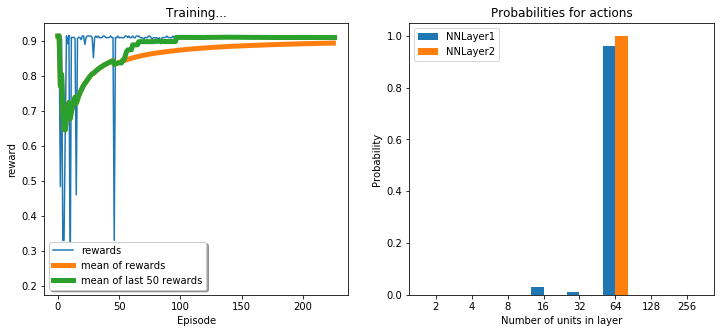

epoch 226 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

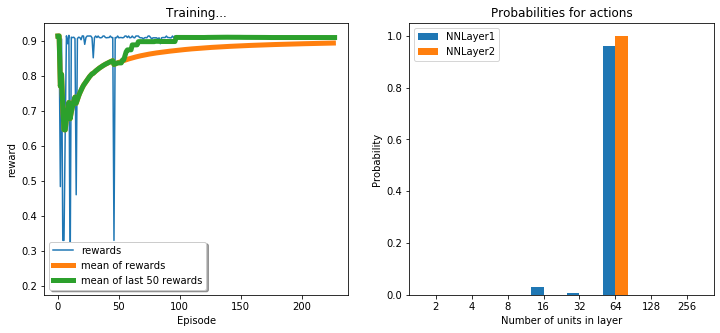

epoch 227 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

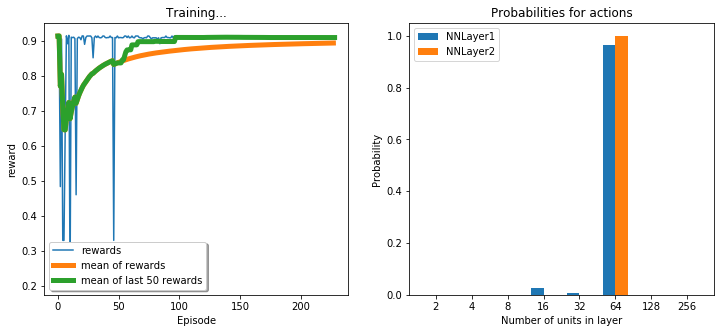

epoch 228 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

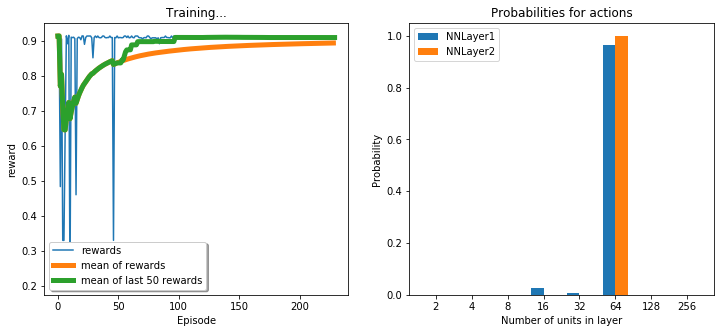

epoch 229 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

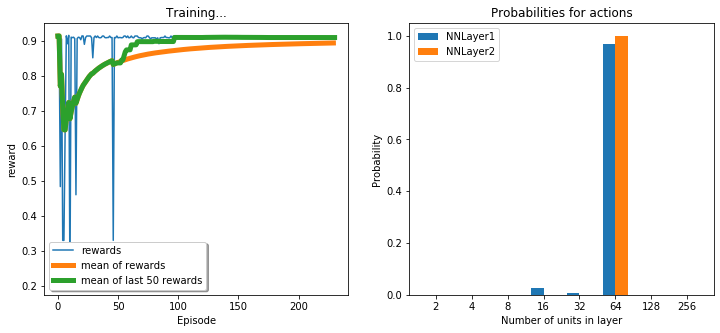

epoch 230 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

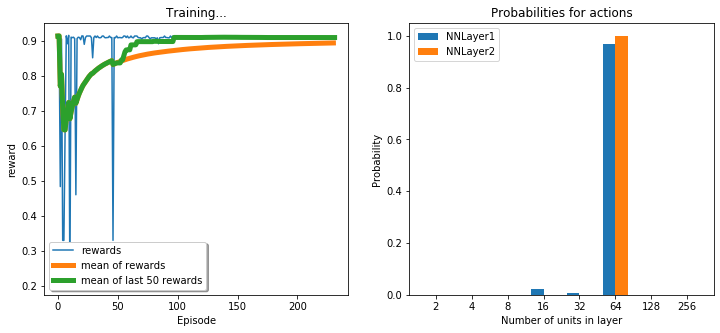

epoch 231 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

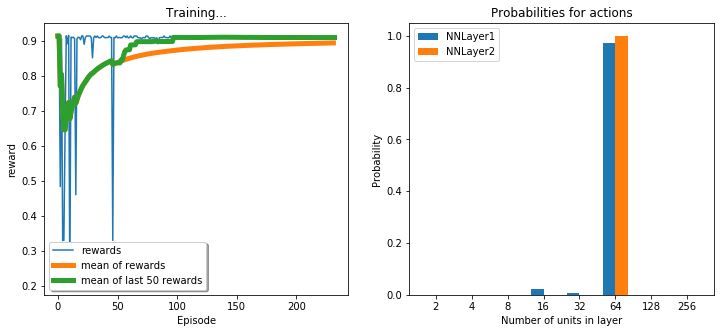

epoch 232 
Network (64, 64) accuracy:0.909, average rewards: 0.893


<Figure size 432x288 with 0 Axes>

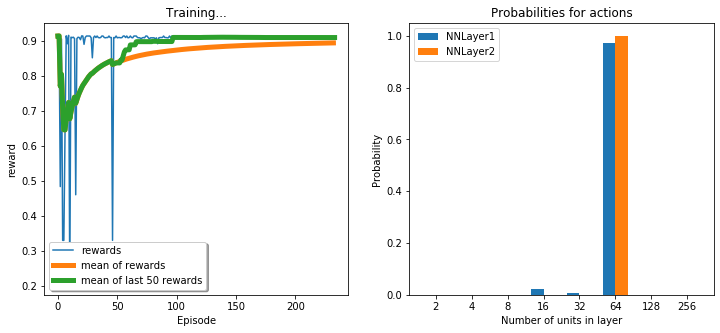

epoch 233 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

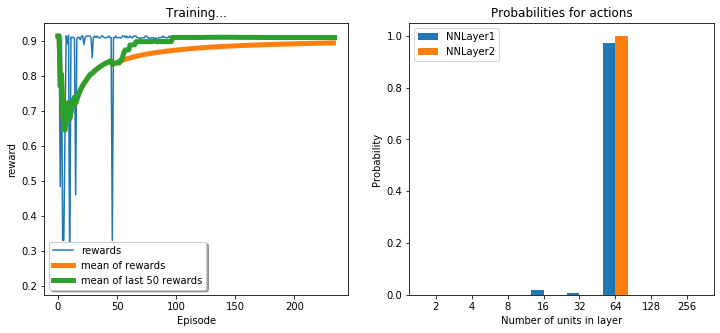

epoch 234 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

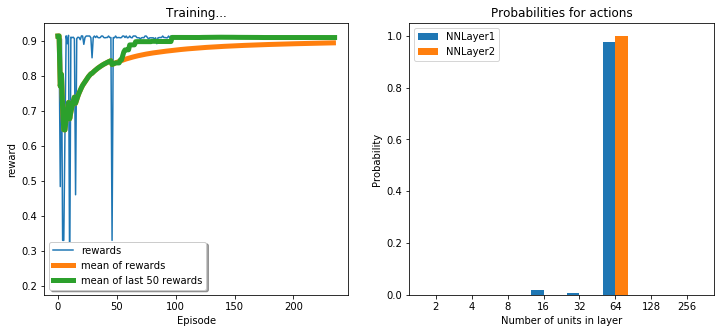

epoch 235 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

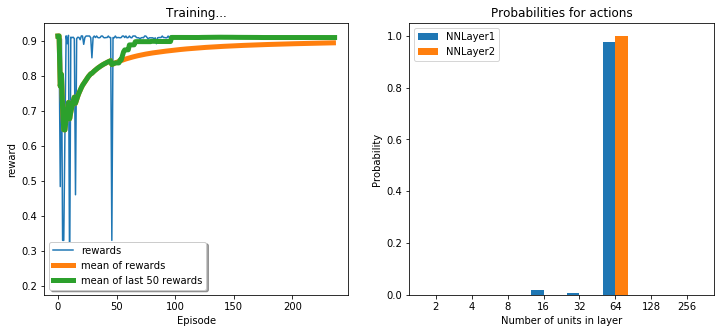

epoch 236 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

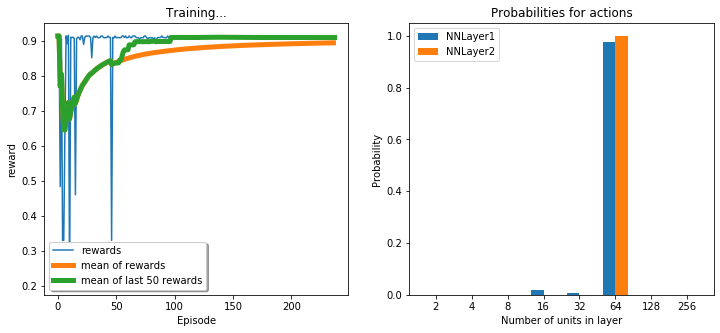

epoch 237 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

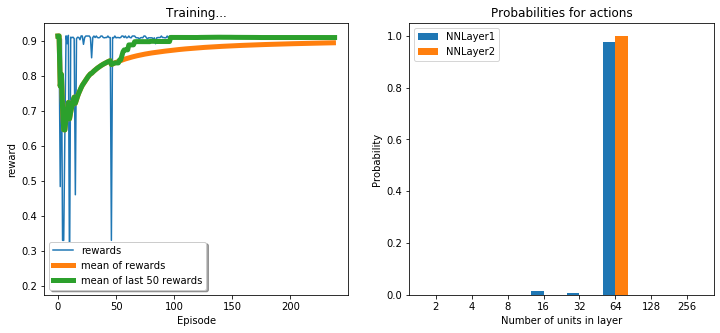

epoch 238 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

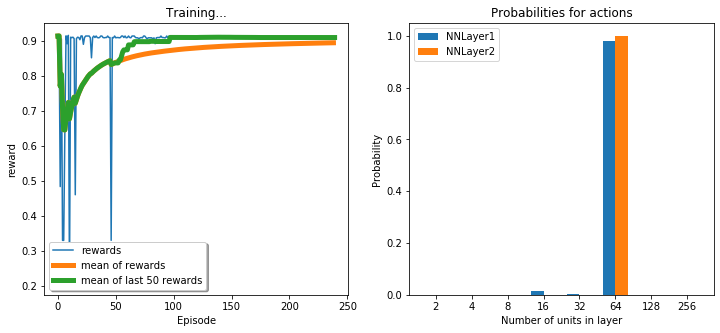

epoch 239 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

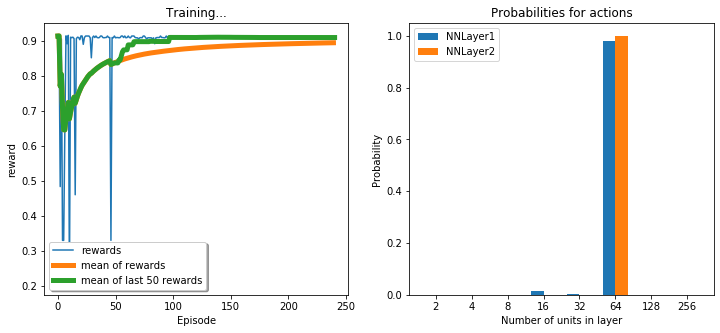

epoch 240 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

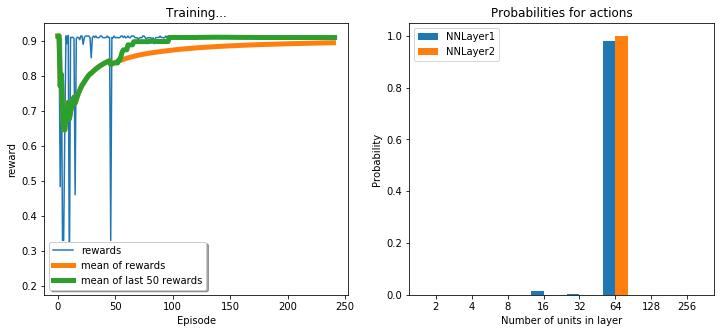

epoch 241 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

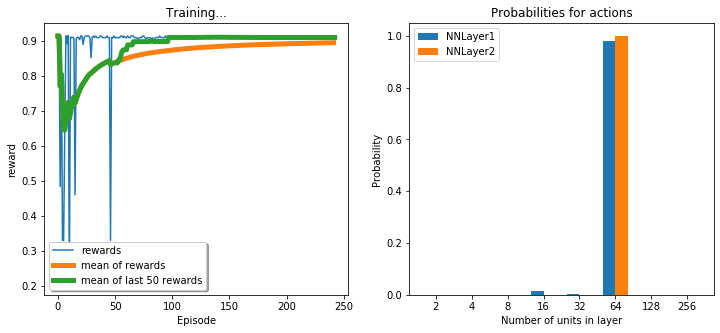

epoch 242 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

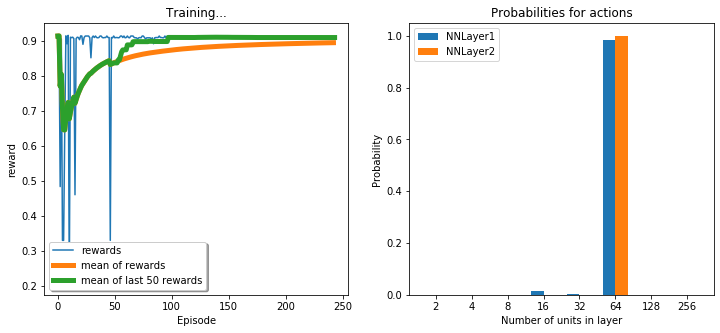

epoch 243 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

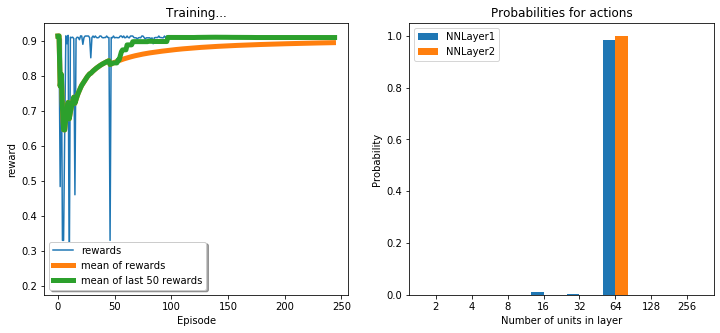

epoch 244 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

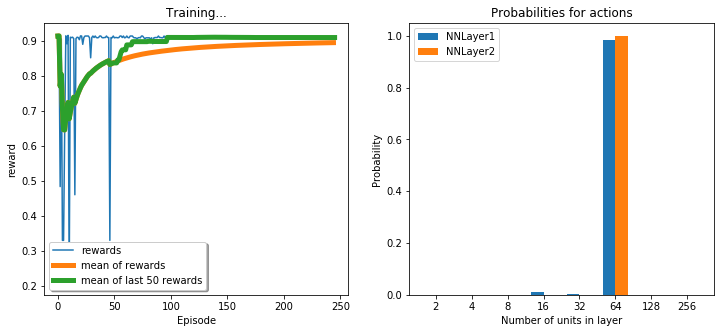

epoch 245 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

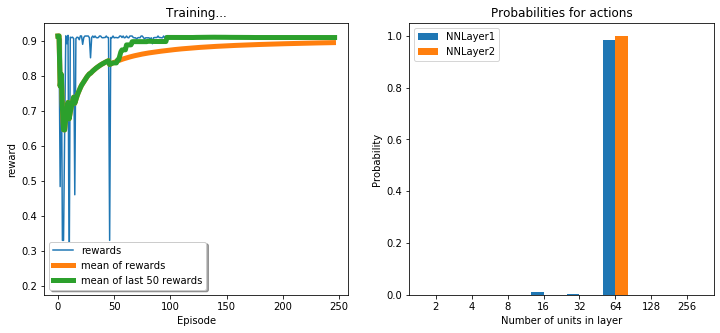

epoch 246 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

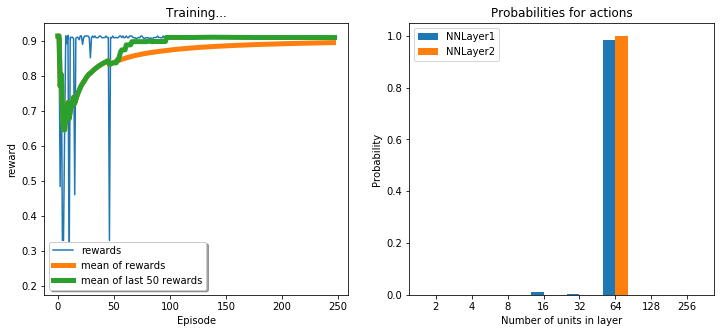

epoch 247 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

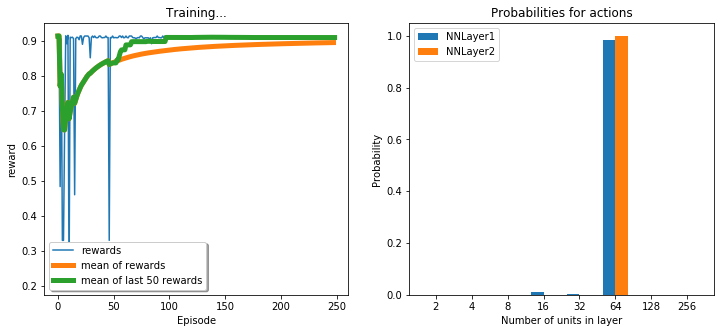

epoch 248 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

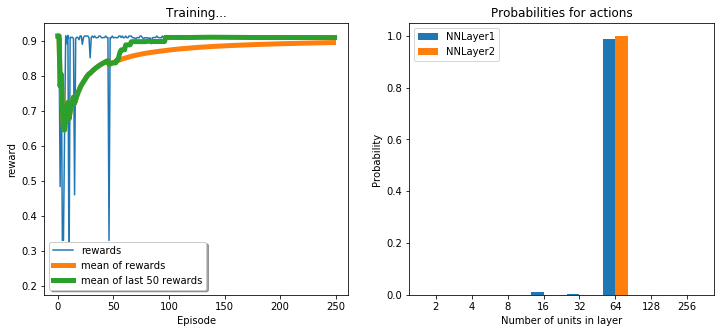

epoch 249 
Network (64, 64) accuracy:0.909, average rewards: 0.894


<Figure size 432x288 with 0 Axes>

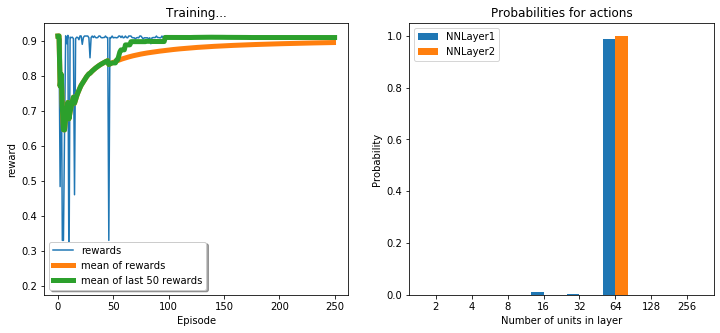

epoch 250 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

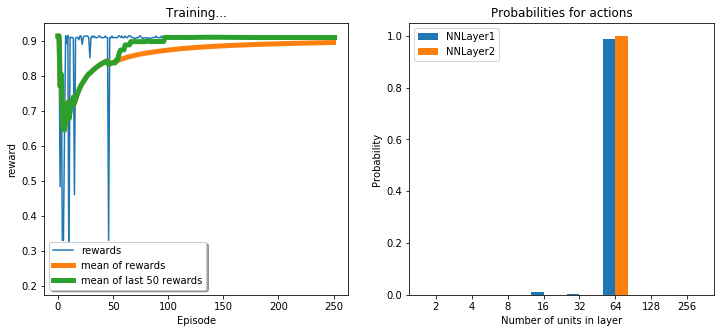

epoch 251 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

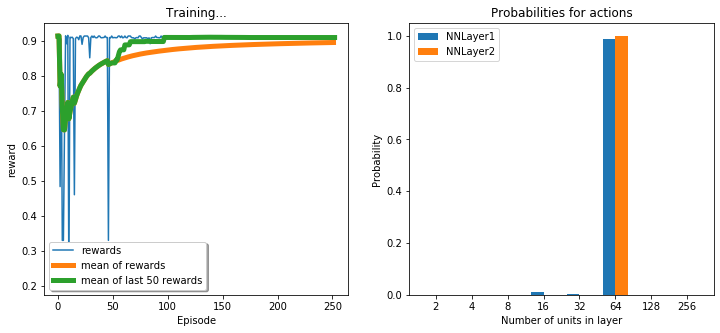

epoch 252 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

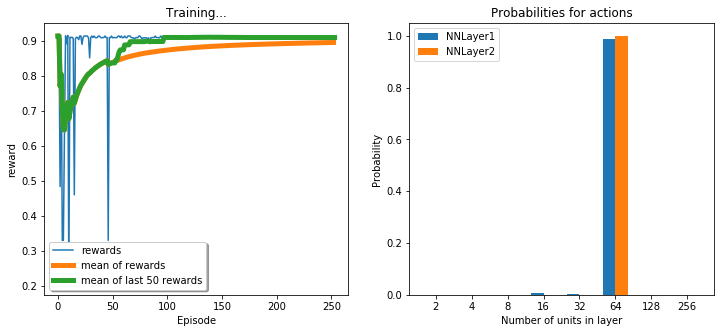

epoch 253 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

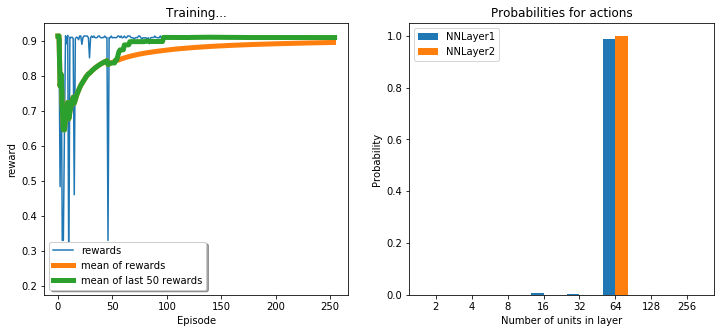

epoch 254 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

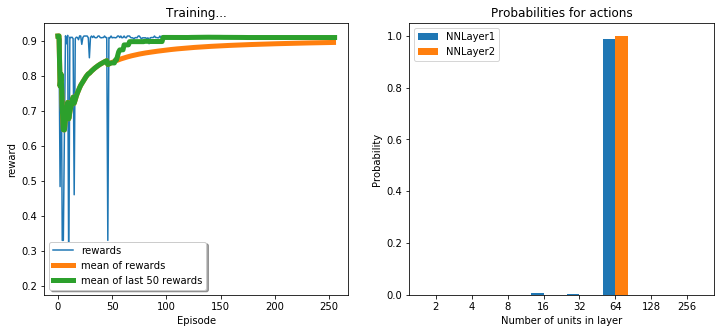

epoch 255 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

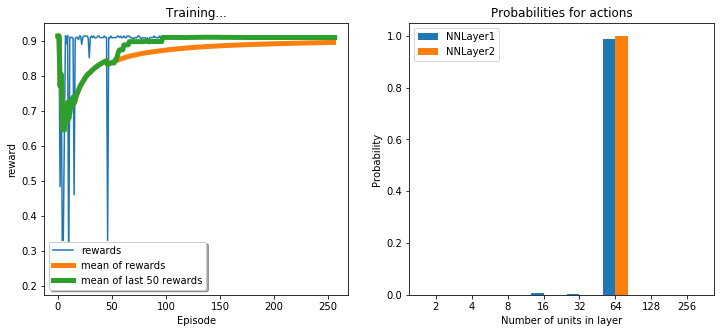

epoch 256 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

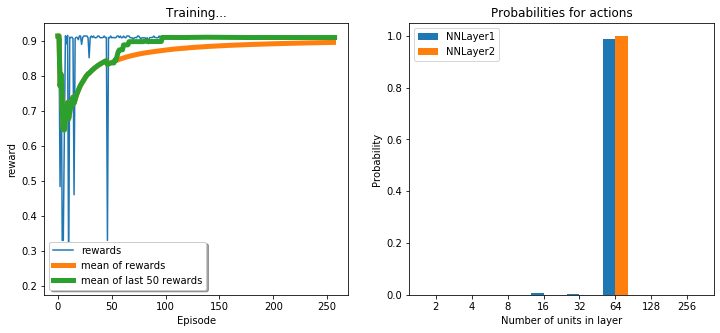

epoch 257 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

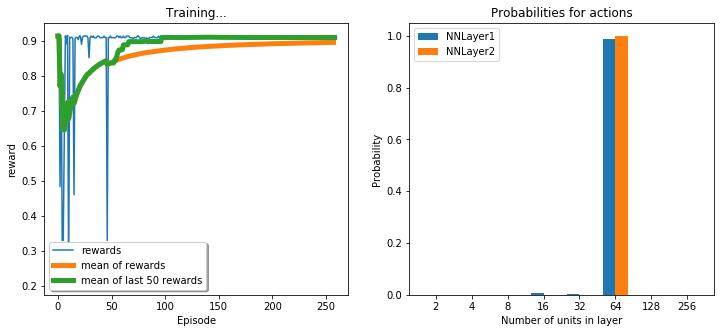

epoch 258 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

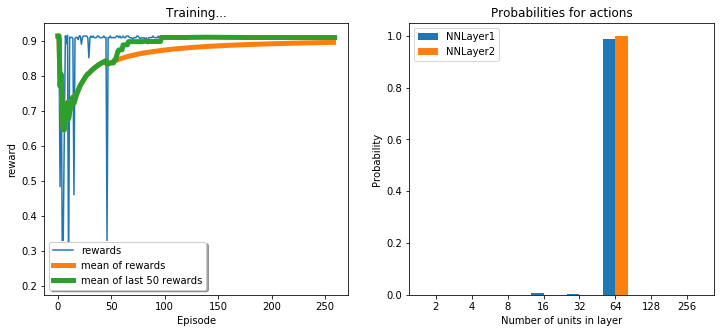

epoch 259 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

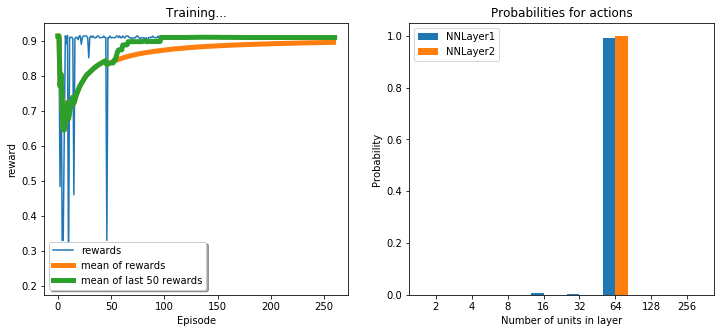

epoch 260 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

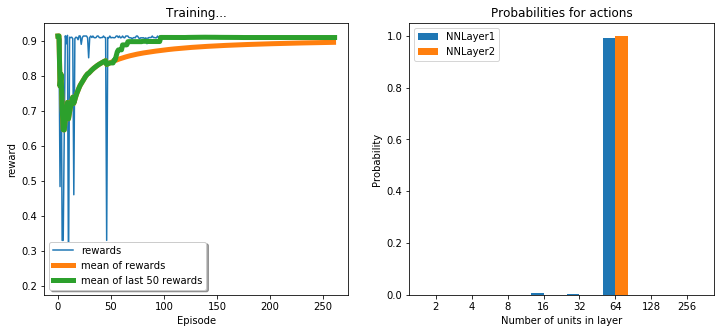

epoch 261 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

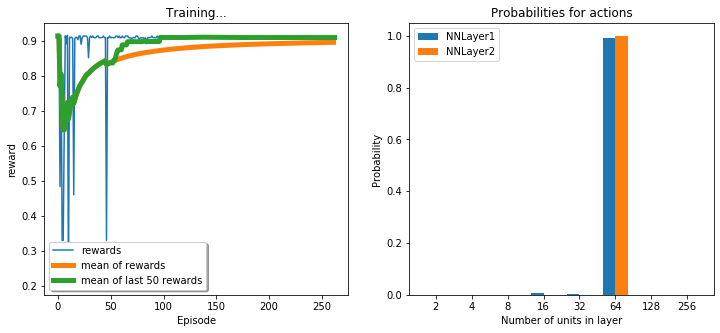

epoch 262 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

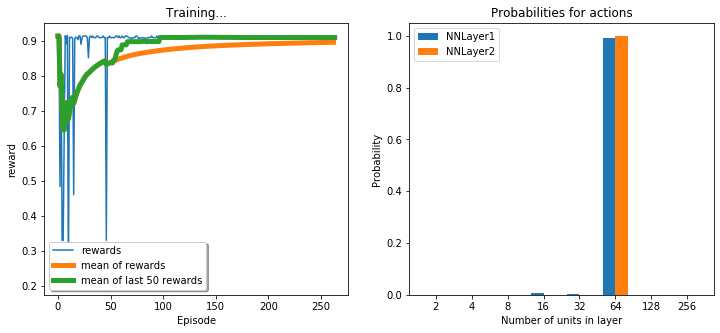

epoch 263 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

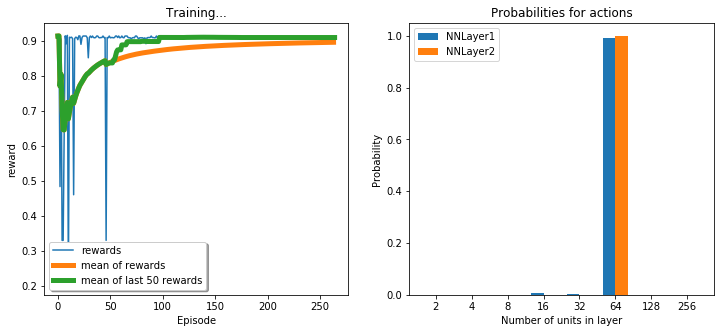

epoch 264 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

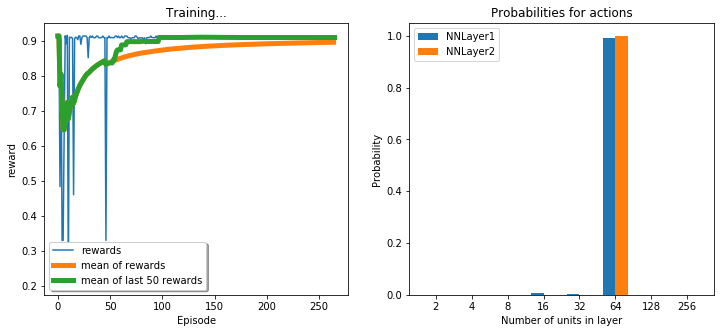

epoch 265 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

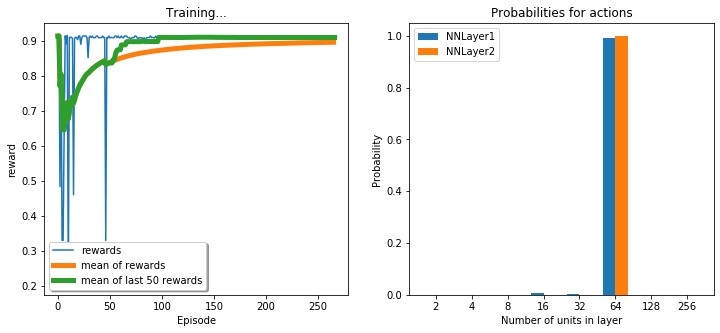

epoch 266 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

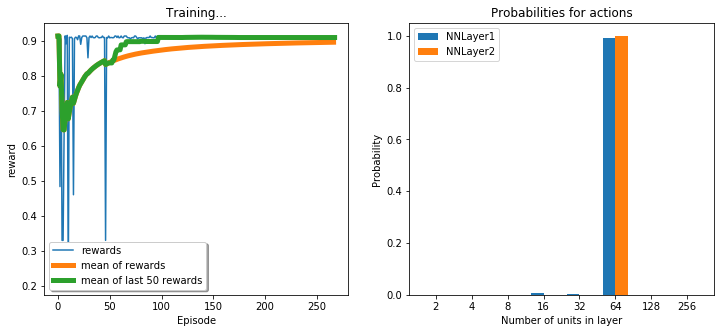

epoch 267 
Network (64, 64) accuracy:0.909, average rewards: 0.895


<Figure size 432x288 with 0 Axes>

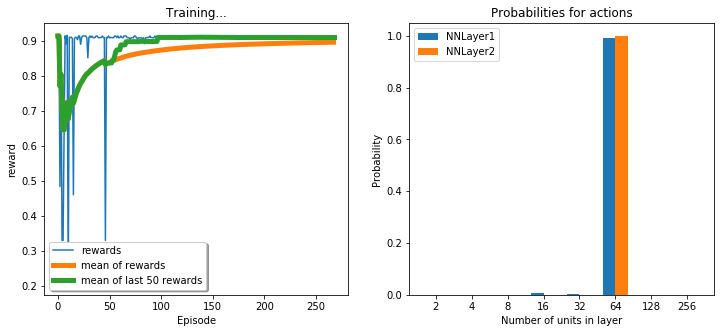

epoch 268 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

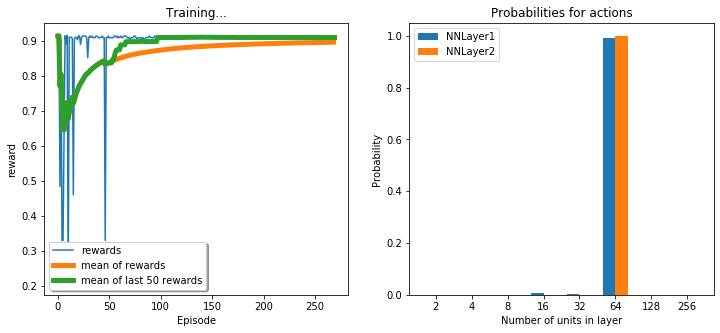

epoch 269 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

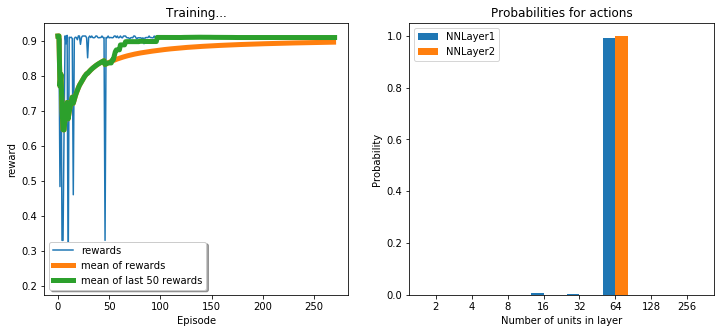

epoch 270 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

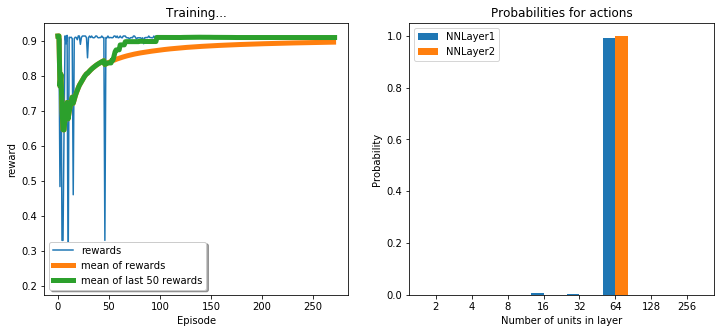

epoch 271 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

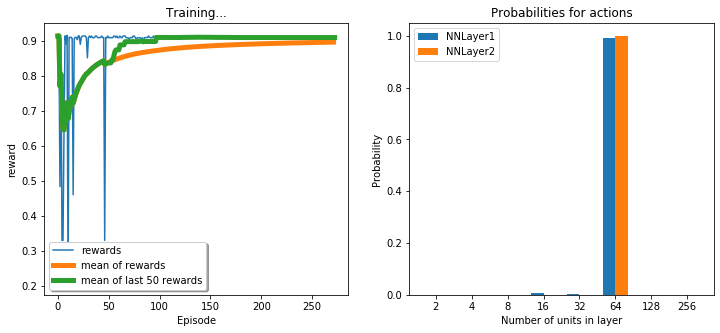

epoch 272 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

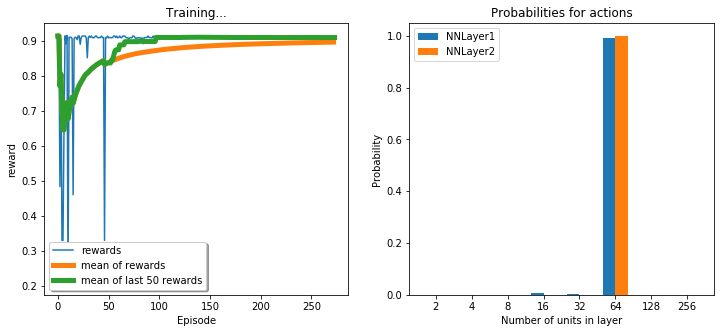

epoch 273 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

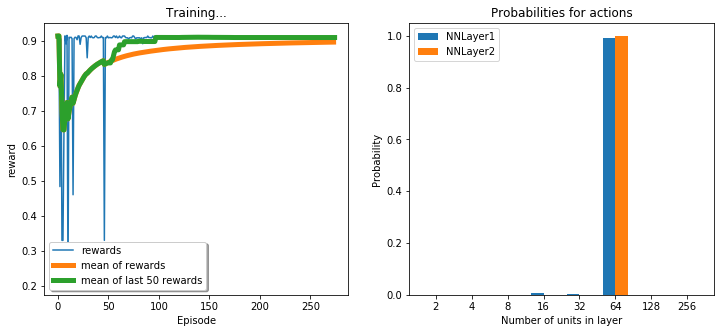

epoch 274 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

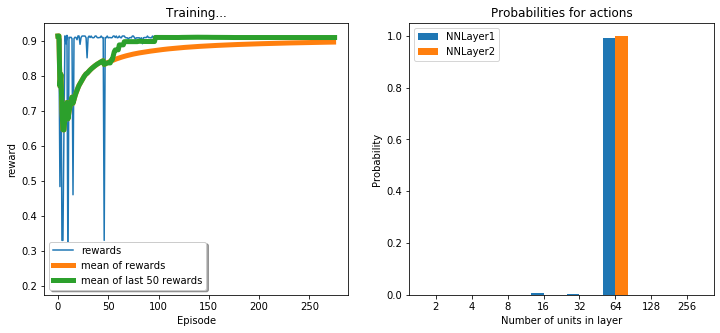

epoch 275 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

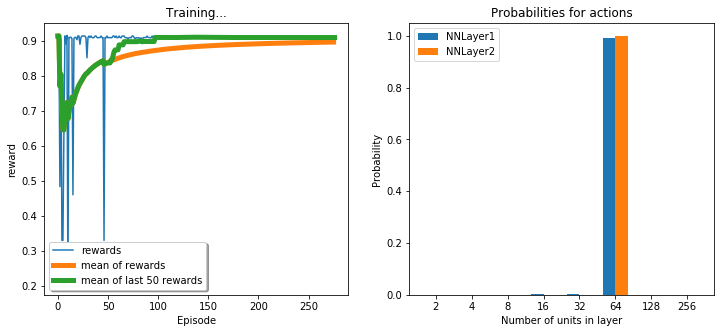

epoch 276 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

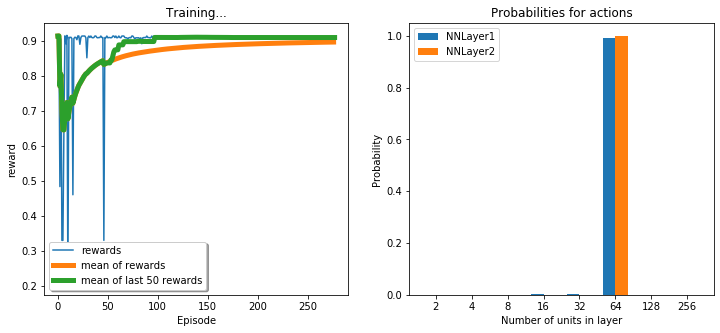

epoch 277 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

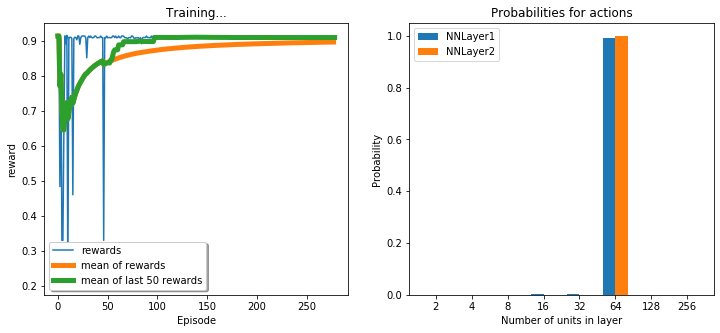

epoch 278 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

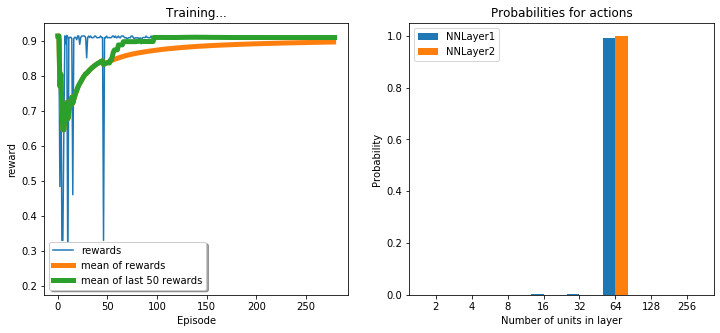

epoch 279 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

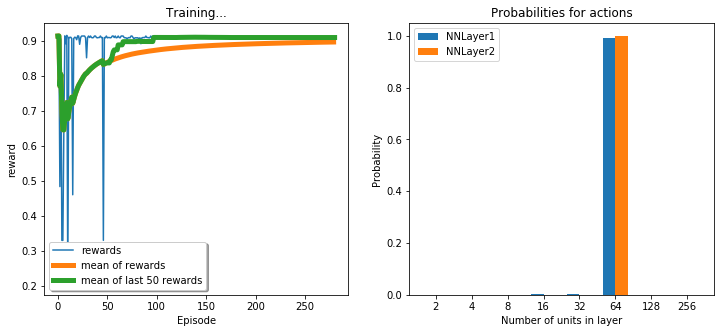

epoch 280 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

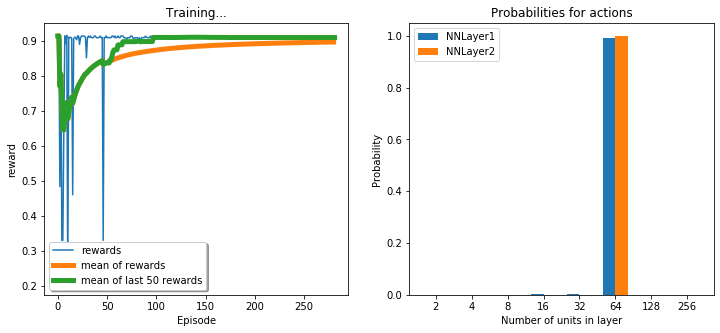

epoch 281 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

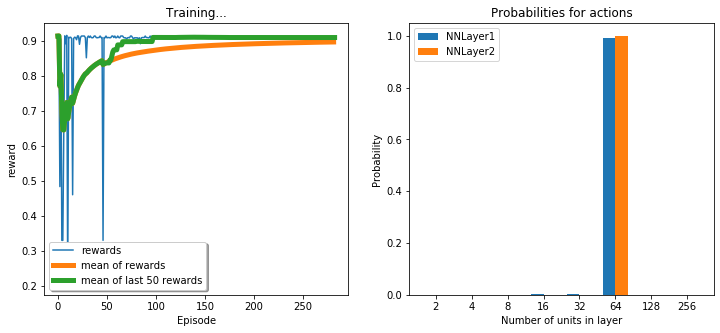

epoch 282 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

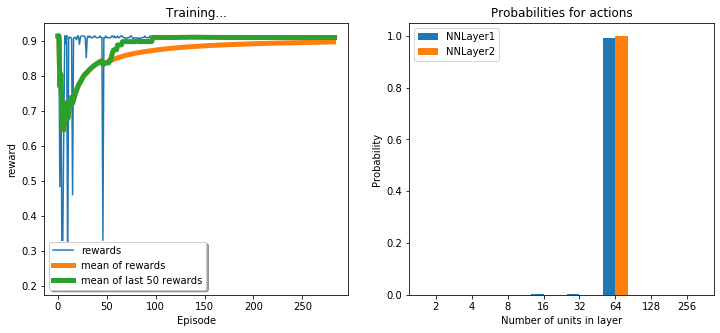

epoch 283 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

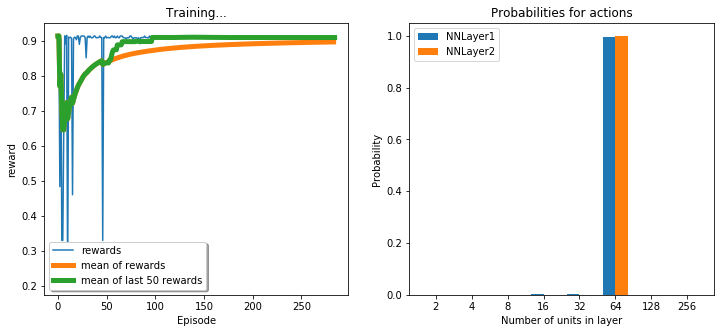

epoch 284 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

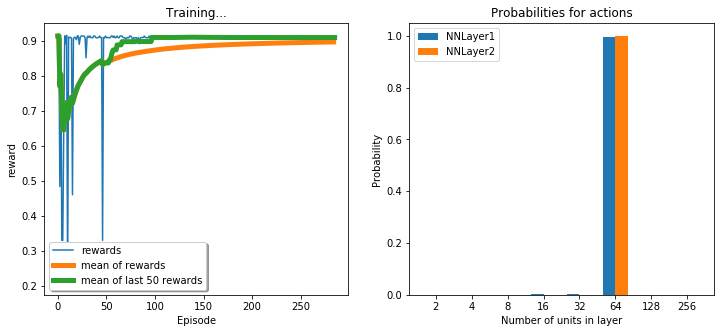

epoch 285 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

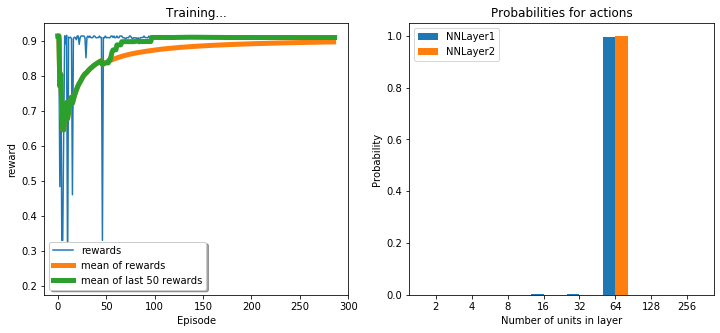

epoch 286 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

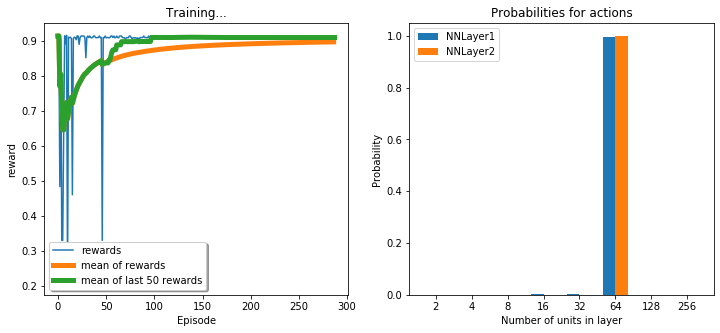

epoch 287 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

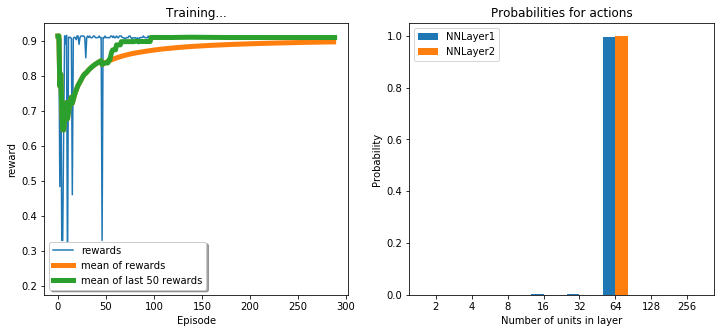

epoch 288 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

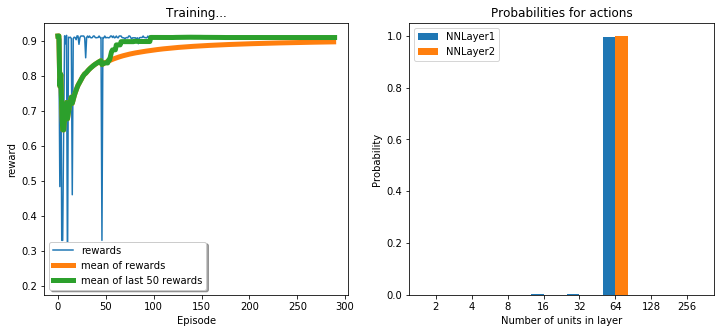

epoch 289 
Network (64, 64) accuracy:0.909, average rewards: 0.896


<Figure size 432x288 with 0 Axes>

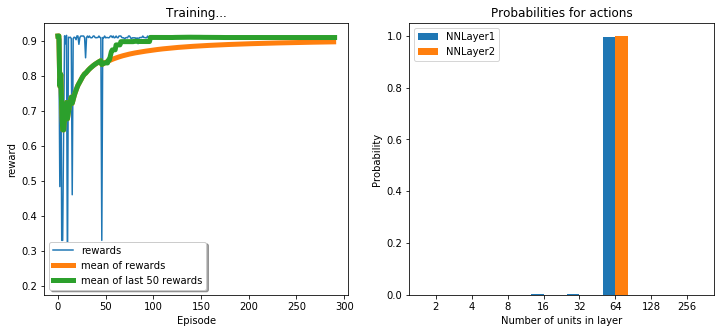

epoch 290 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

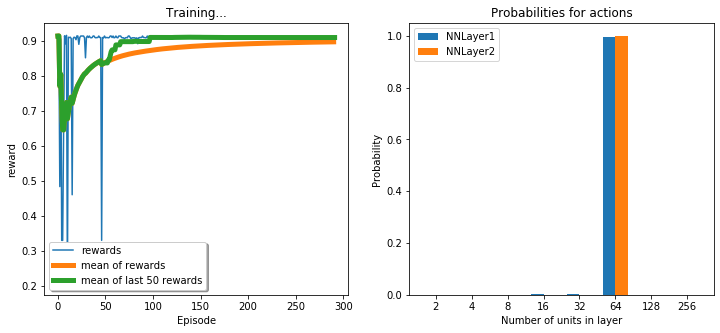

epoch 291 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

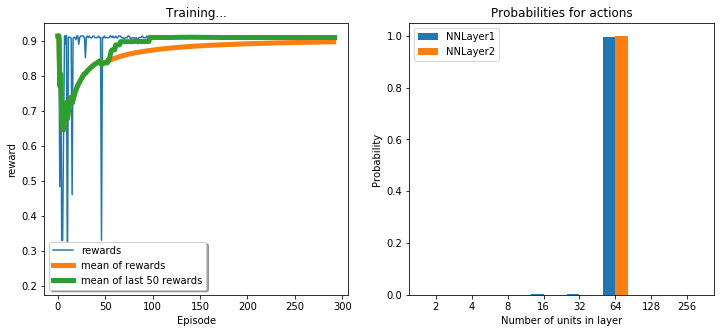

epoch 292 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

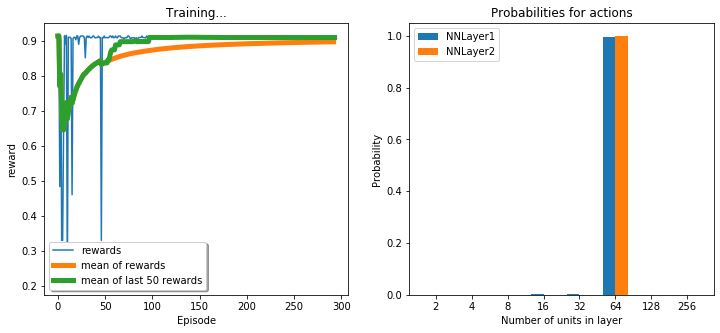

epoch 293 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

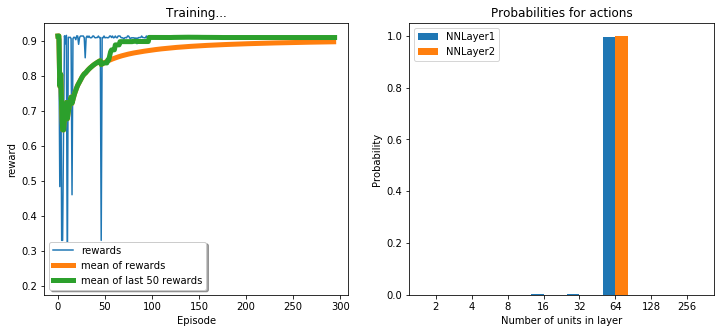

epoch 294 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

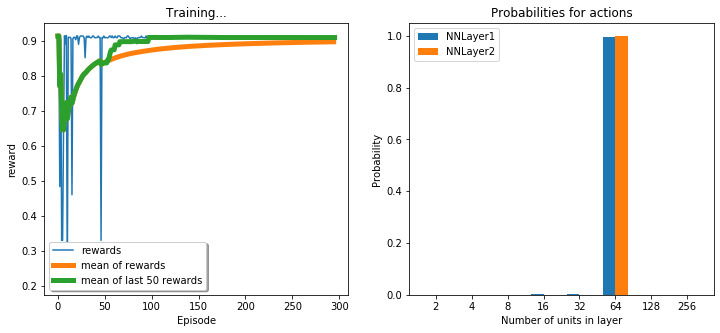

epoch 295 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

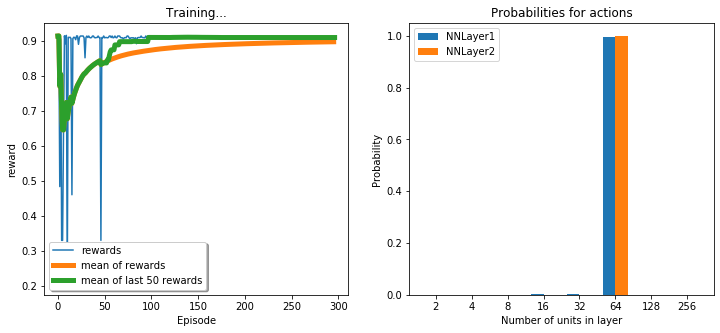

epoch 296 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

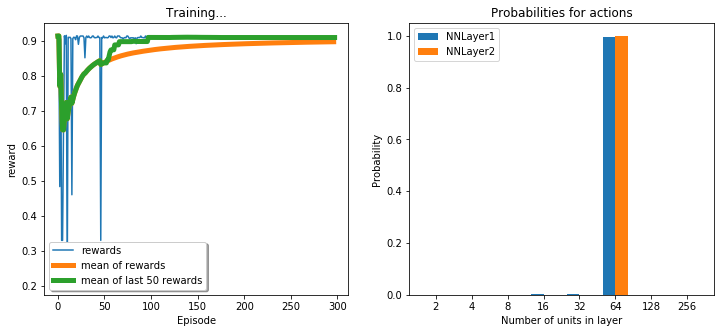

epoch 297 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

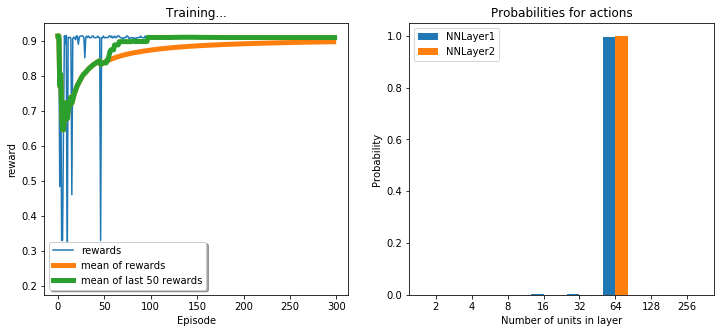

epoch 298 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

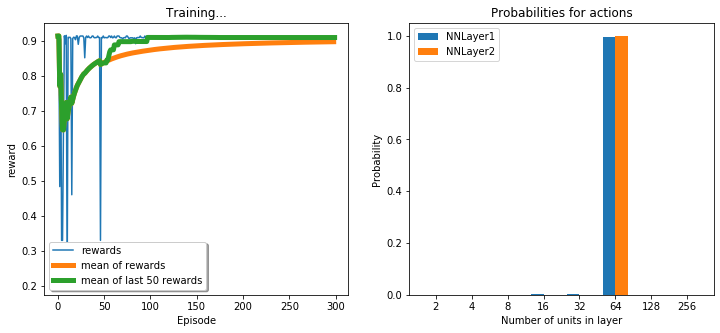

epoch 299 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

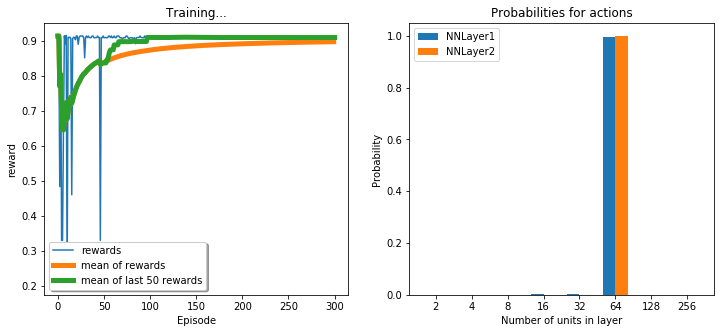

epoch 300 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

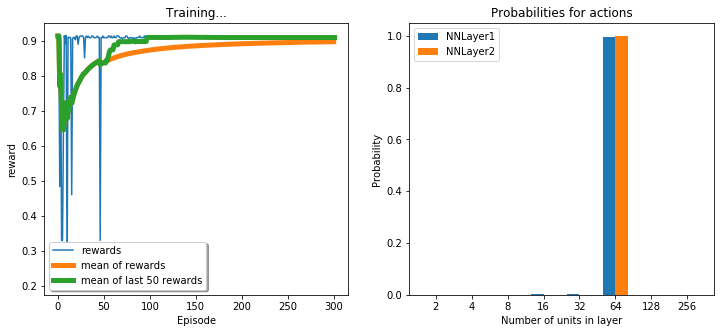

epoch 301 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

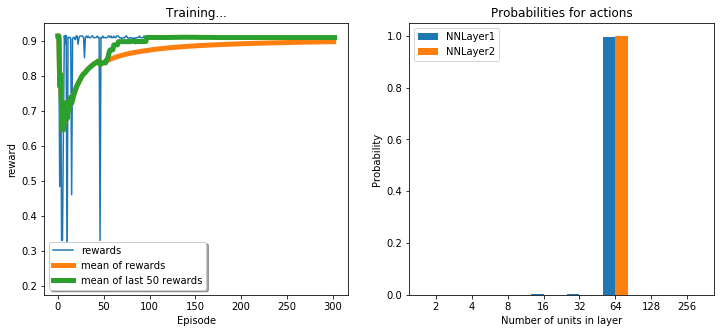

epoch 302 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

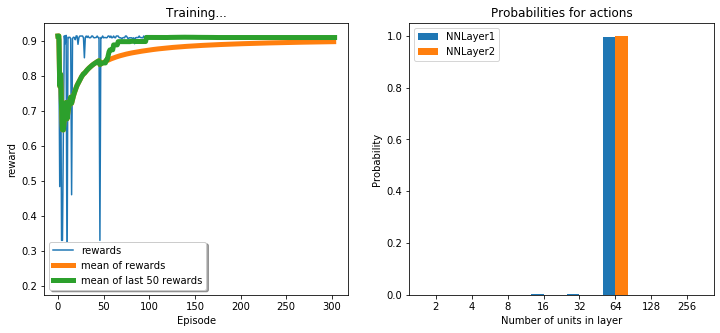

epoch 303 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

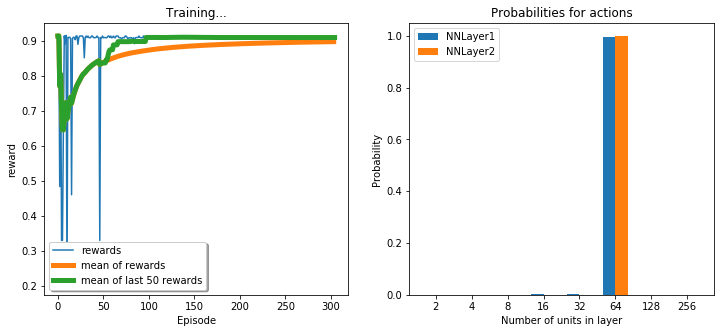

epoch 304 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

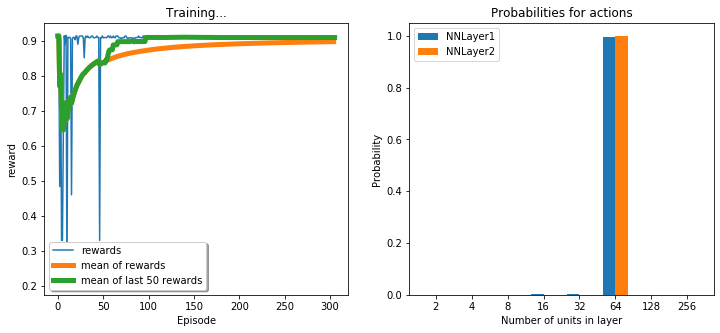

epoch 305 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

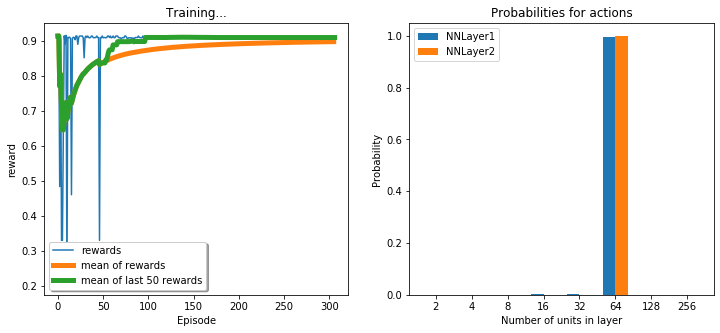

epoch 306 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

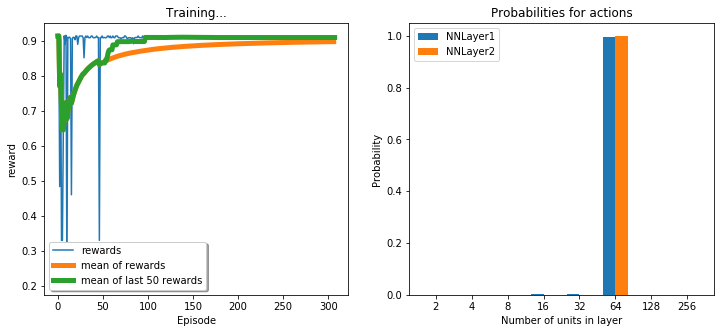

epoch 307 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

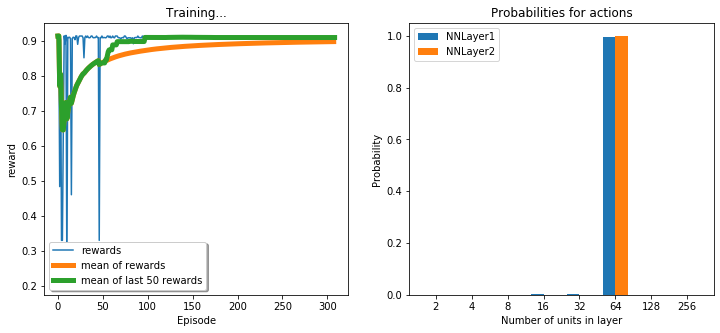

epoch 308 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

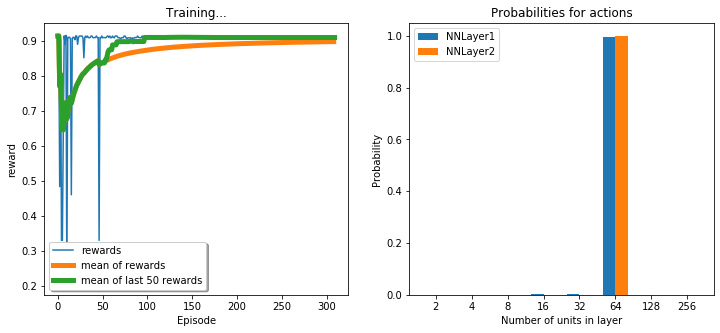

epoch 309 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

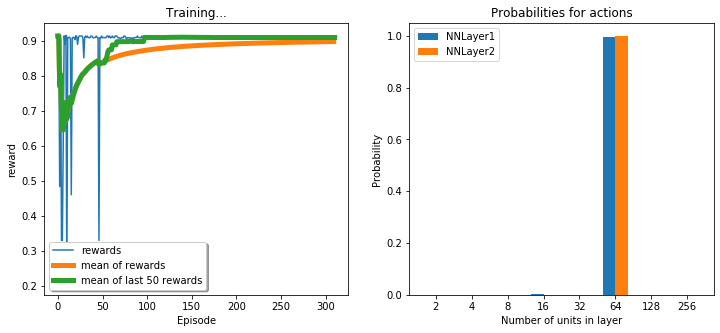

epoch 310 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

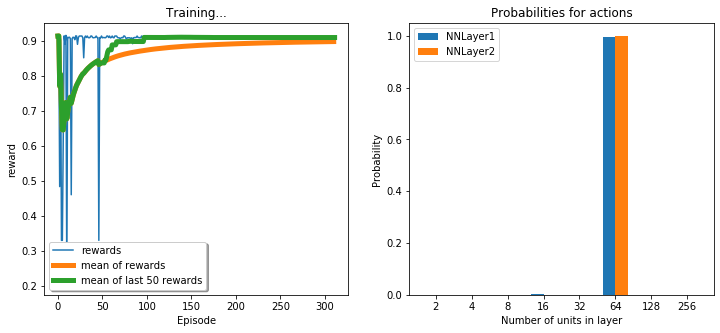

epoch 311 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

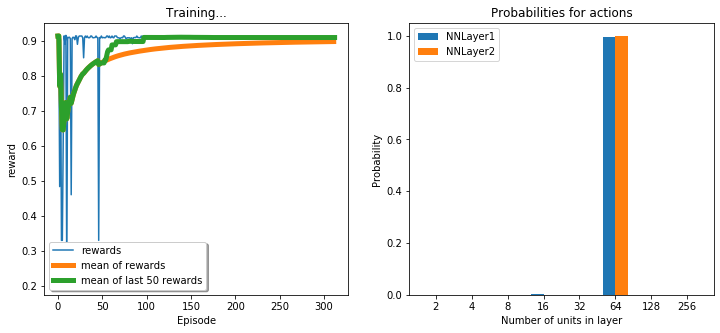

epoch 312 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

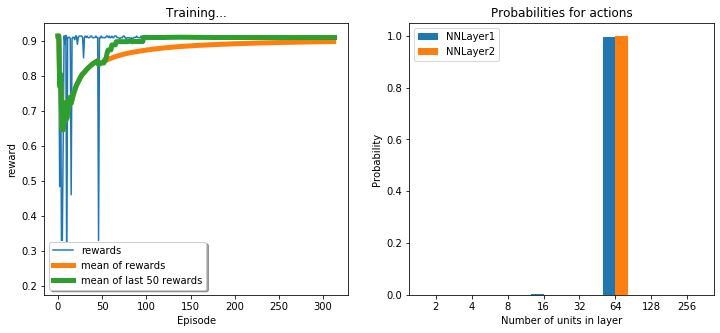

epoch 313 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

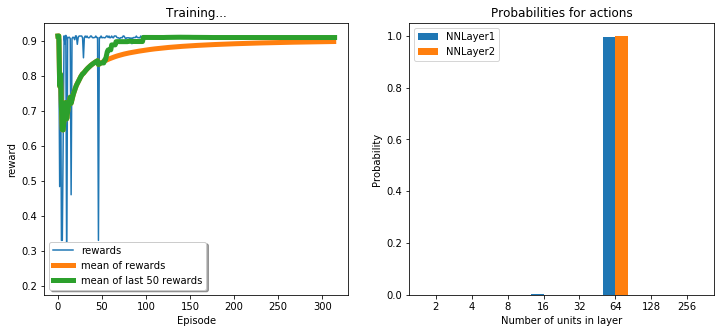

epoch 314 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

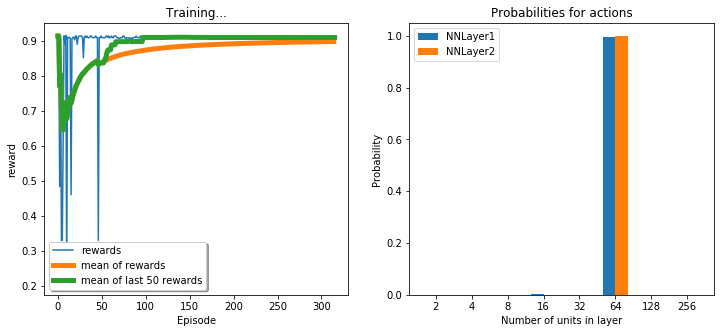

epoch 315 
Network (64, 64) accuracy:0.909, average rewards: 0.897


<Figure size 432x288 with 0 Axes>

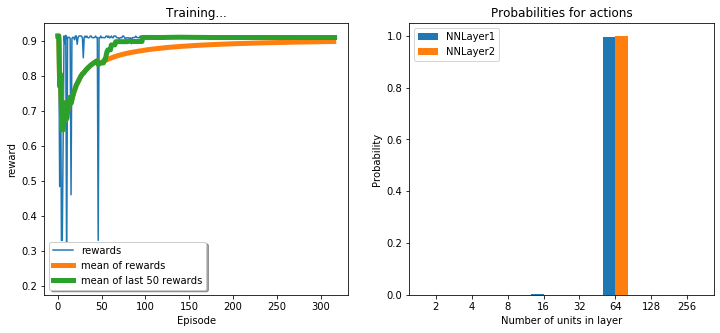

epoch 316 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

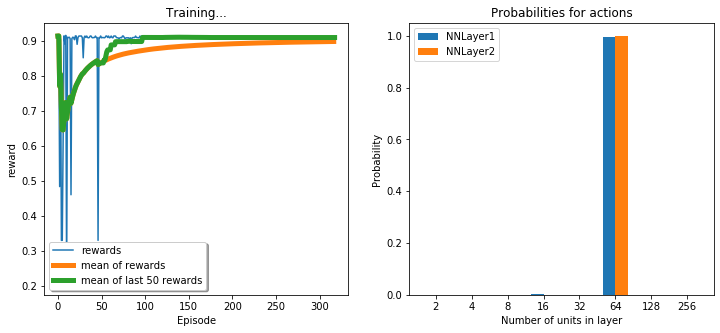

epoch 317 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

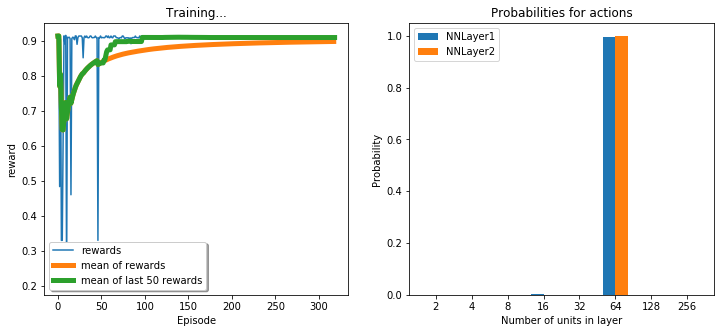

epoch 318 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

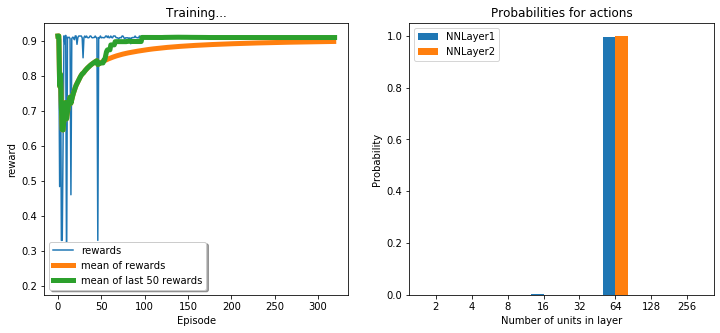

epoch 319 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

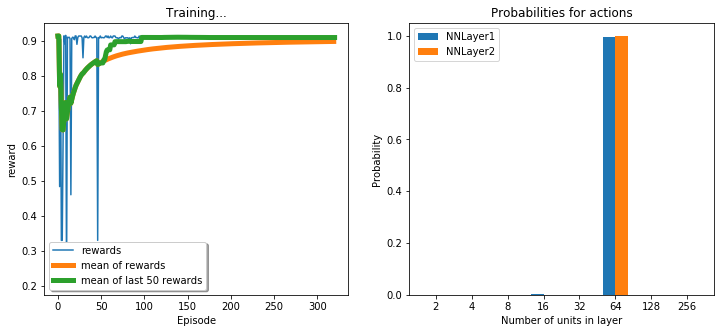

epoch 320 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

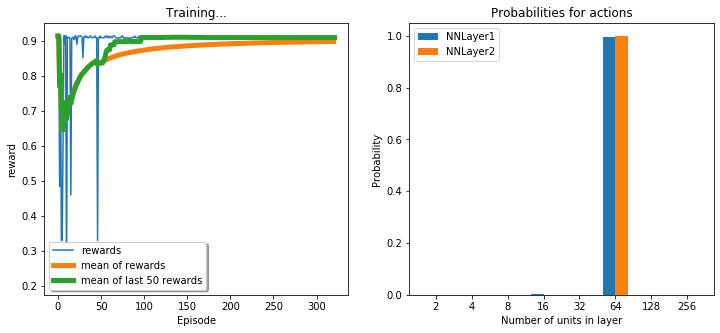

epoch 321 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

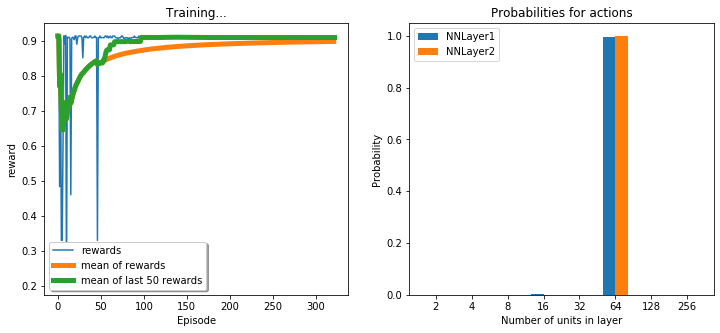

epoch 322 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

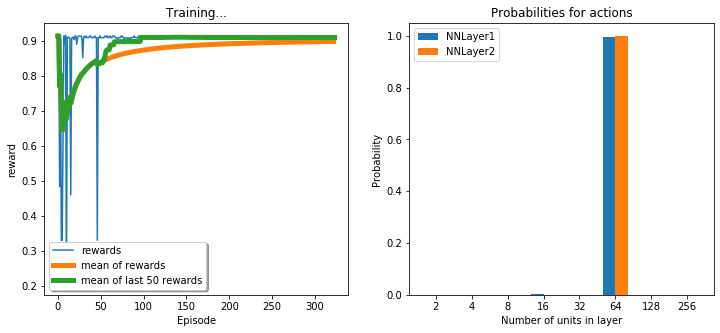

epoch 323 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

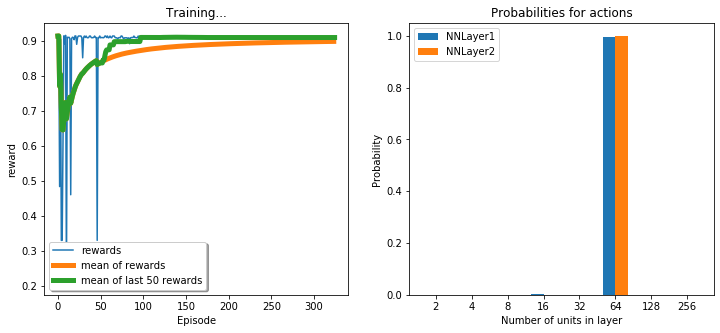

epoch 324 
Network (16, 64) accuracy:0.908, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

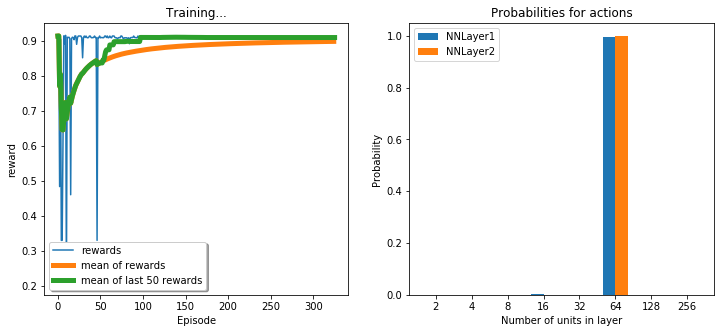

epoch 325 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

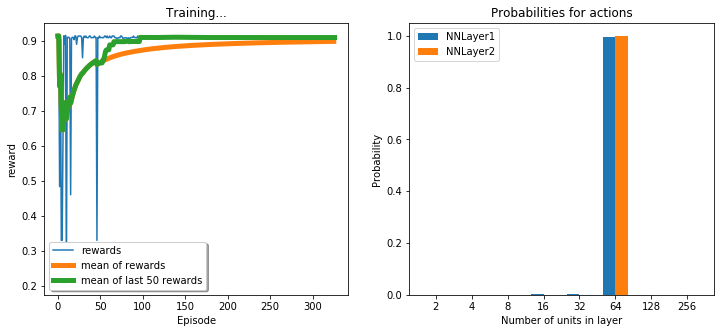

epoch 326 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

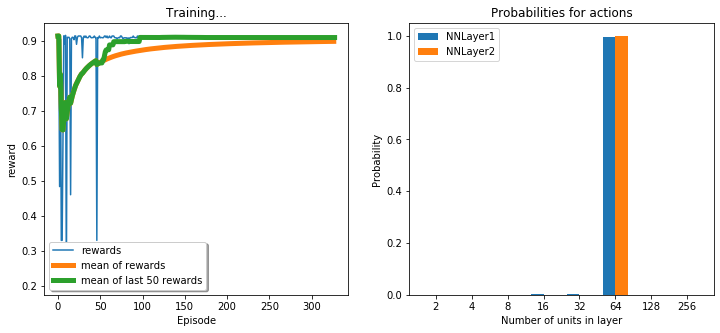

epoch 327 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

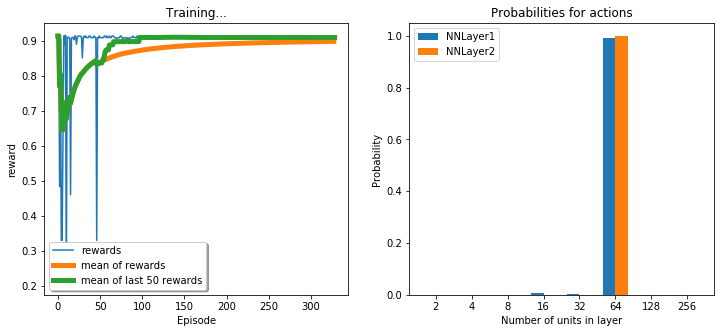

epoch 328 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

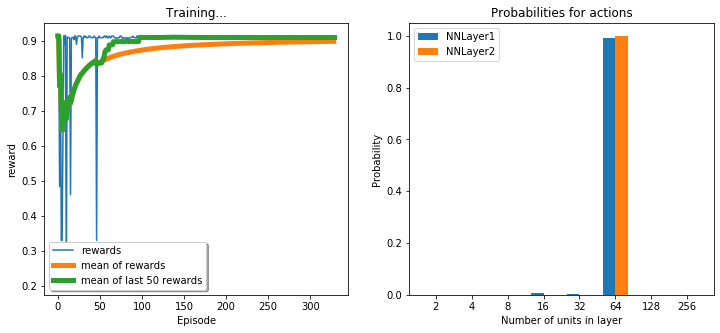

epoch 329 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

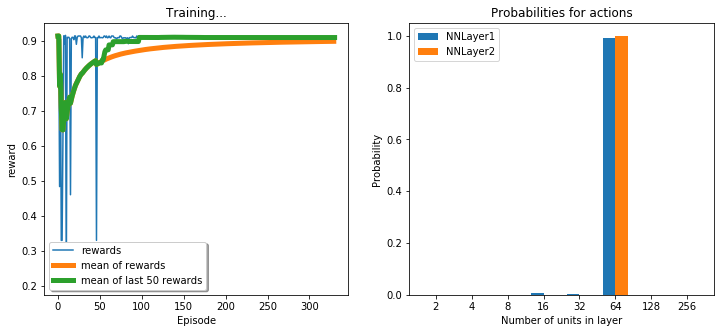

epoch 330 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

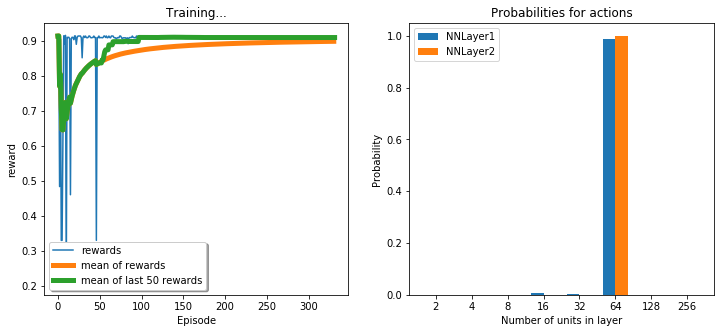

epoch 331 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

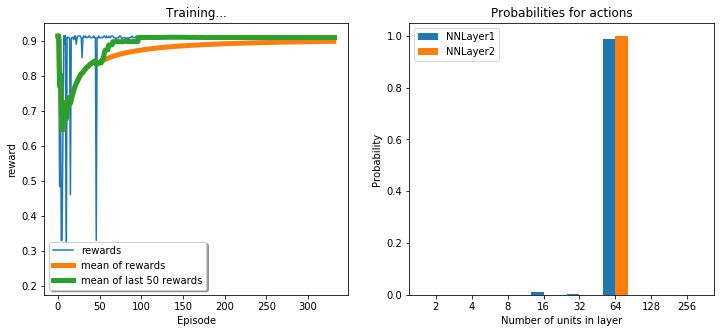

epoch 332 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

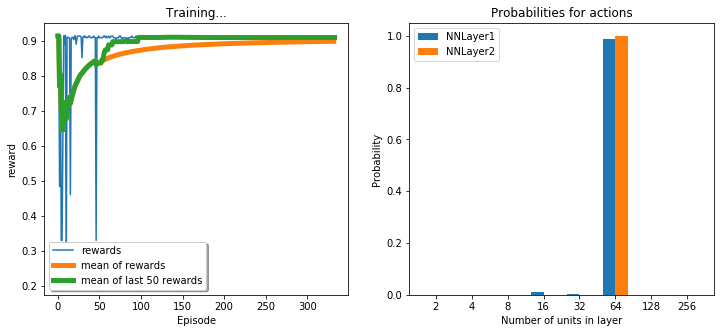

epoch 333 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

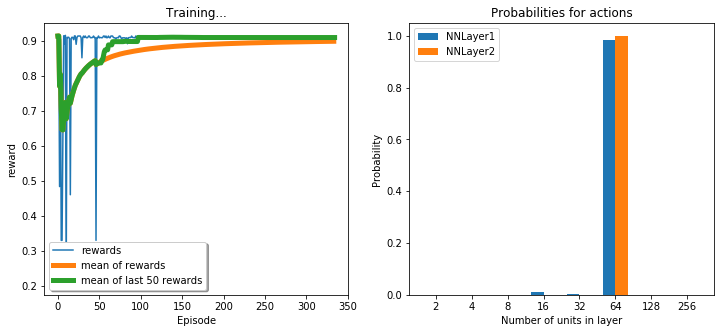

epoch 334 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

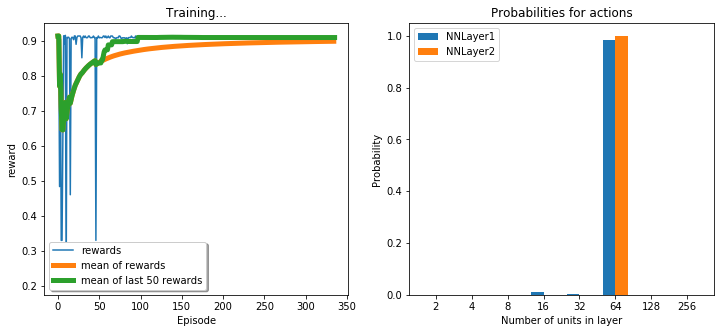

epoch 335 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

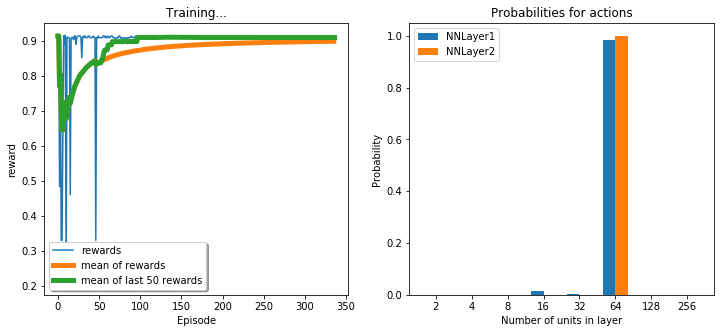

epoch 336 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

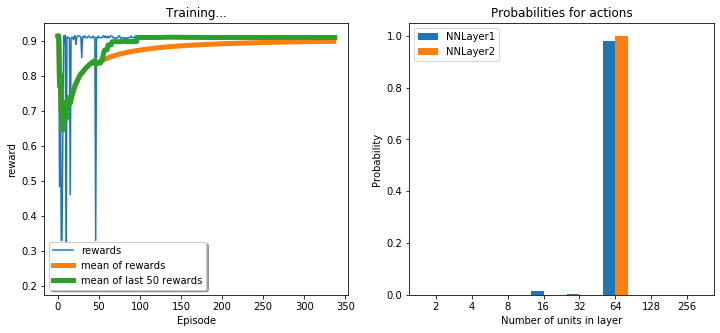

epoch 337 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

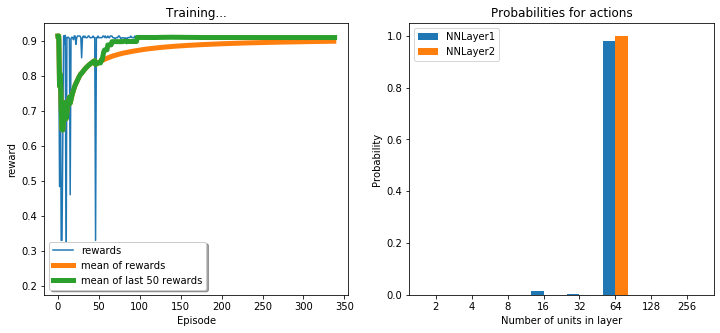

epoch 338 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

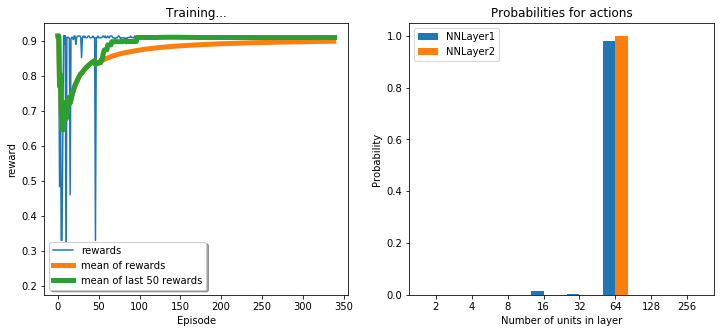

epoch 339 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

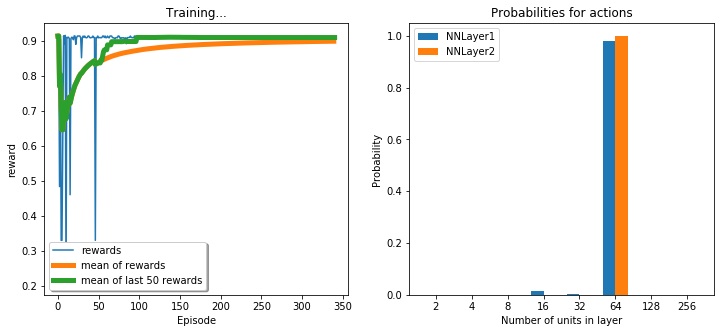

epoch 340 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

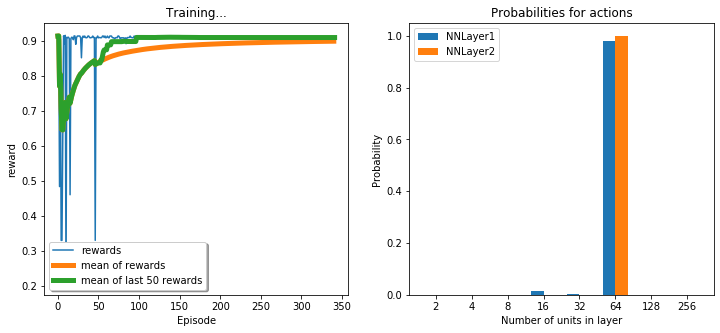

epoch 341 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

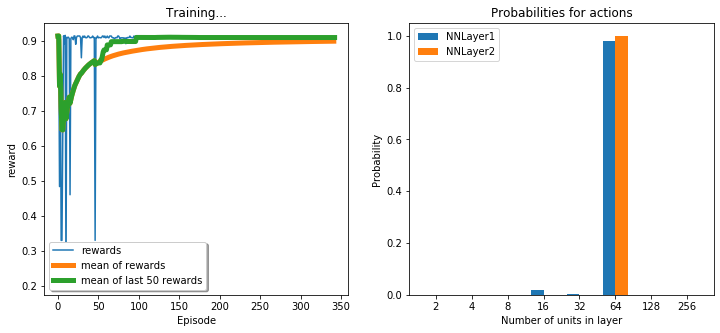

epoch 342 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

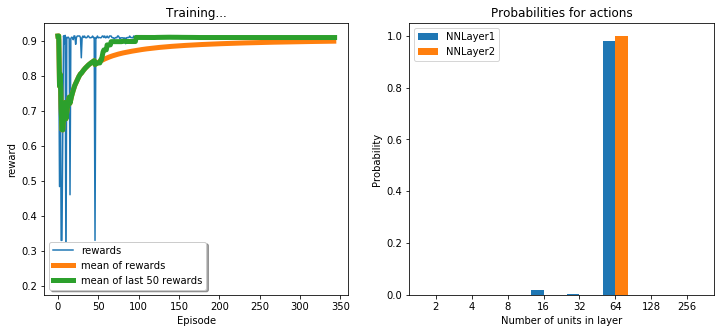

epoch 343 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

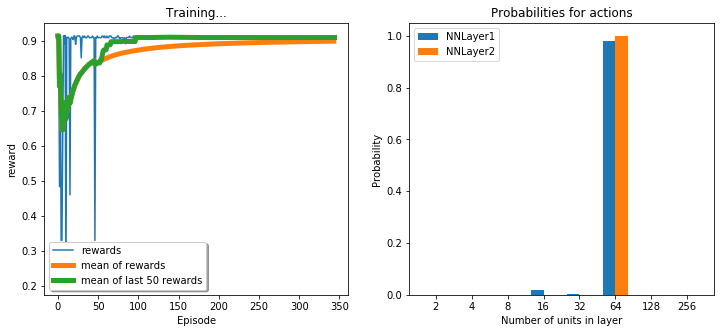

epoch 344 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

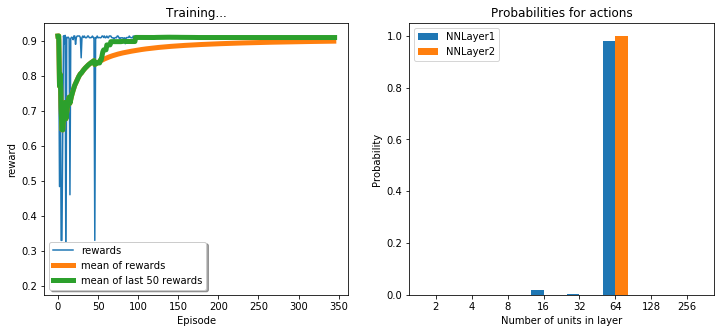

epoch 345 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

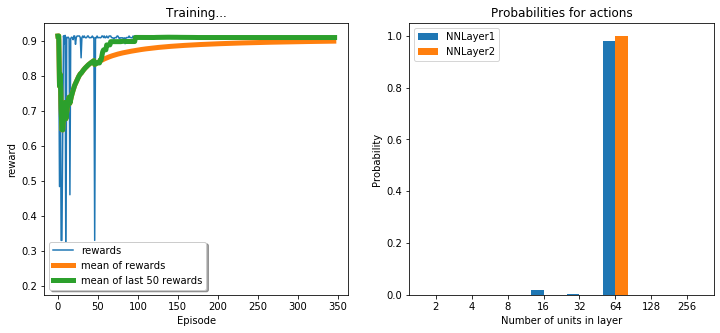

epoch 346 
Network (64, 64) accuracy:0.909, average rewards: 0.898


<Figure size 432x288 with 0 Axes>

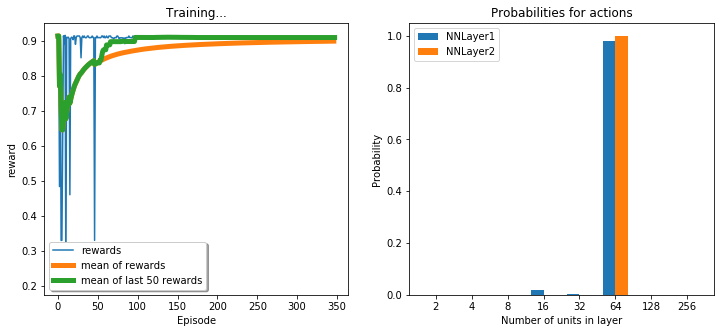

epoch 347 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

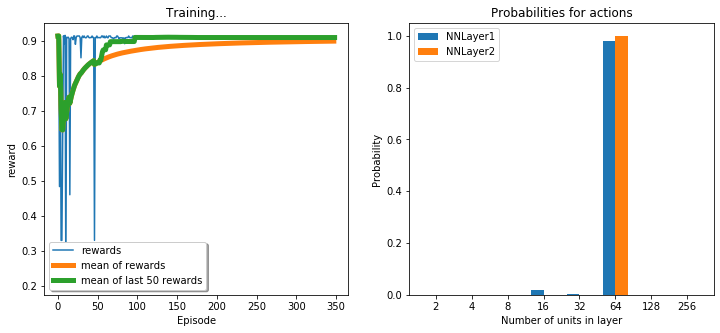

epoch 348 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

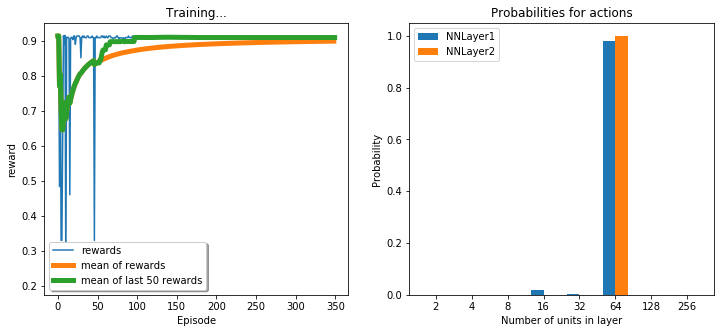

epoch 349 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

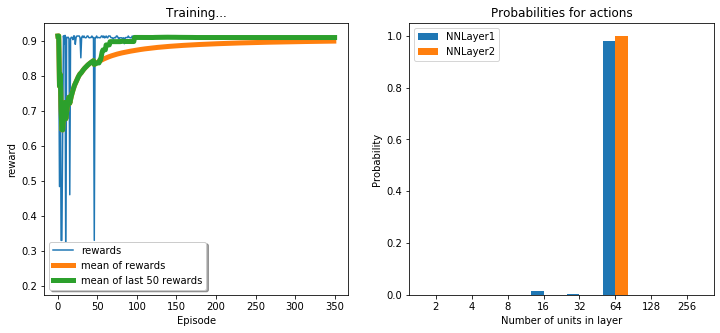

epoch 350 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

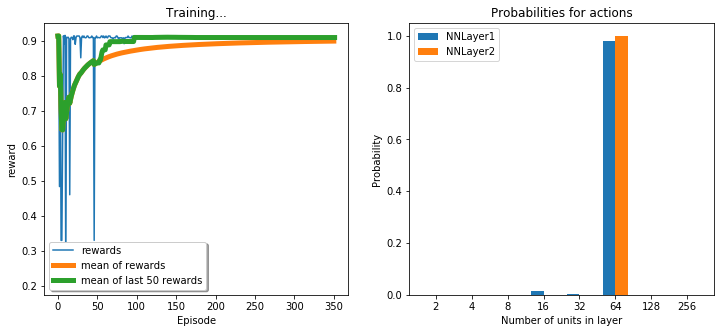

epoch 351 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

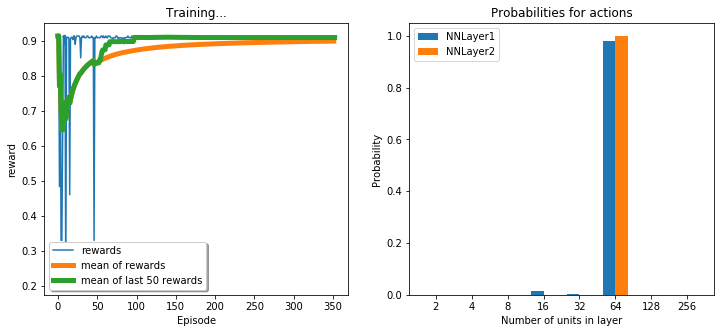

epoch 352 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

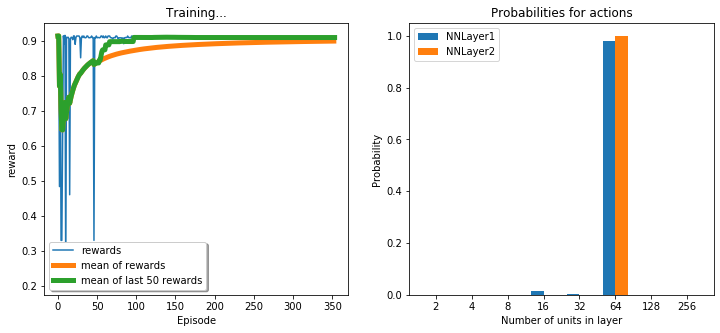

epoch 353 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

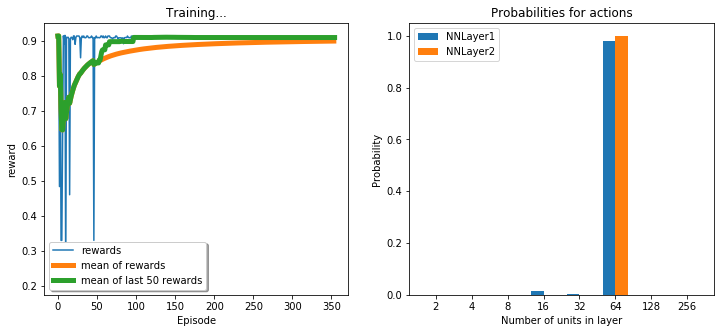

epoch 354 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

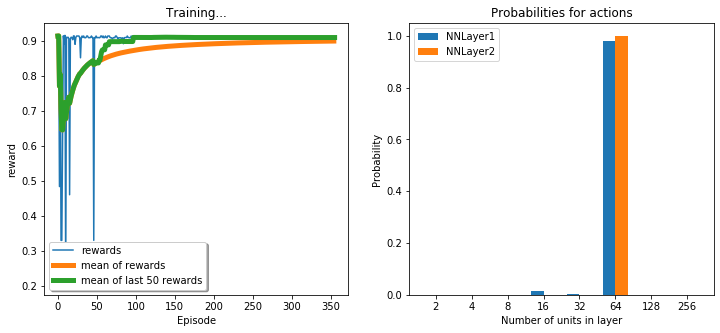

epoch 355 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

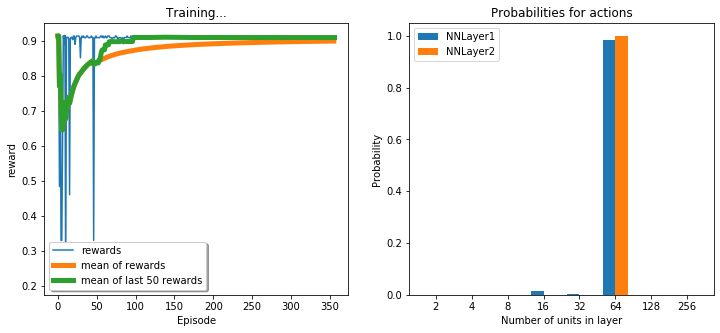

epoch 356 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

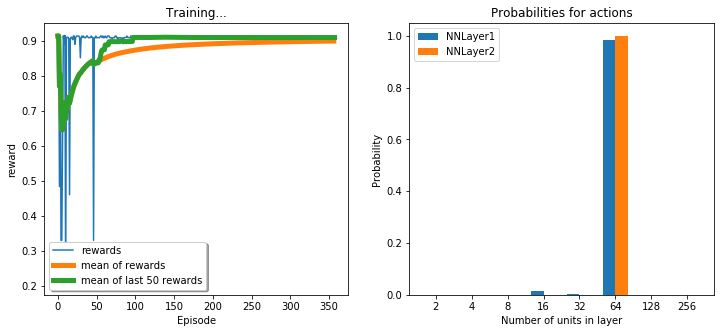

epoch 357 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

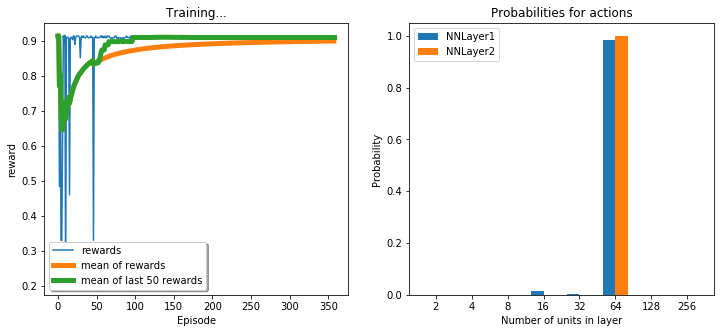

epoch 358 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

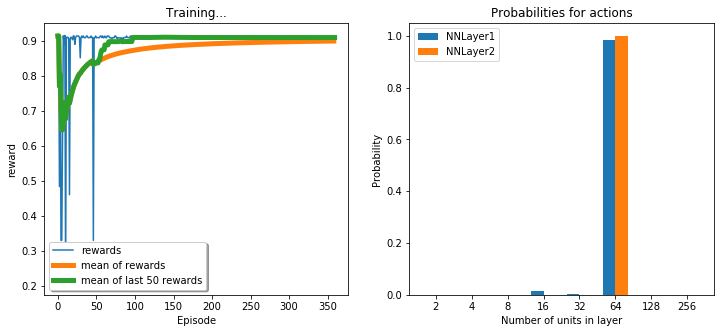

epoch 359 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

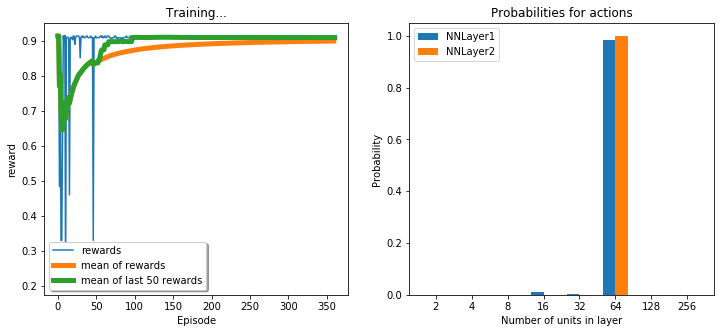

epoch 360 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

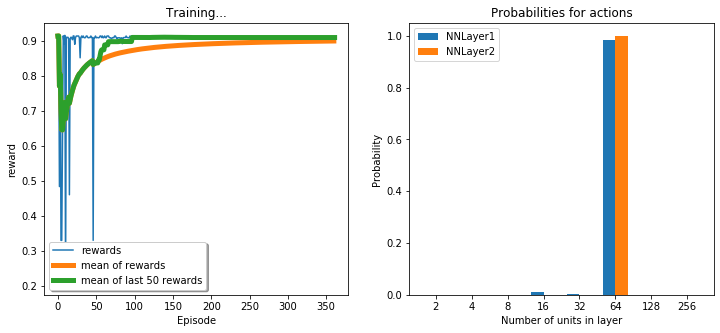

epoch 361 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

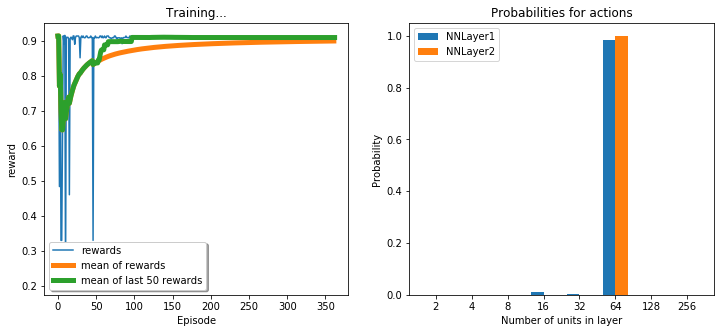

epoch 362 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

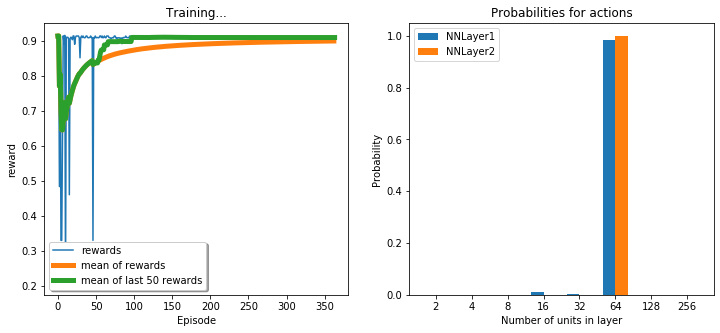

epoch 363 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

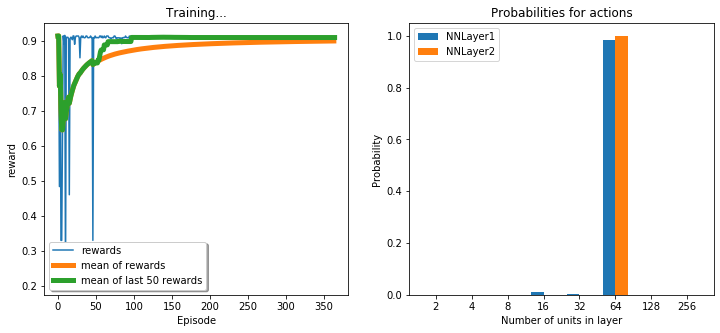

epoch 364 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

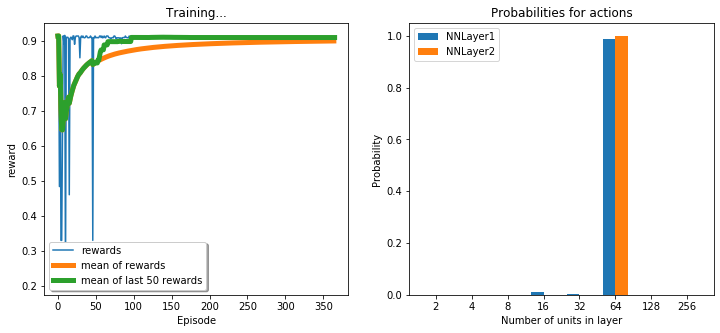

epoch 365 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

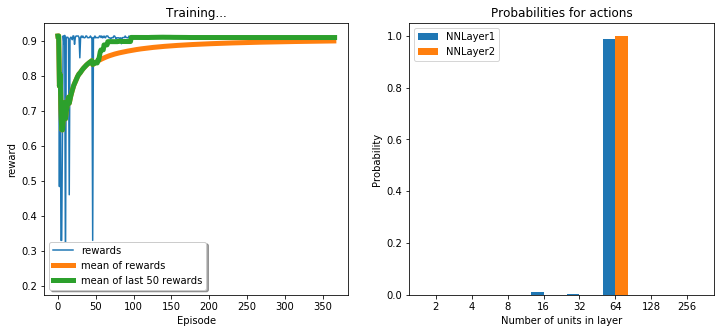

epoch 366 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

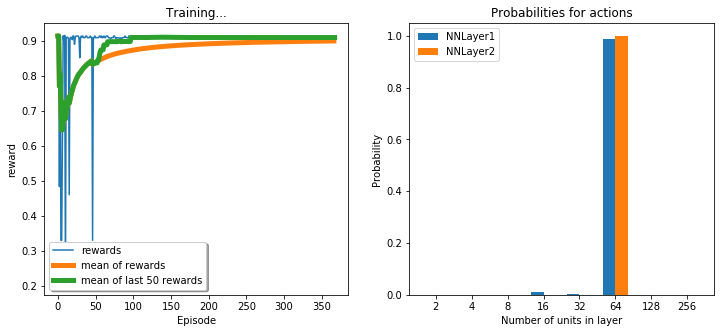

epoch 367 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

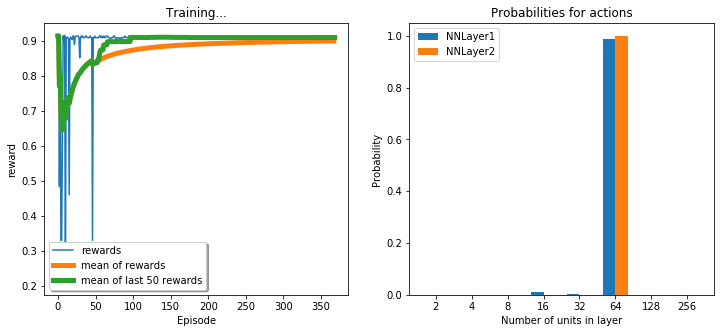

epoch 368 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

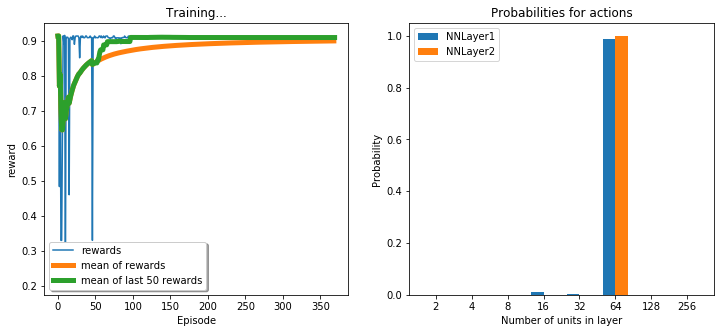

epoch 369 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

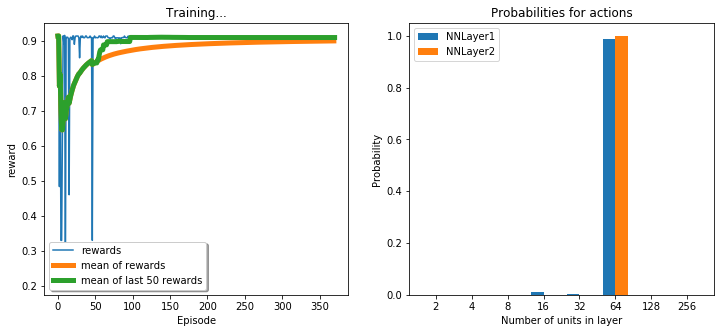

epoch 370 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

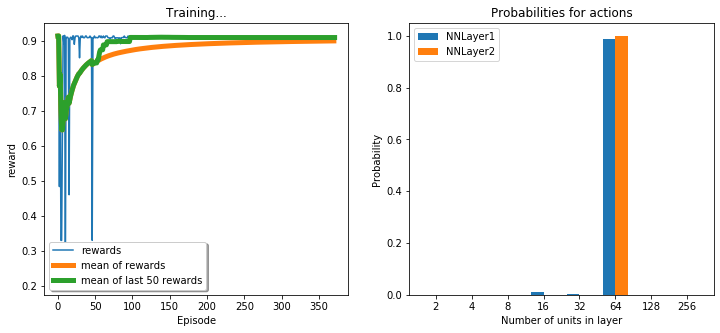

epoch 371 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

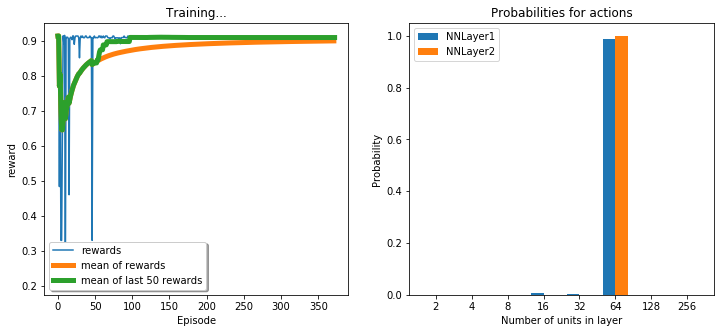

epoch 372 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

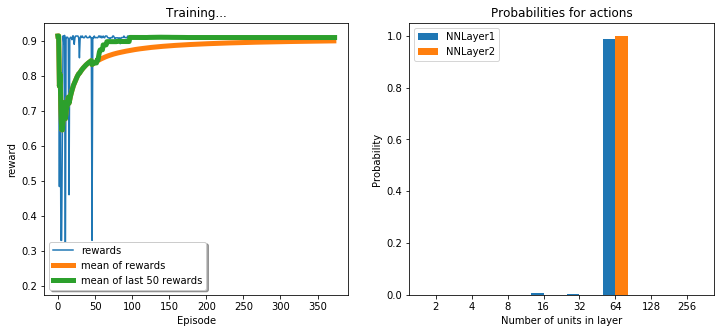

epoch 373 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

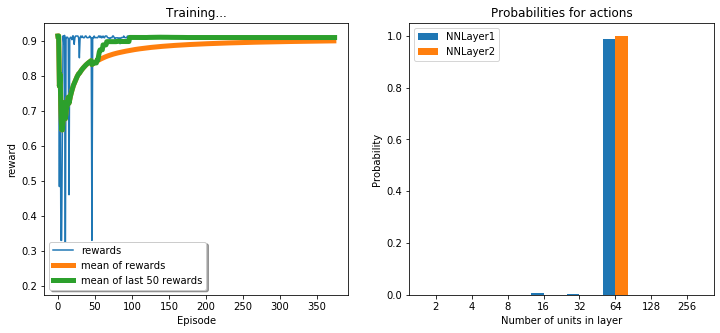

epoch 374 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

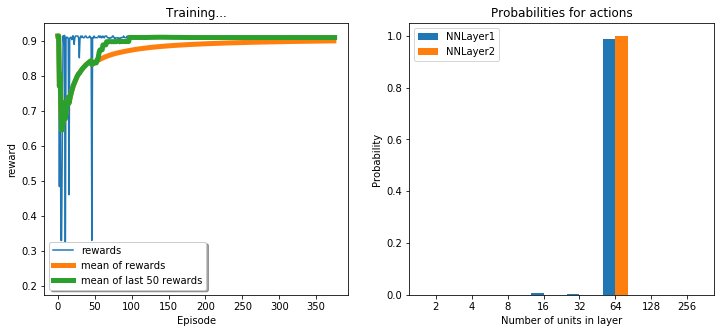

epoch 375 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

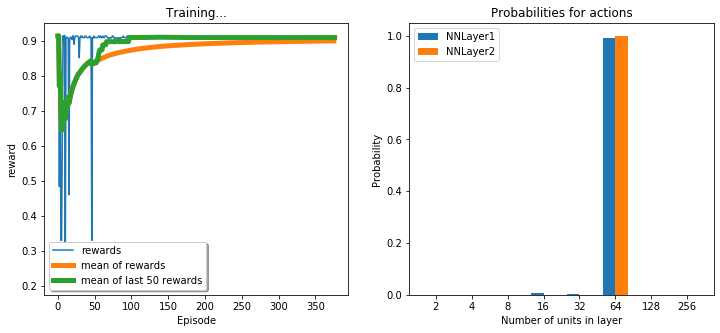

epoch 376 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

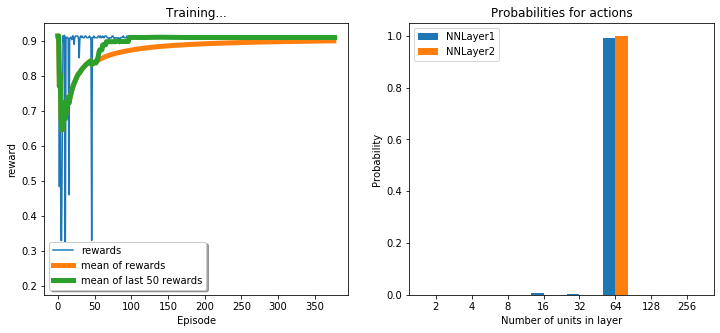

epoch 377 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

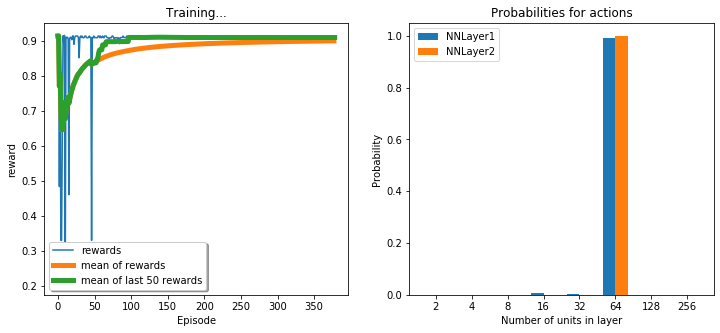

epoch 378 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

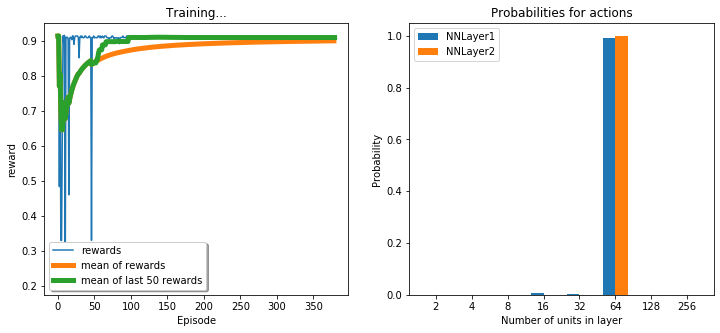

epoch 379 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

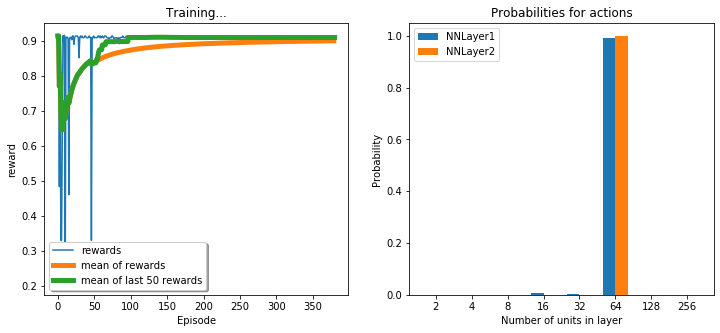

epoch 380 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

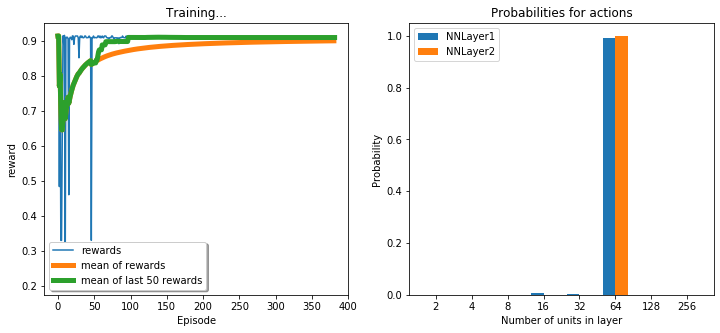

epoch 381 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

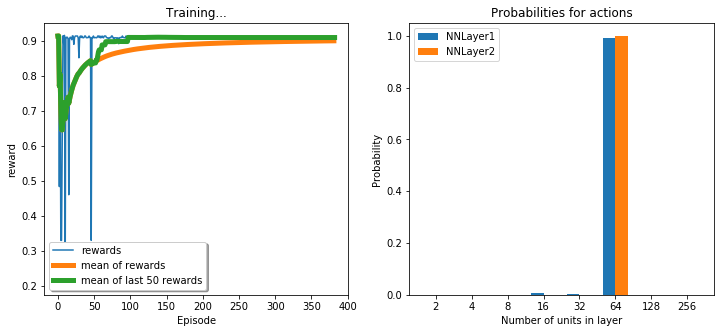

epoch 382 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

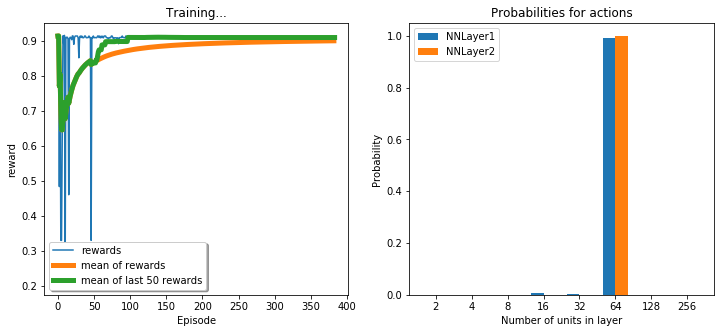

epoch 383 
Network (64, 64) accuracy:0.909, average rewards: 0.899


<Figure size 432x288 with 0 Axes>

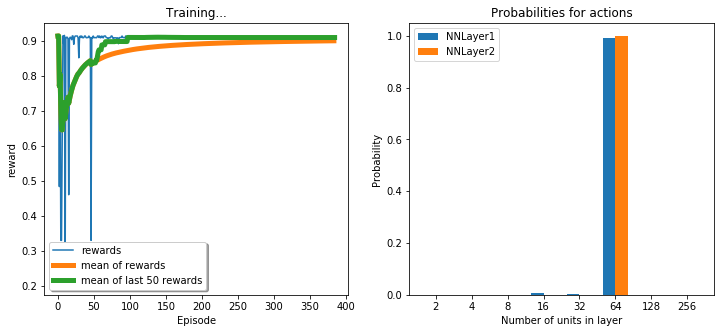

epoch 384 
Network (16, 64) accuracy:0.908, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

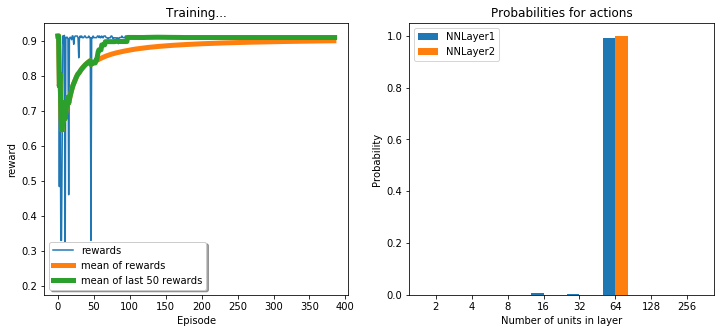

epoch 385 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

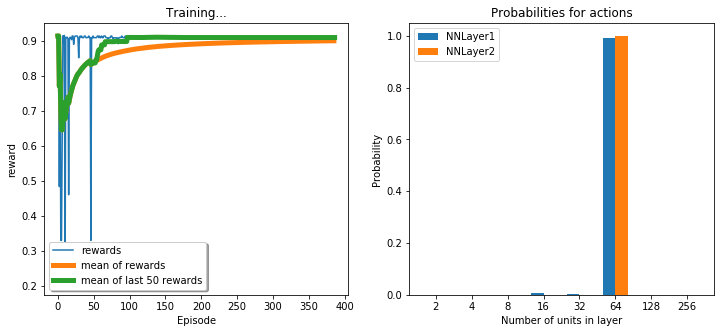

epoch 386 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

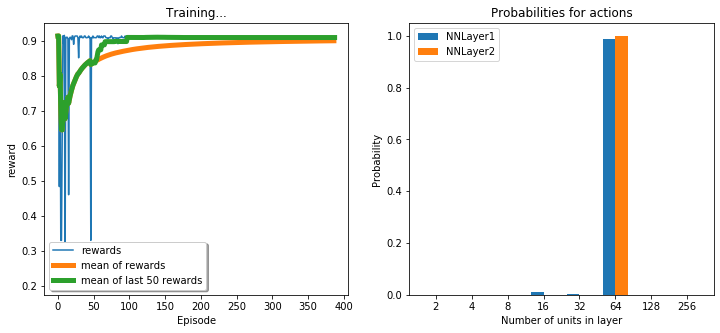

epoch 387 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

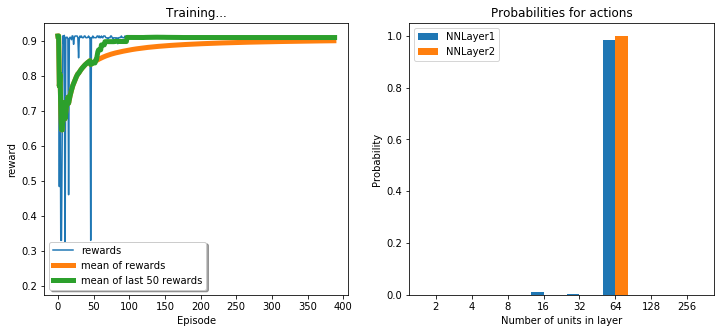

epoch 388 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

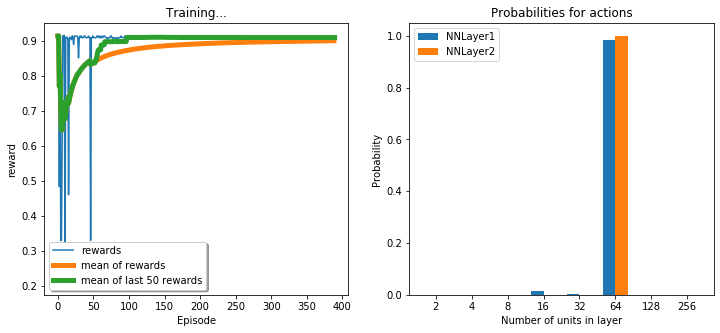

epoch 389 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

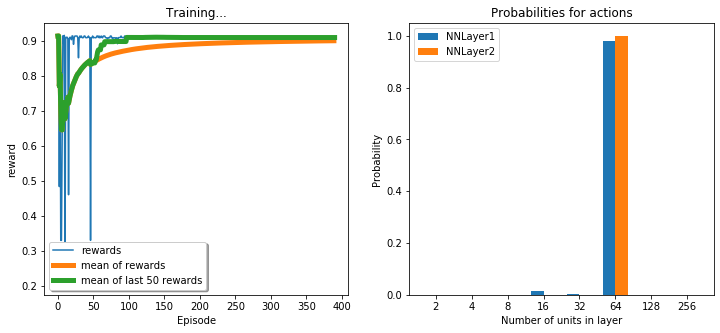

epoch 390 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

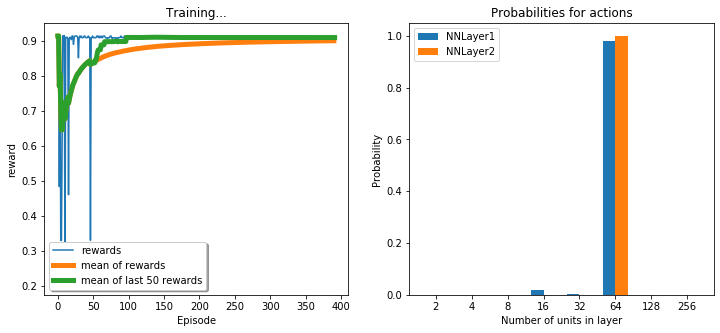

epoch 391 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

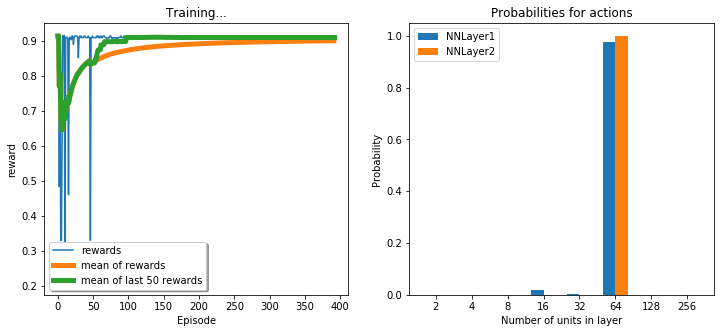

epoch 392 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

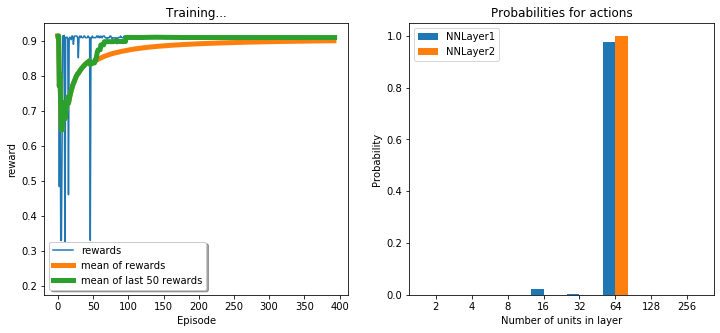

epoch 393 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

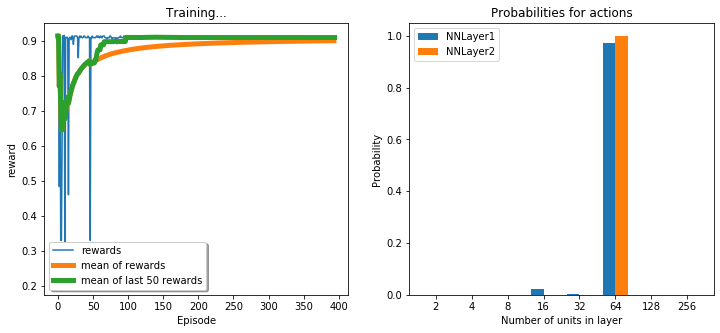

epoch 394 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

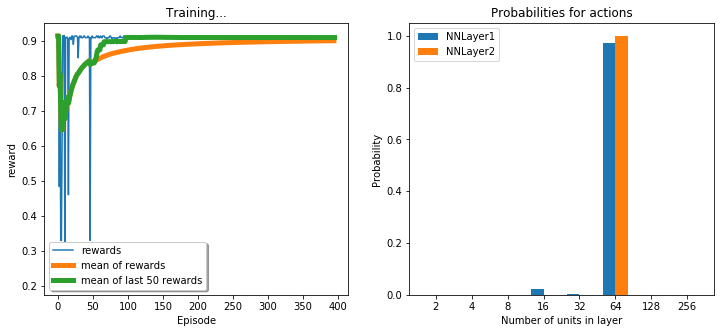

epoch 395 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

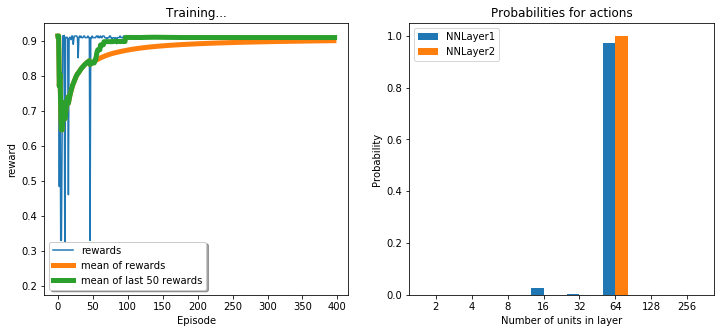

epoch 396 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

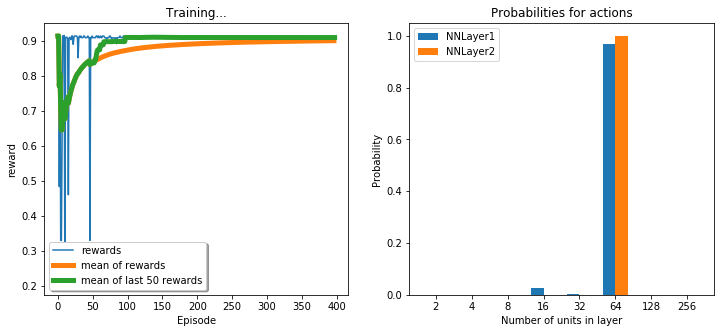

epoch 397 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

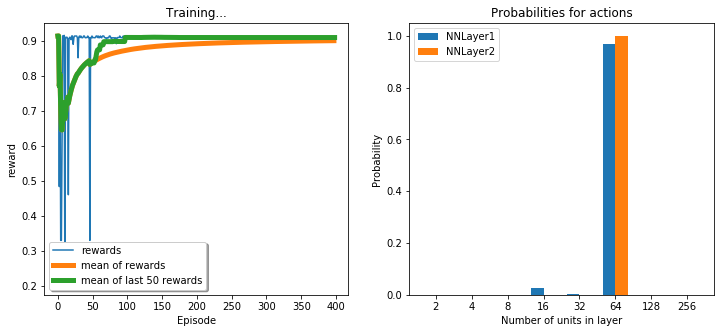

epoch 398 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

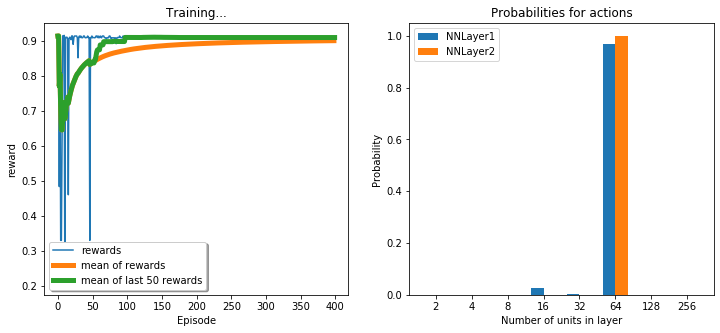

epoch 399 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

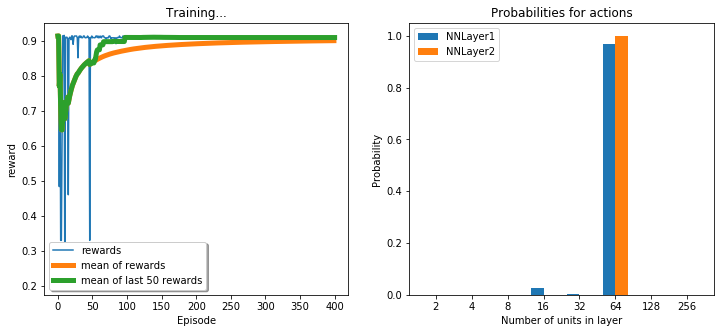

epoch 400 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

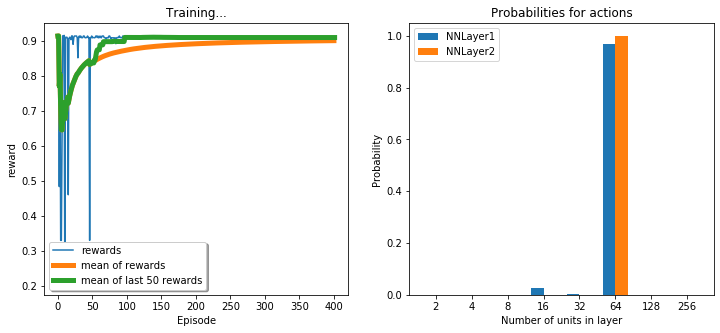

epoch 401 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

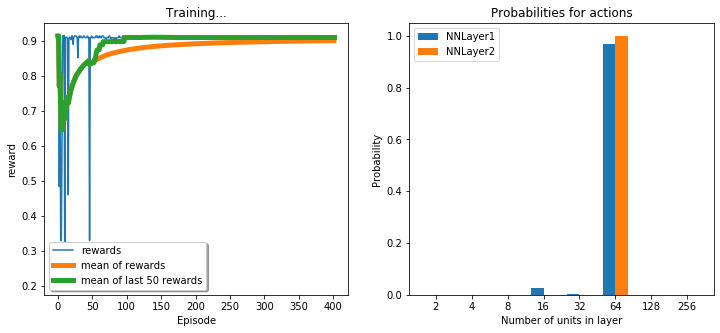

epoch 402 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

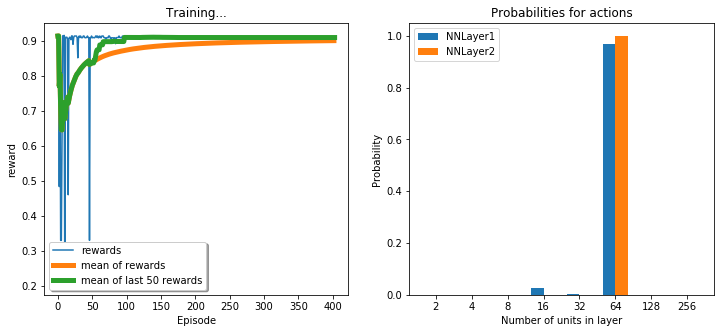

epoch 403 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

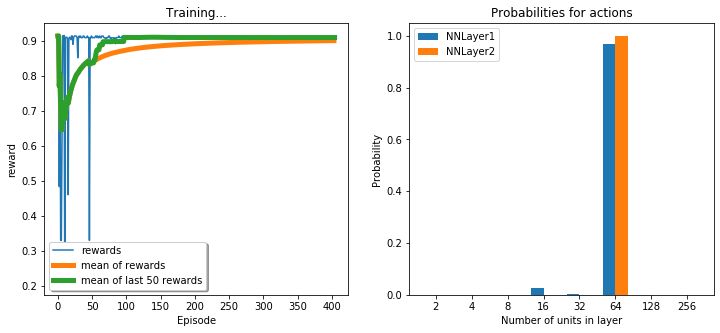

epoch 404 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

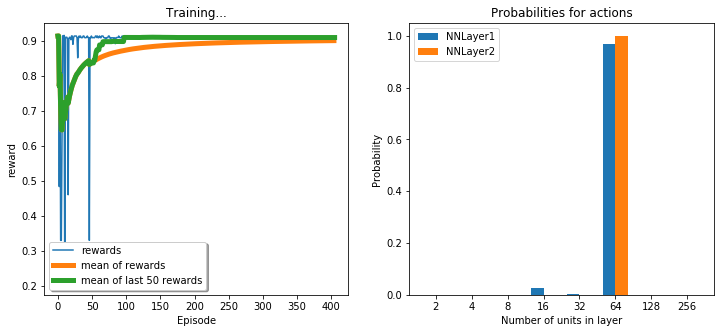

epoch 405 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

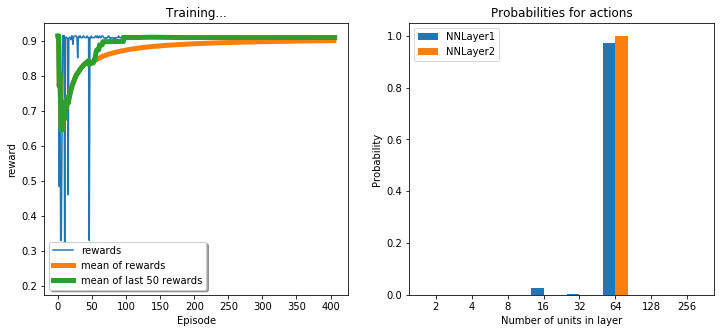

epoch 406 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

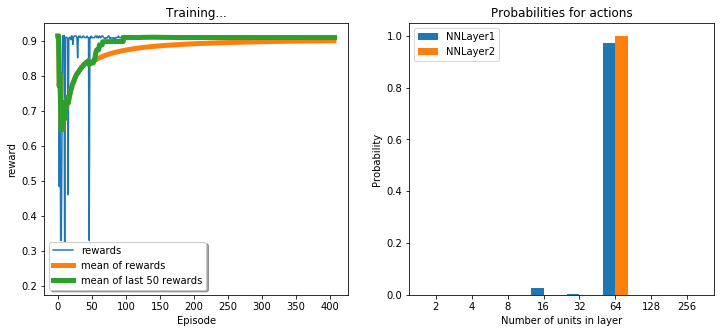

epoch 407 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

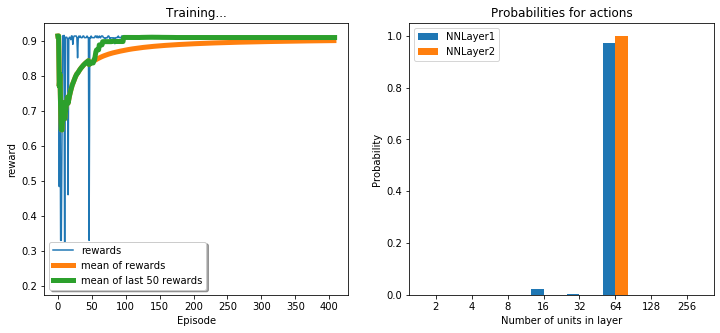

epoch 408 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

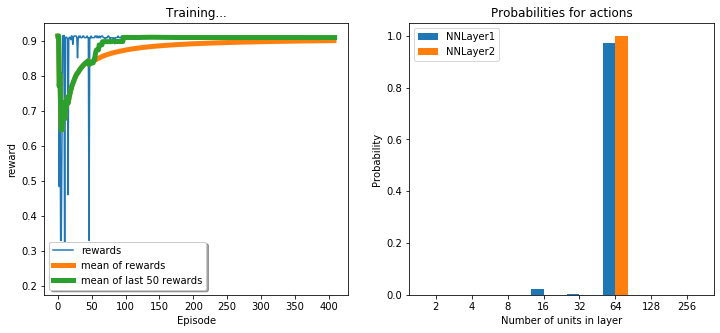

epoch 409 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

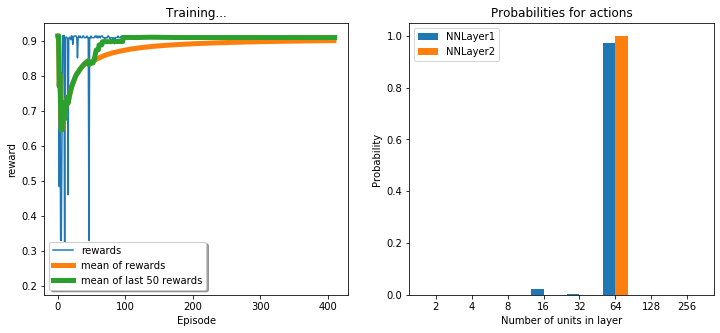

epoch 410 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

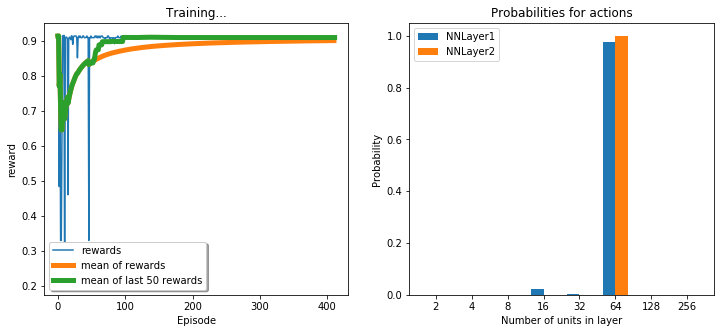

epoch 411 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

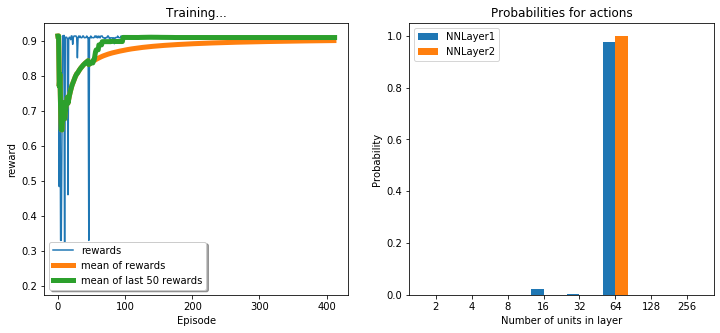

epoch 412 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

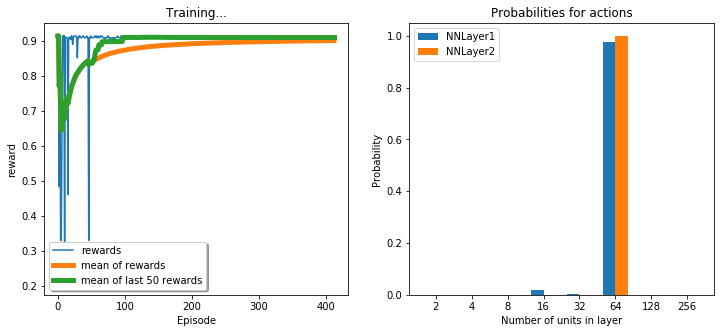

epoch 413 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

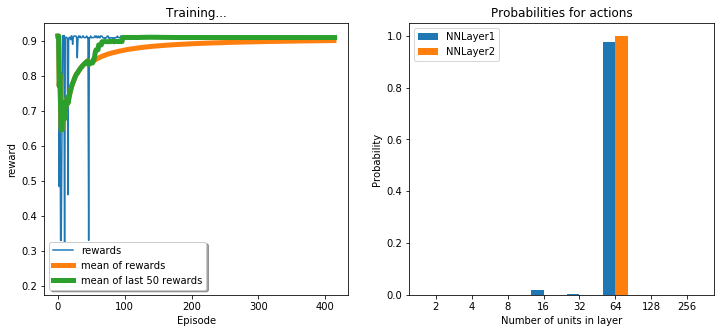

epoch 414 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

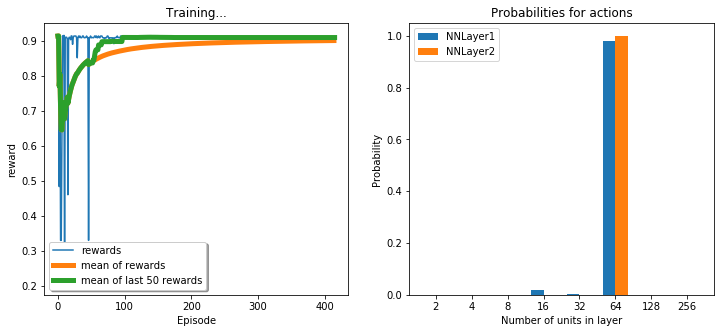

epoch 415 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

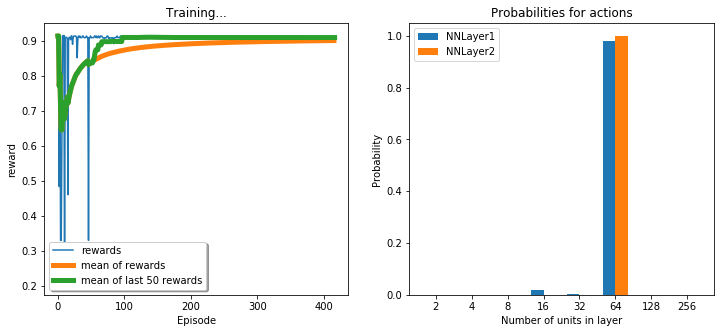

epoch 416 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

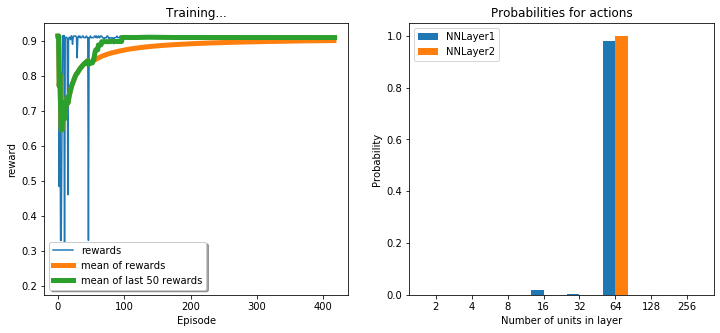

epoch 417 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

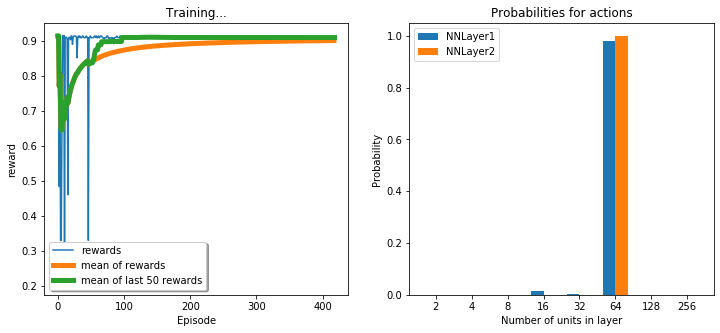

epoch 418 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

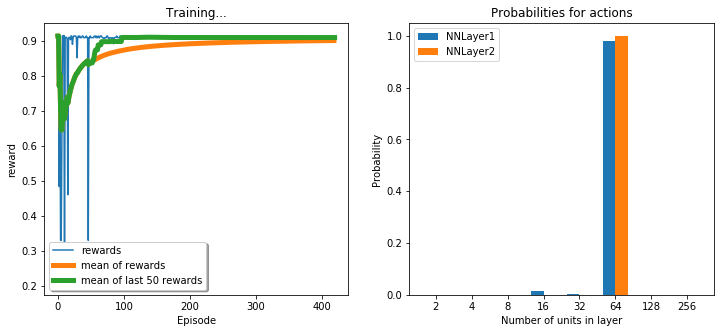

epoch 419 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

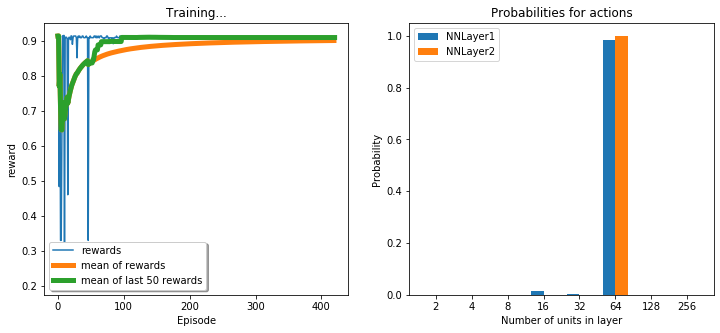

epoch 420 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

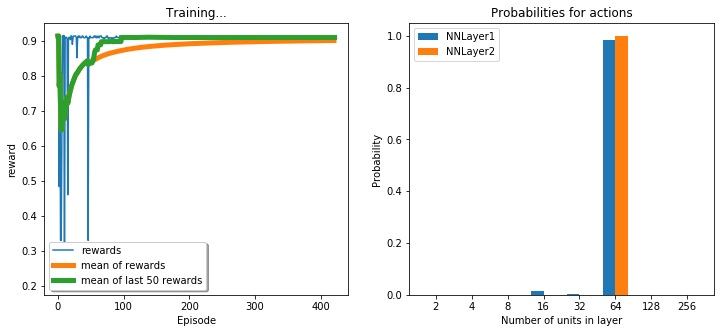

epoch 421 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

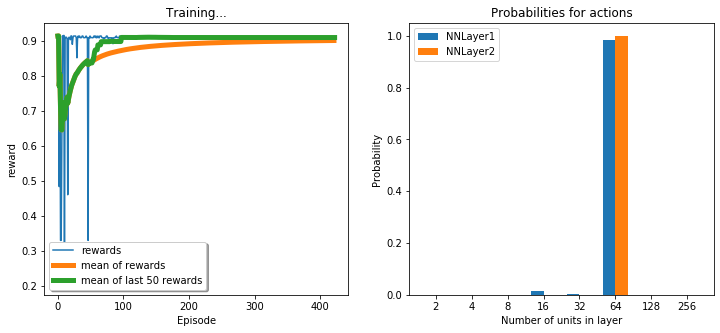

epoch 422 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

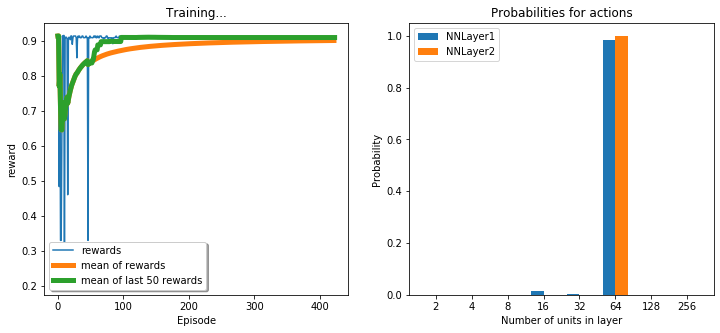

epoch 423 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

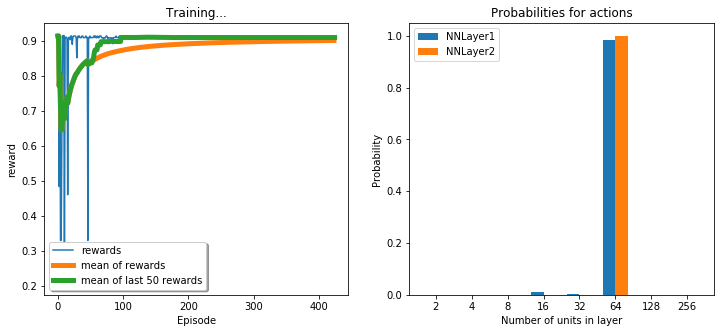

epoch 424 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

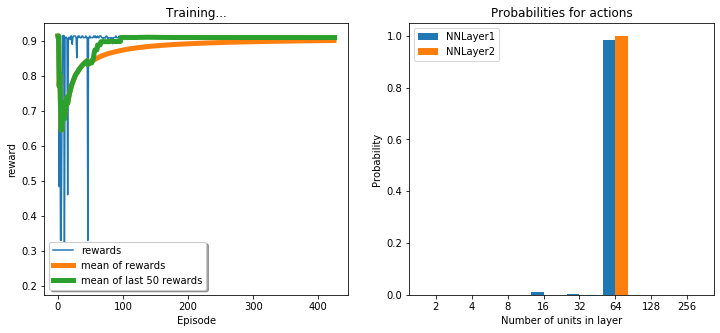

epoch 425 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

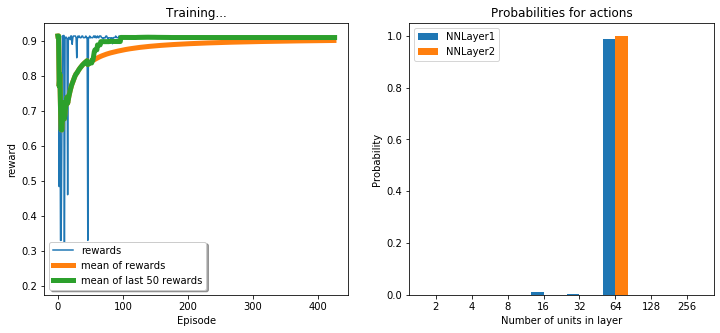

epoch 426 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

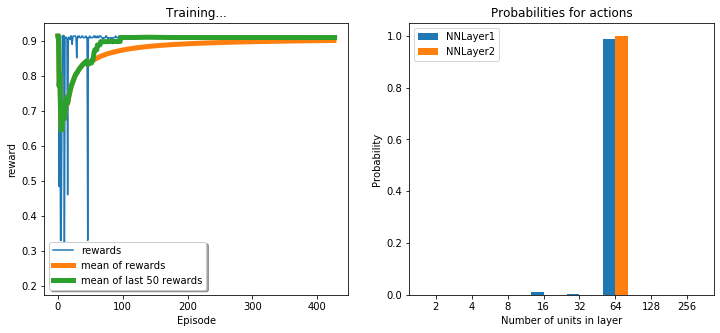

epoch 427 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

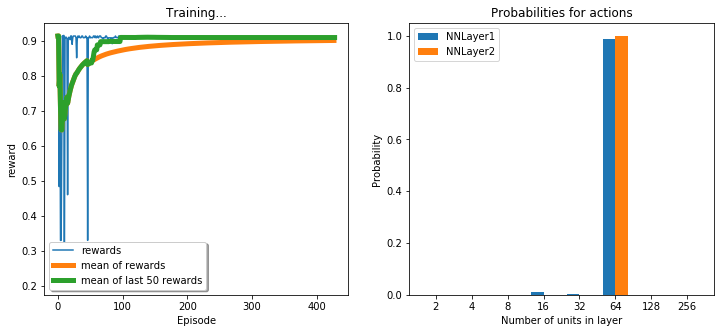

epoch 428 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

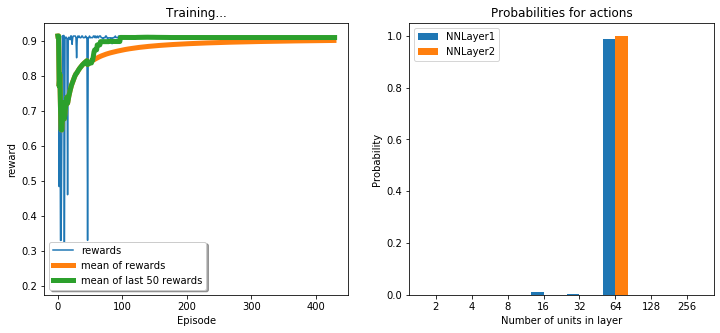

epoch 429 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

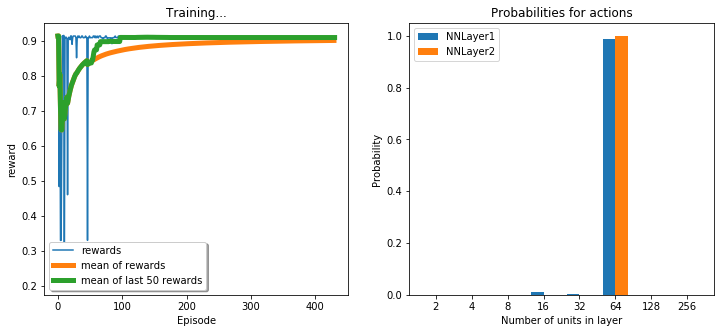

epoch 430 
Network (64, 64) accuracy:0.909, average rewards: 0.900


<Figure size 432x288 with 0 Axes>

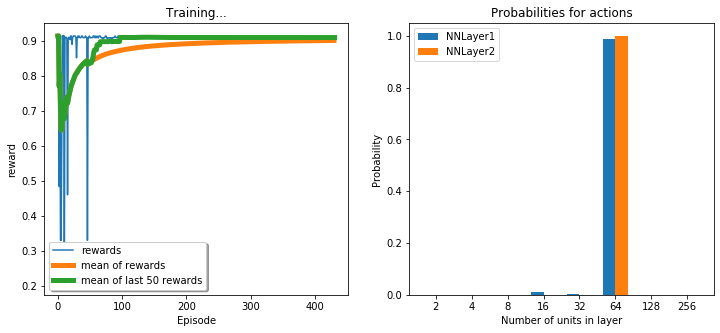

epoch 431 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

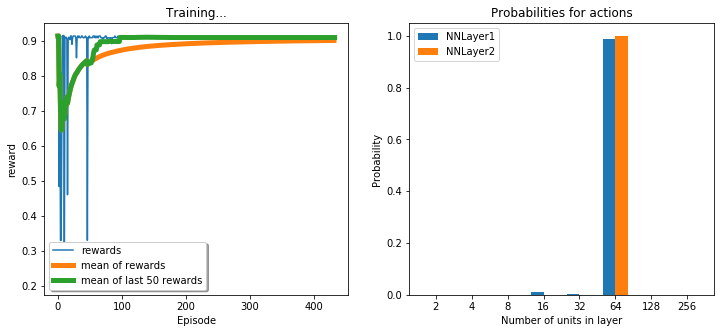

epoch 432 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

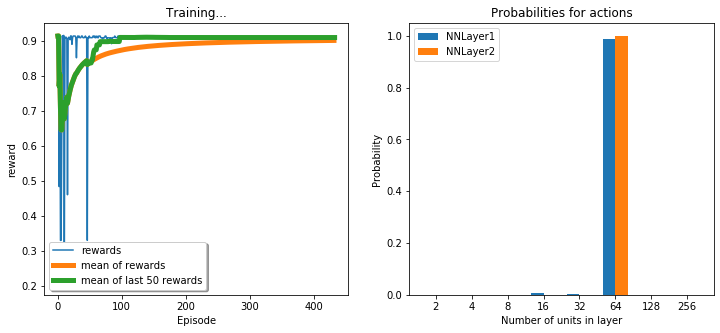

epoch 433 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

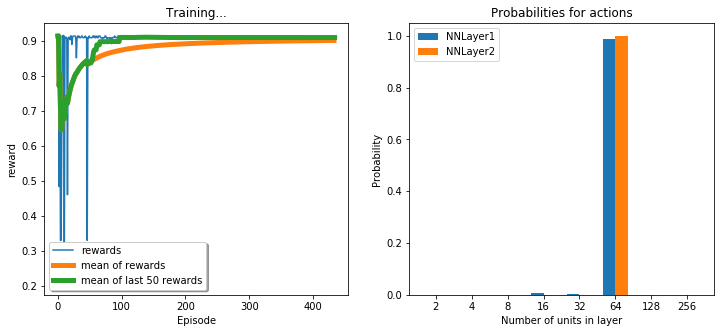

epoch 434 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

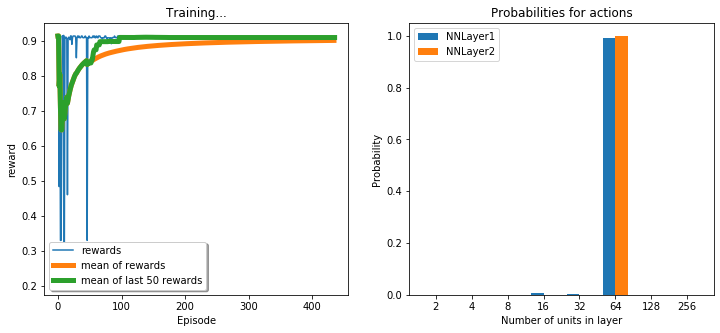

epoch 435 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

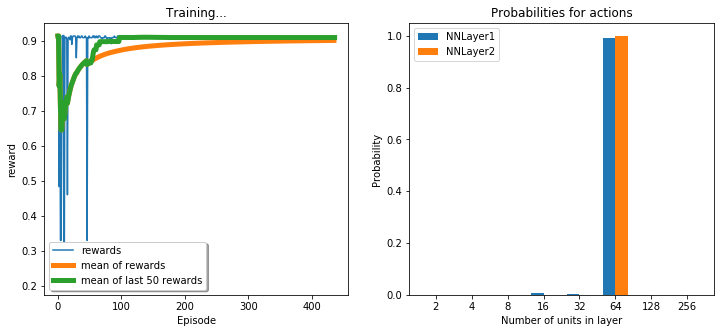

epoch 436 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

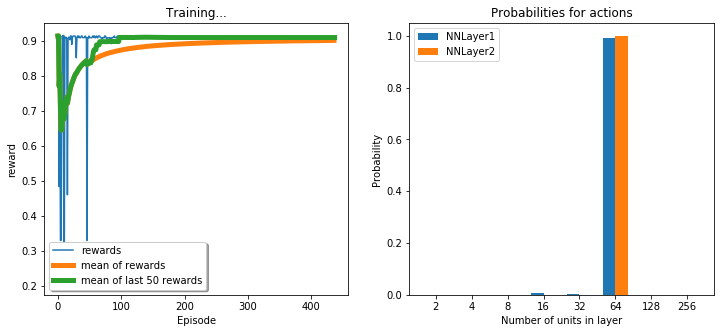

epoch 437 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

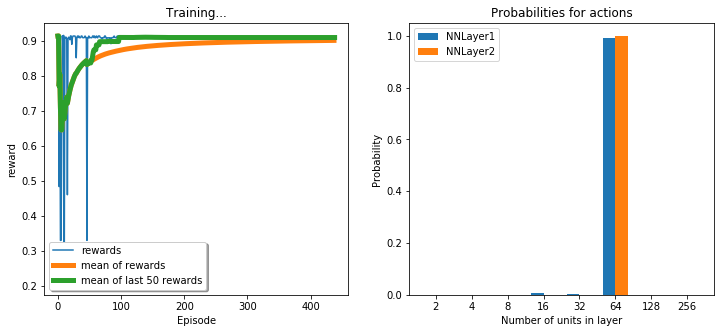

epoch 438 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

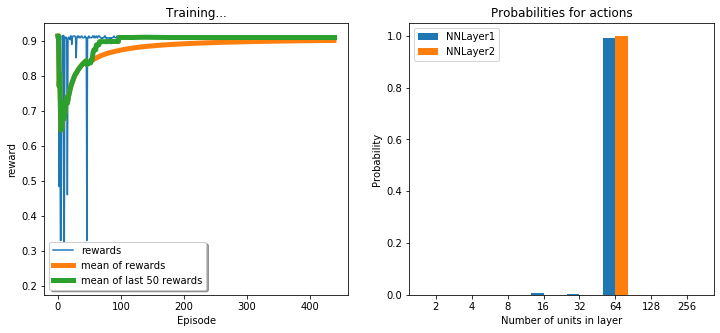

epoch 439 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

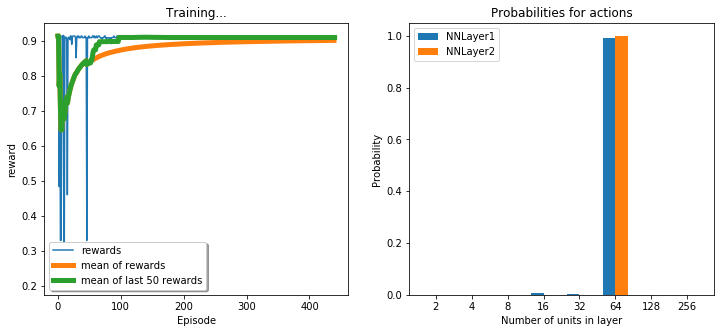

epoch 440 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

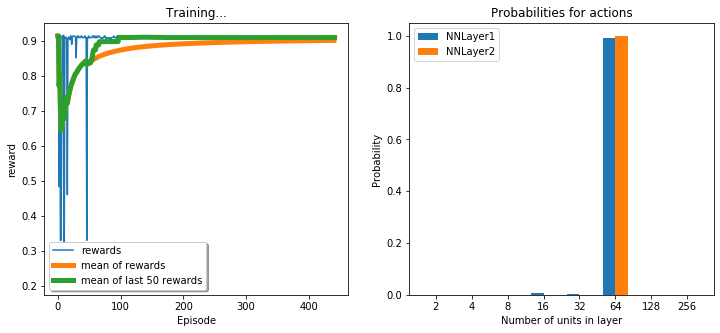

epoch 441 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

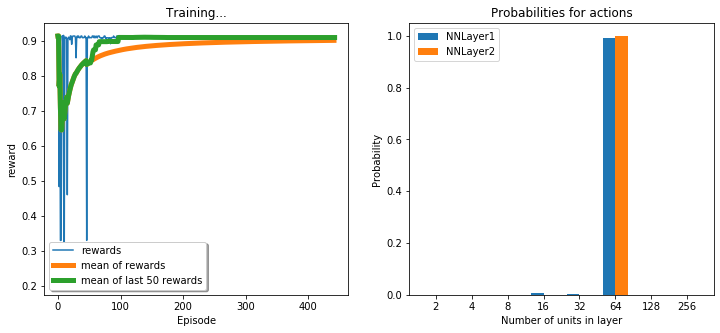

epoch 442 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

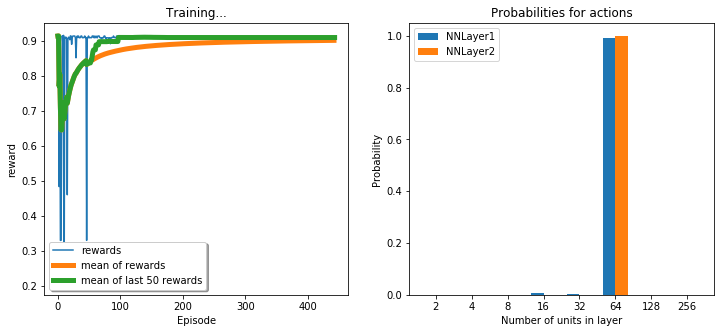

epoch 443 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

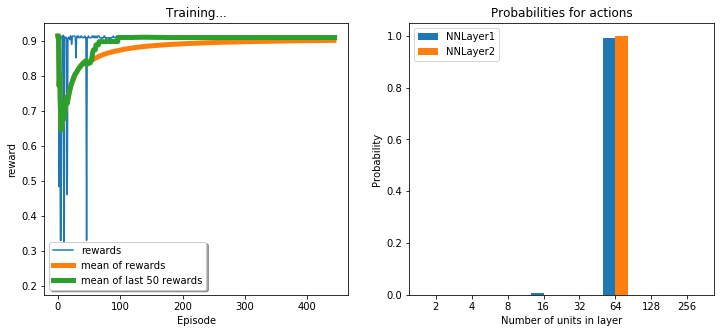

epoch 444 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

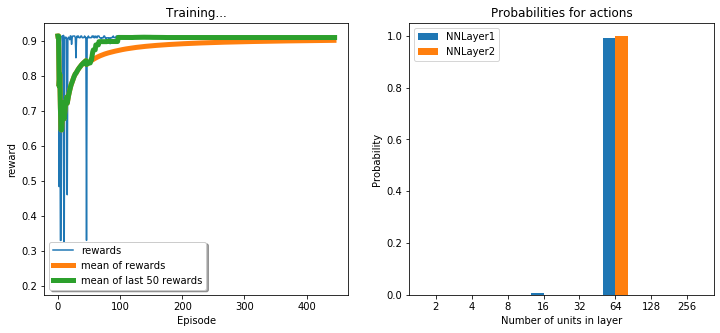

epoch 445 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

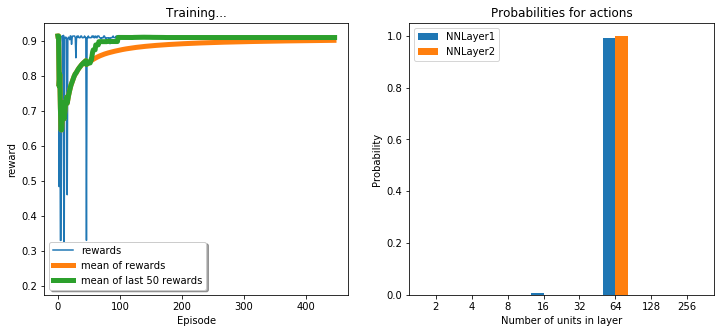

epoch 446 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

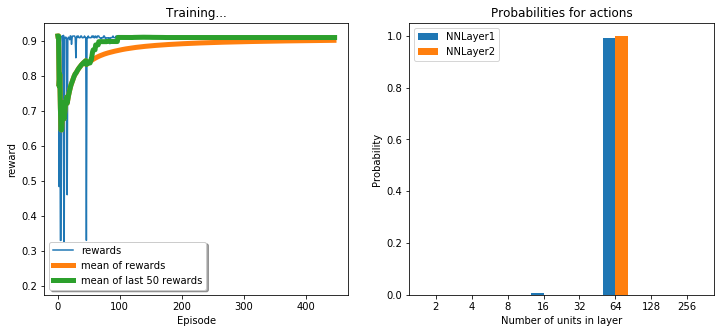

epoch 447 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

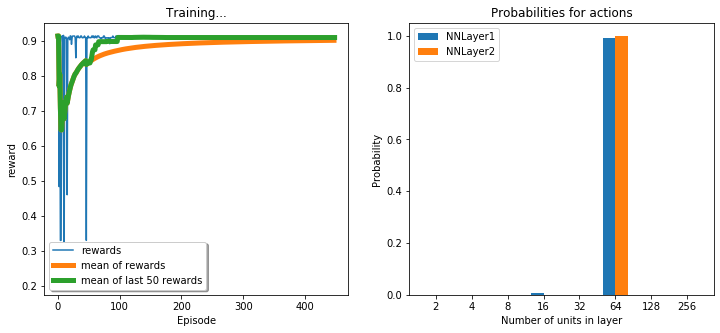

epoch 448 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

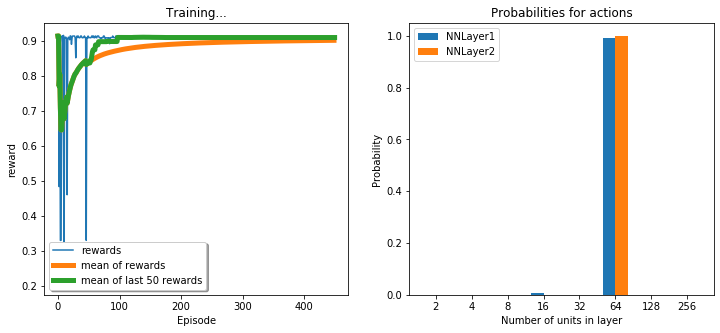

epoch 449 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

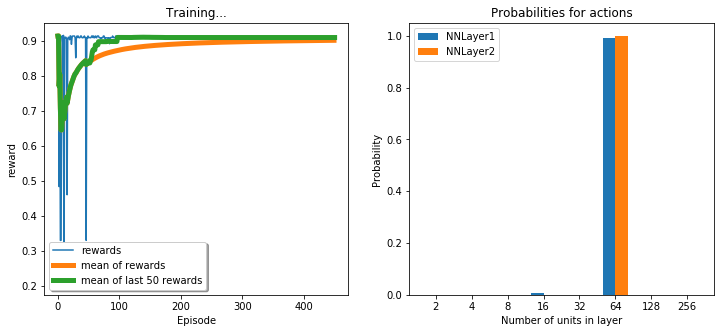

epoch 450 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

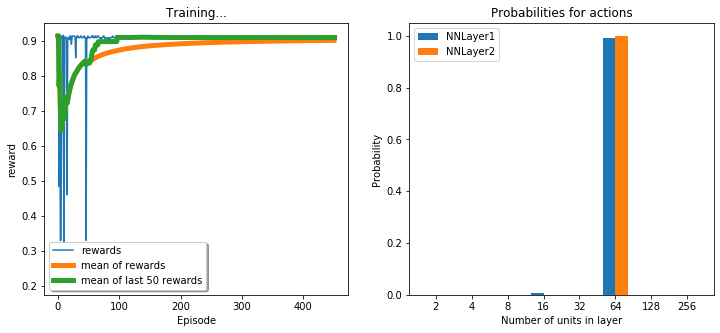

epoch 451 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

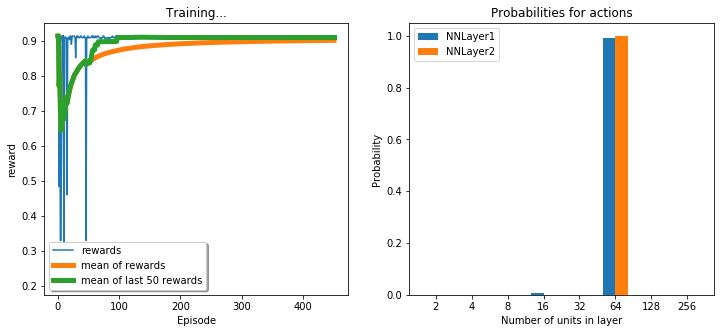

epoch 452 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

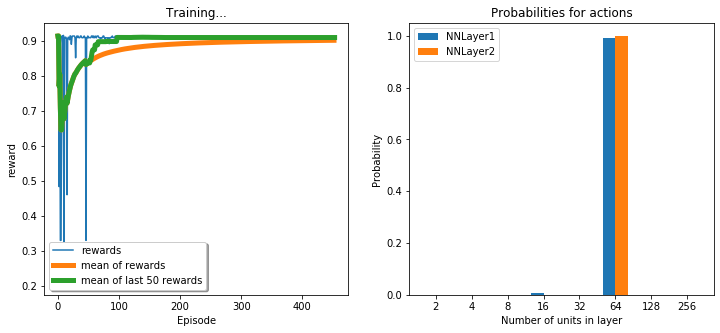

epoch 453 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

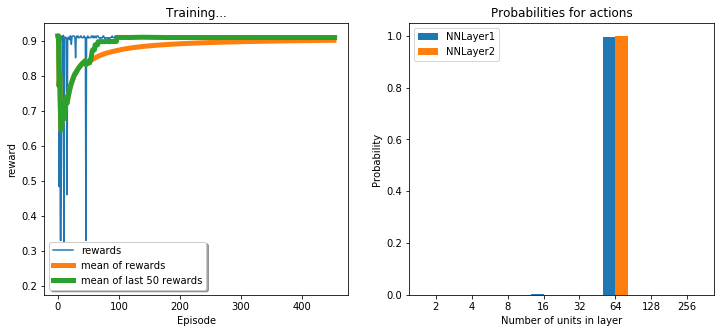

epoch 454 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

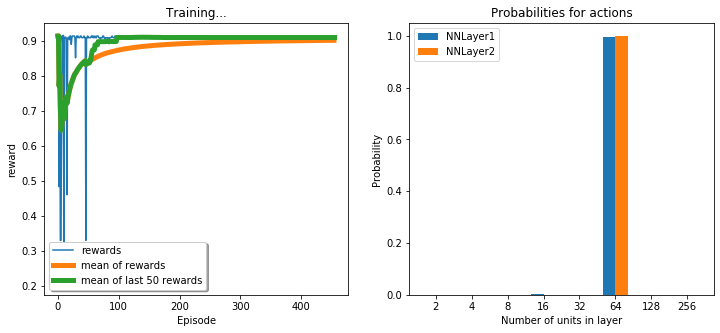

epoch 455 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

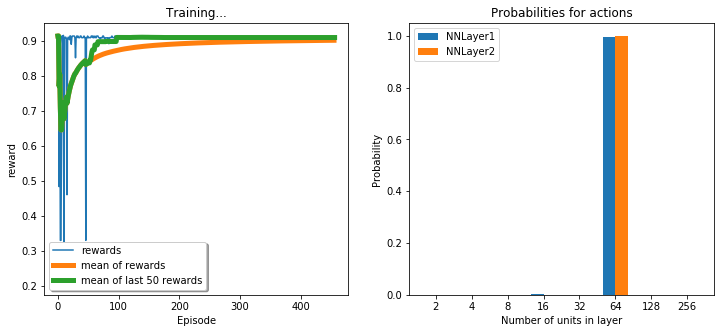

epoch 456 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

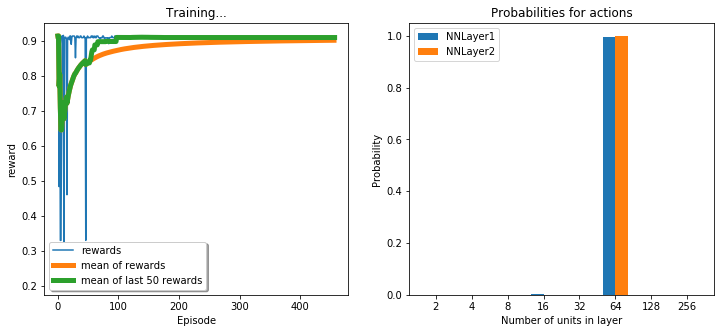

epoch 457 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

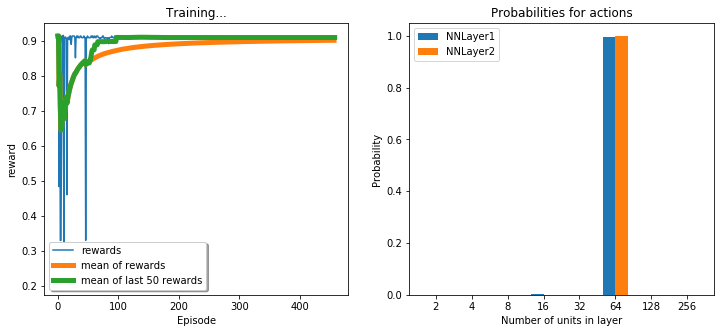

epoch 458 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

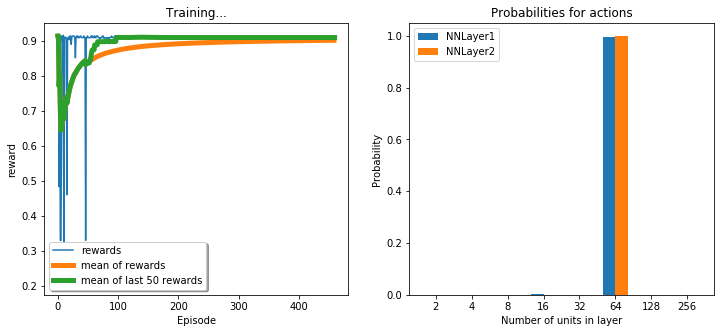

epoch 459 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

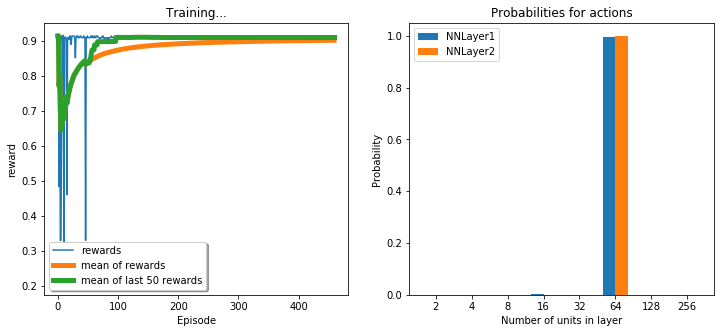

epoch 460 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

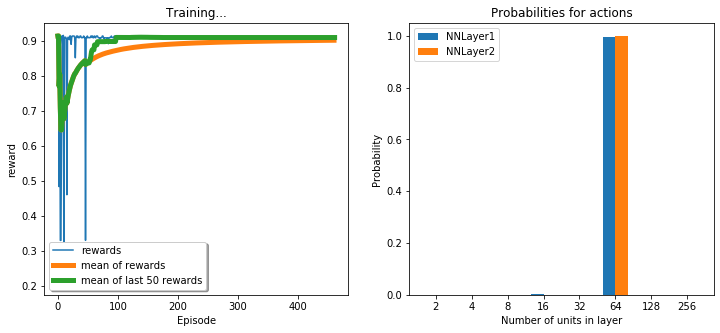

epoch 461 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

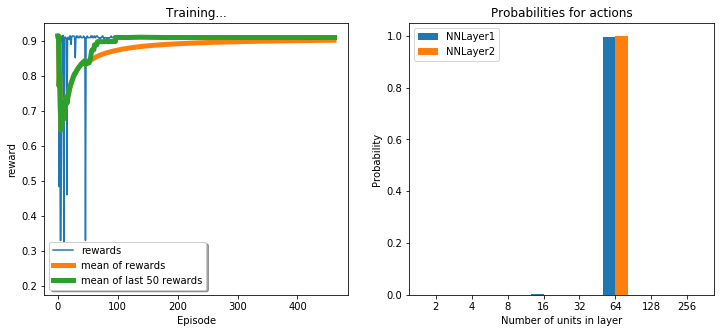

epoch 462 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

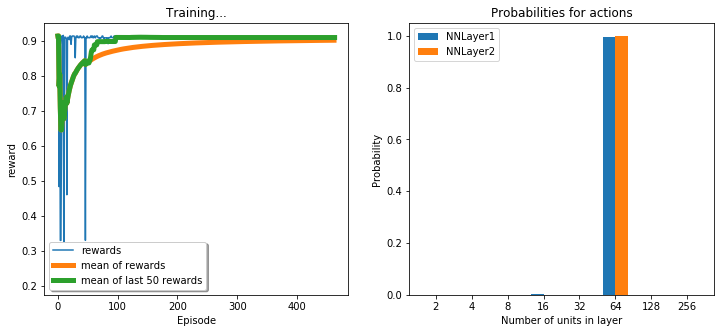

epoch 463 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

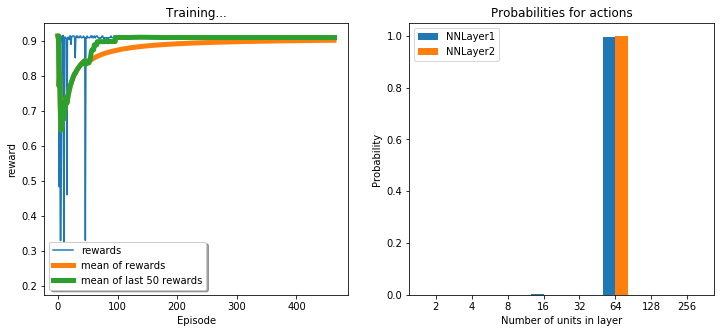

epoch 464 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

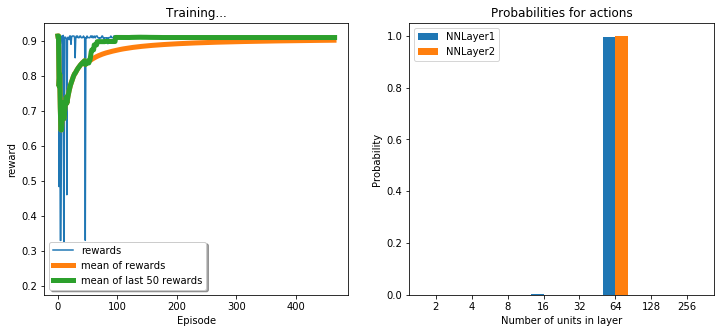

epoch 465 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

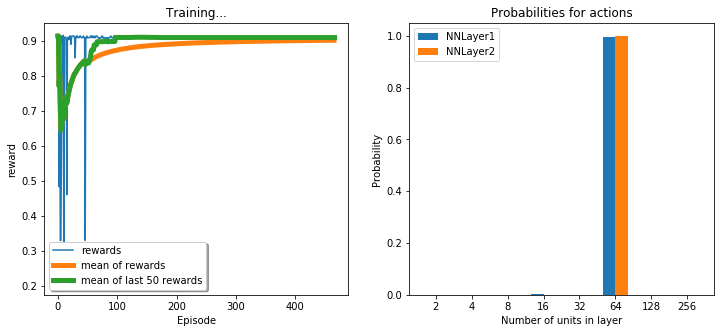

epoch 466 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

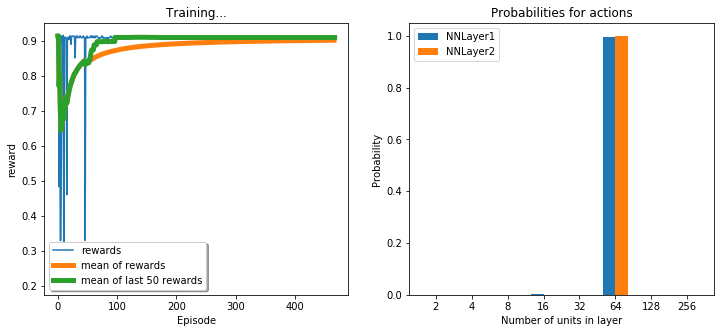

epoch 467 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

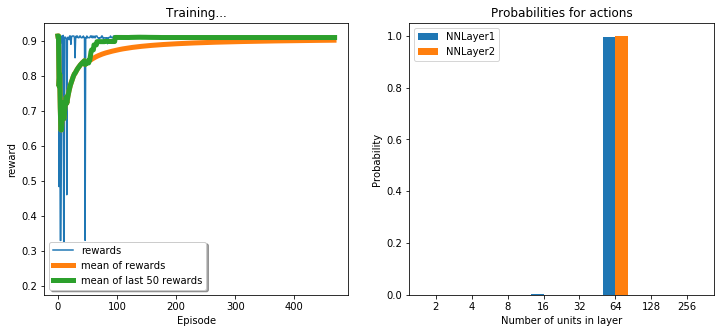

epoch 468 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

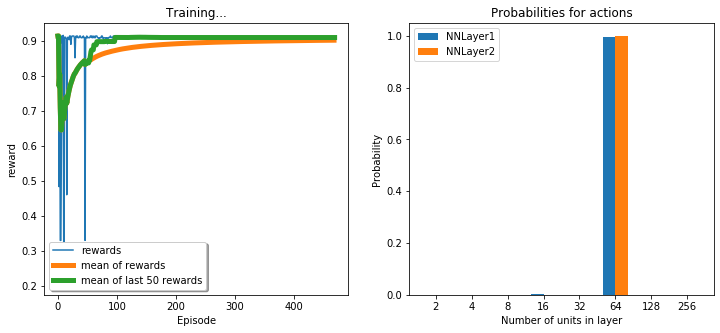

epoch 469 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

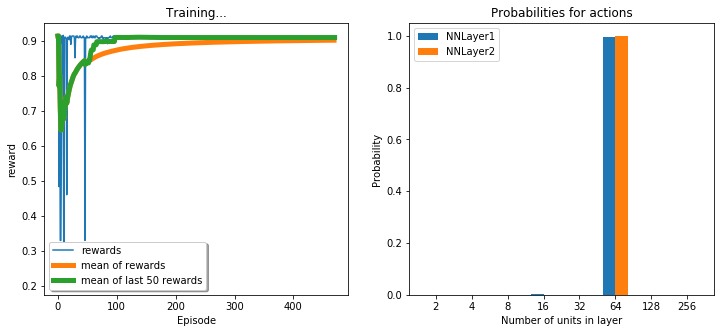

epoch 470 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

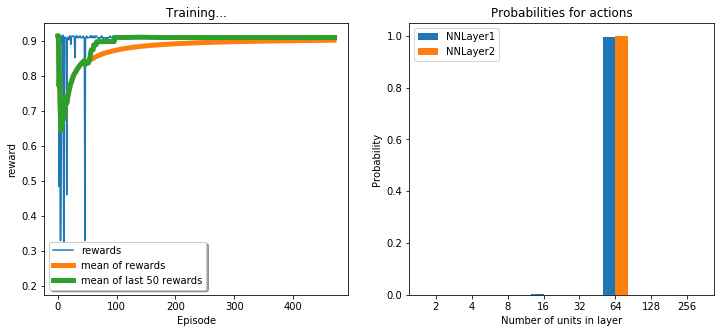

epoch 471 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

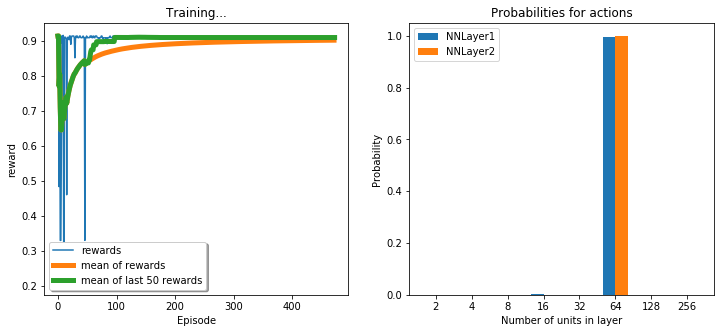

epoch 472 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

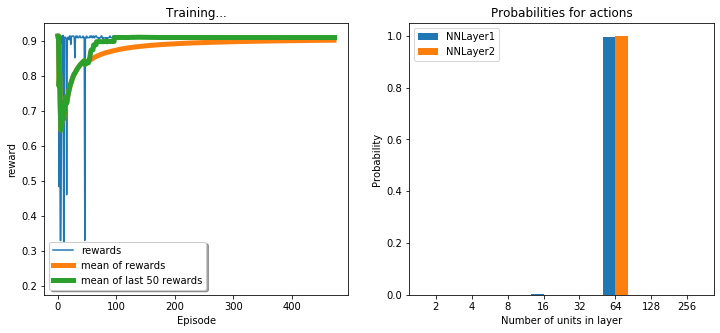

epoch 473 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

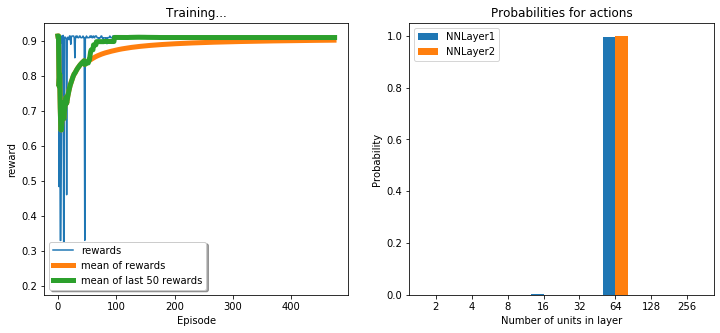

epoch 474 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

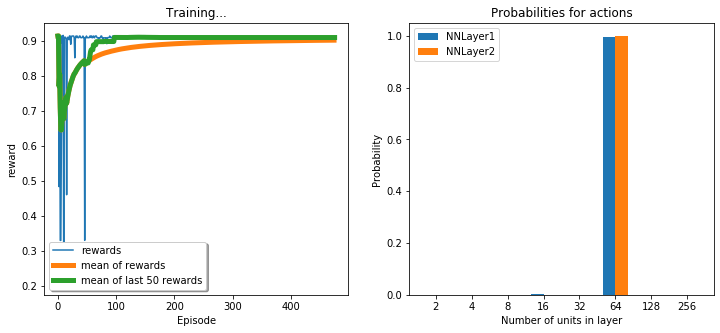

epoch 475 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

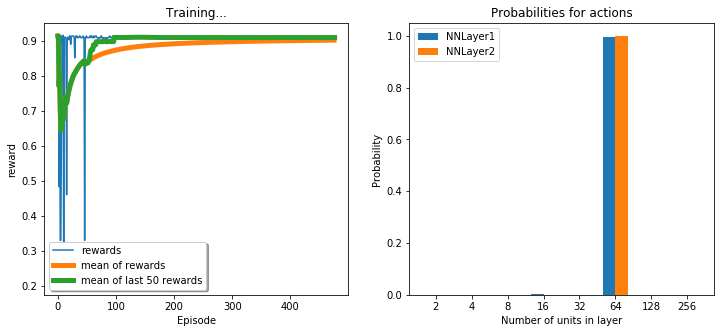

epoch 476 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

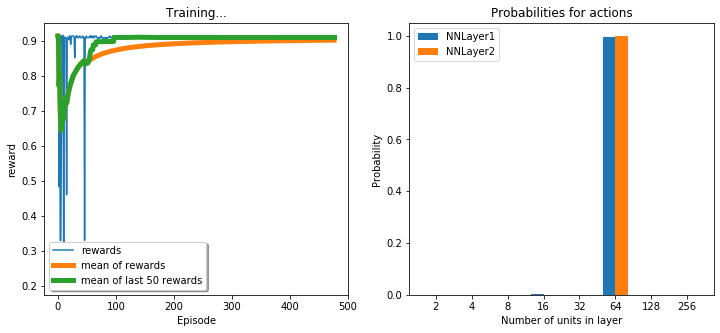

epoch 477 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

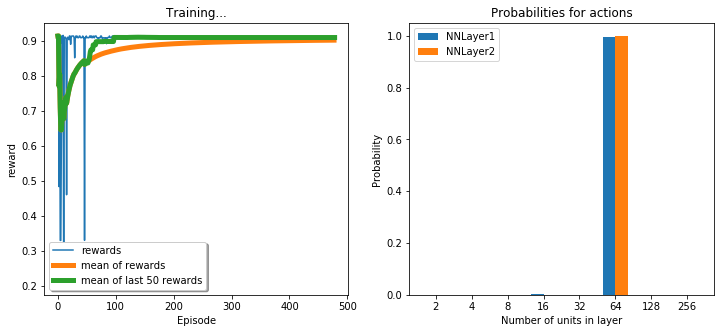

epoch 478 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

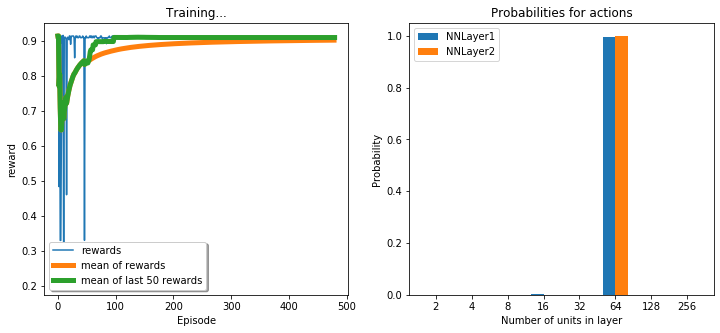

epoch 479 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

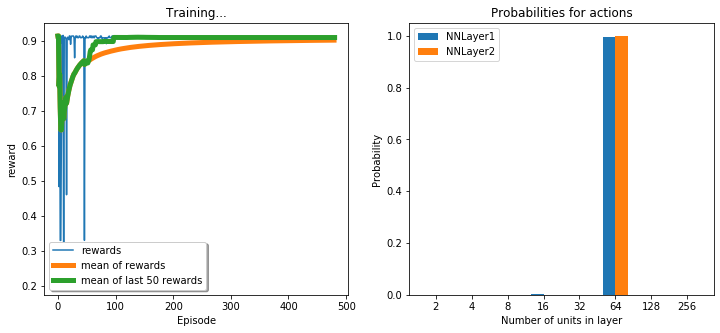

epoch 480 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

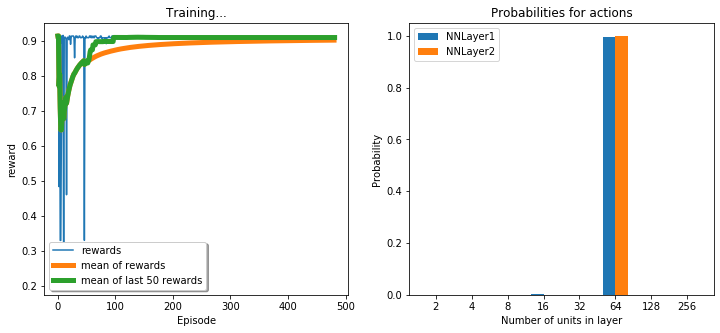

epoch 481 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

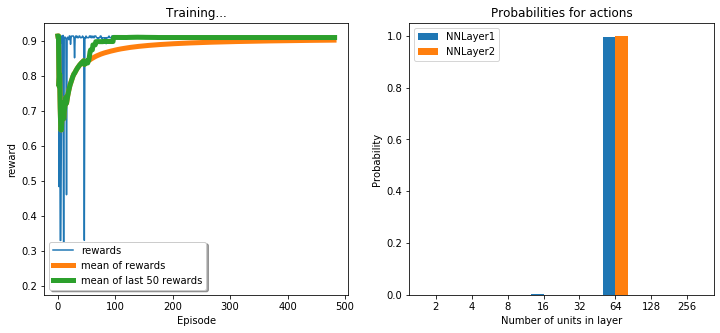

epoch 482 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

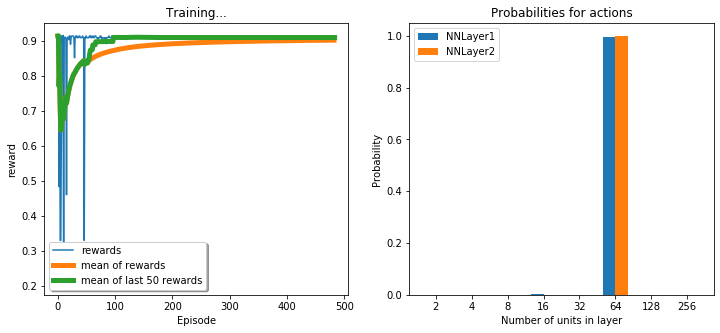

epoch 483 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

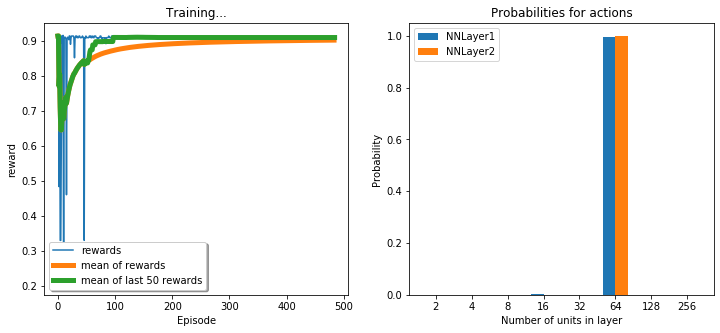

epoch 484 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

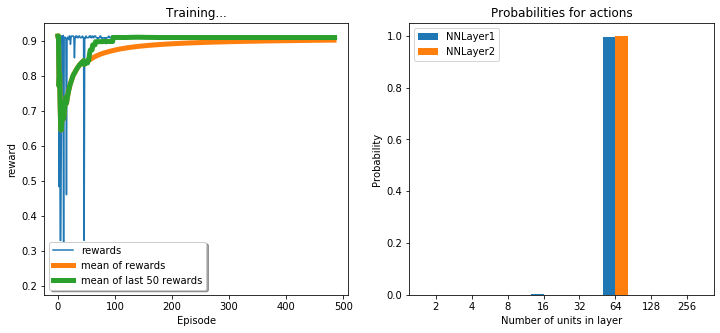

epoch 485 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

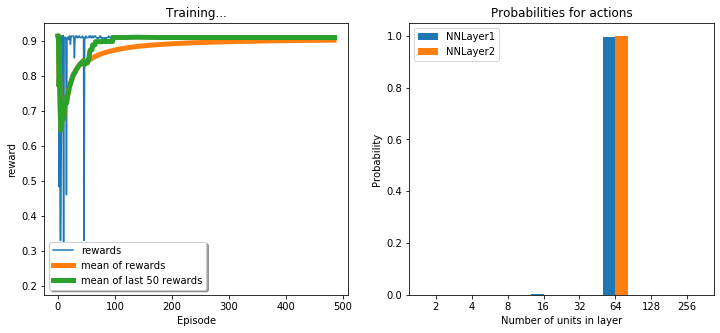

epoch 486 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

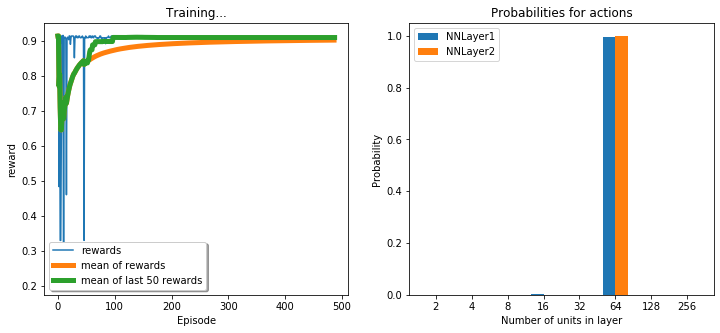

epoch 487 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

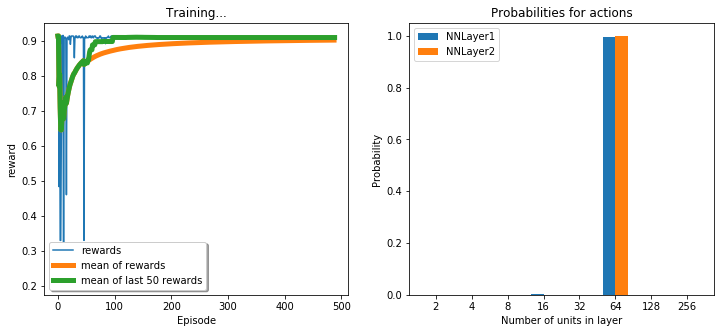

epoch 488 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

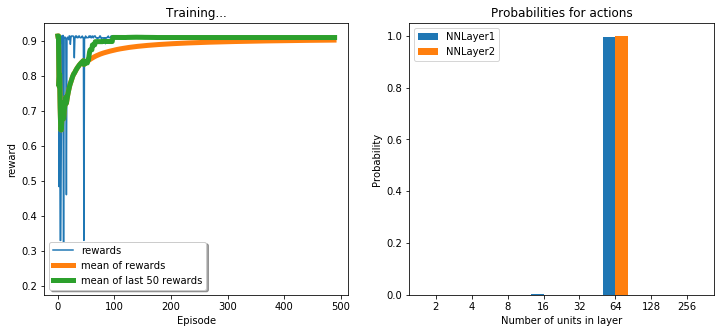

epoch 489 
Network (64, 64) accuracy:0.909, average rewards: 0.901


<Figure size 432x288 with 0 Axes>

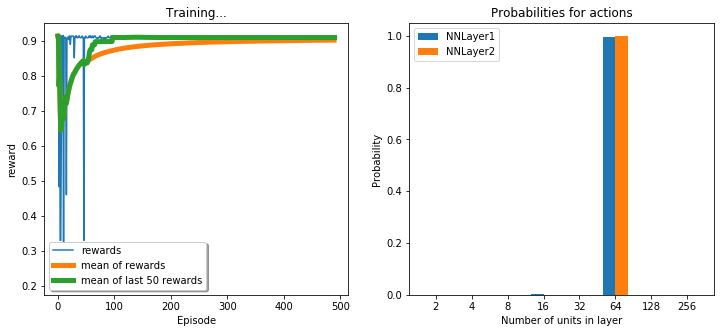

epoch 490 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

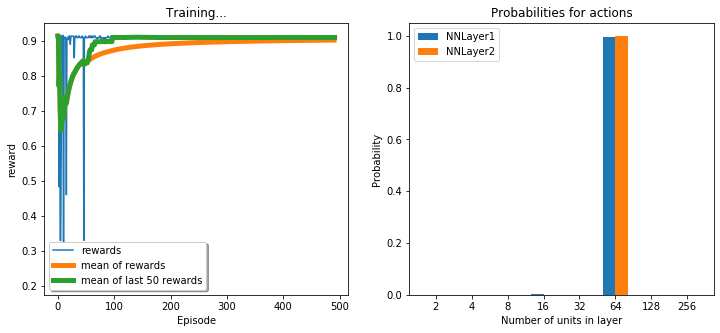

epoch 491 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

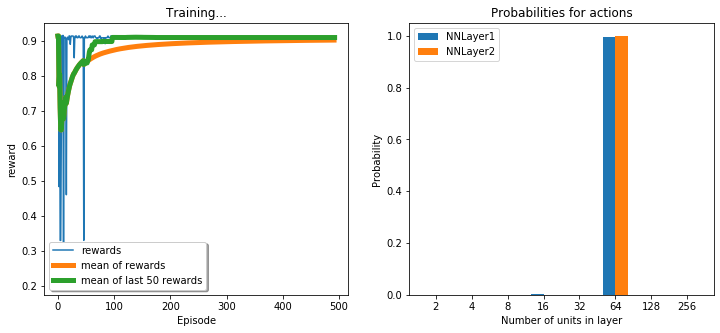

epoch 492 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

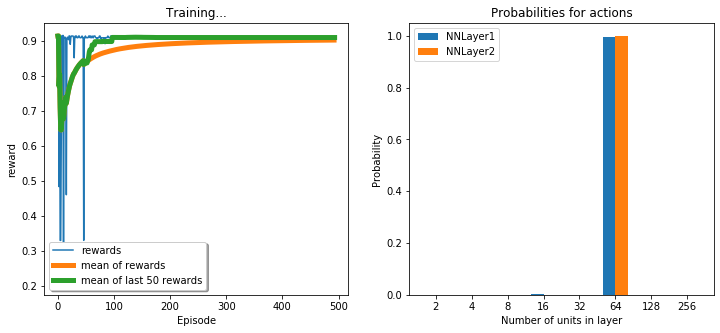

epoch 493 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

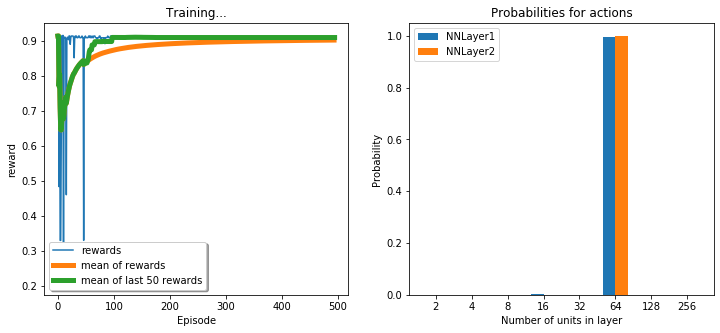

epoch 494 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

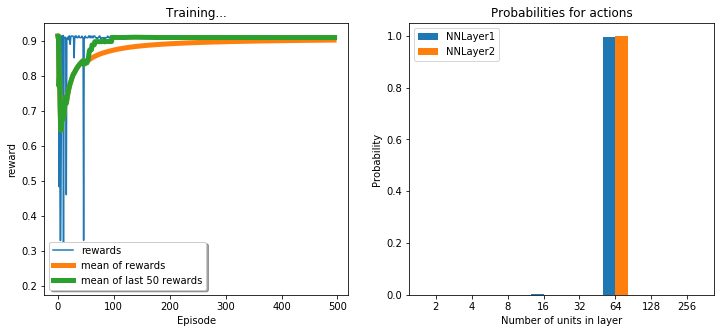

epoch 495 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

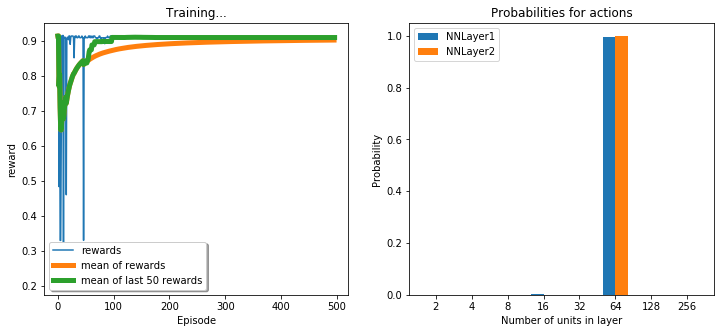

epoch 496 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

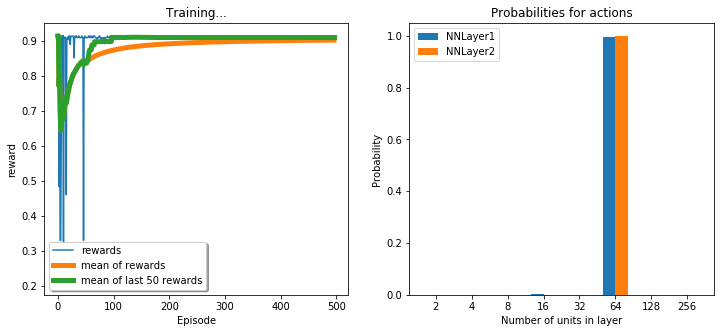

epoch 497 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

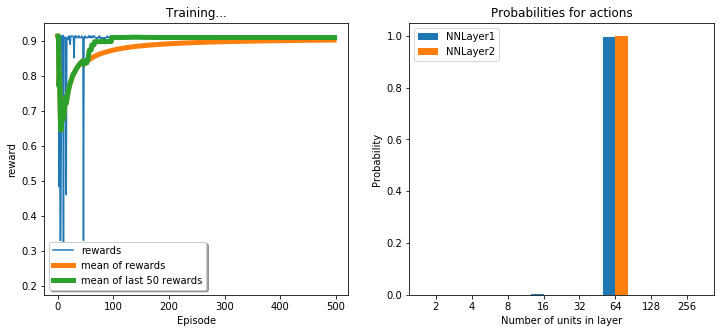

epoch 498 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

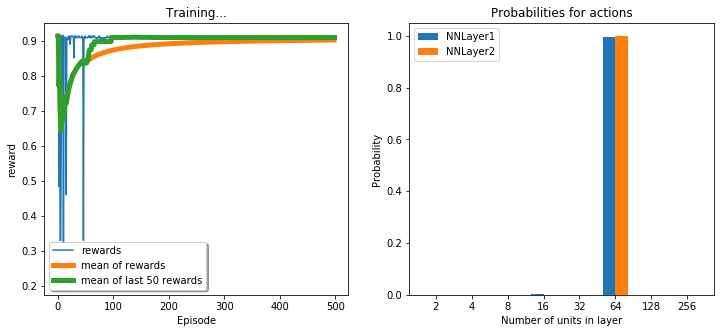

epoch 499 
Network (64, 64) accuracy:0.909, average rewards: 0.902


<Figure size 432x288 with 0 Axes>

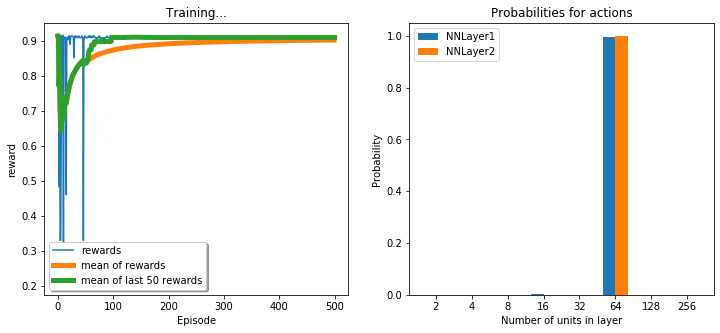

<Figure size 432x288 with 0 Axes>

In [0]:
for i in range(500):    
    state = env.reset()
    state_terminal = False
    print( "epoch %i "%(i))
    rewards.append(0)

    probs = []

    # train one network to recognize digits
    # 2 steps: 1. choose number of units for first layer; 2. for second layer
    while not state_terminal:
        steps += 1
        # calculate action and sample action according to policy
        
        action = agent.step(state)
        next_state, reward, state_terminal = env.step(action)
        agent.update(state, action, reward, next_state)
        state = next_state

        # for visualization: calculate cummulative reward of one episode     
        rewards[i] = rewards[i] + reward
        probs.append(agent.probs.detach().cpu().squeeze().numpy())

    # sum all the rewards up until this step (previous sum plus current reward
    sum_rewards.append(sum_rewards[i-1]+rewards[i] if len(sum_rewards) != 0 else rewards[0])

    print("average rewards: %.3f"%(sum_rewards[i]/(i+1) if i > 0 else sum_rewards[0]))
    plot(rewards, sum_rewards, probs)

Optional: If you train your agent several times, other non-identical preferences for actions might emerge. Think about why is this so (keyword: local-global optimum). Would it help if you add entropy of your probability distribution to your loss? In other words, that you minimize not only the loss, but also the entropy?

Number of units for a layer is not the only parameter you could change in your architecture during the metalearning search. Others could be for example filter height/width, number of filters. For more, see 

* NAS - neural architecture search with reinforcement learning, https://arxiv.org/pdf/1611.01578.pdf
* ENAS - efficient neural architecture search with parameter sharing, https://arxiv.org/pdf/1802.03268.pdf
* MetaQNN - a variant of architecture search using q-learning, https://arxiv.org/pdf/1611.02167.pdf